In [7]:
# make notebook look in correct directory
import os
os.chdir('../src/')

# load required dependencies
import util.setup as setup
import numpy as np
from util import clean_data as cd
import algos.basic as basic
import algos.similarity as sim
import experiments.static as static
import util.viz as viz
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# paths
METADATA_PATH = '../data/Phenotypic_V1_0b_preprocessed1.csv'
PREFIX = '../data/rois_ez/'
POSTFIX = '_rois_ez.1D'

# get meta-data of subjects
data, labels, num_patients = setup.get_data(METADATA_PATH, PREFIX, POSTFIX)

# mean center all of the data
data = cd.run_function(basic.mean_center, data)

# change from samples x dimensions to dimensions x samples
data = cd.run_function(basic.transpose, data)


# get lengths
lengths = map(lambda x: x.shape[1], data)
print np.max(lengths)
print np.min(lengths)
print np.mean(lengths)
# split subjects into training, testing, tuning (randomly)
n_train = 684
n_tune = 100
n_test = 100
D, L = setup.split_data(data,
                        labels,
                        n_train,
                        n_tune,
                        n_test)

315
77
191.200226244


In [8]:
# specify the model to use
model = {
    'clust' : sim.ap,
    'correl' : basic.correl,
    'thresh' : np.arange(.01, .1, .032),
    'show_plots' : True,
    'clust_params' : {
        'affinity' : 'precomputed',
        'preference' : -1,
        'damping' : .95
    }
}

In [9]:
mean_a = static.clust_corr(D['train']['a'], model)
viz.heatmap_channels(mean_a,
                     title='$M_a$',
                     xtitle='Regions of Interest',
                     ytitle='Regions of Interest',
                     ztitle='Proportion clustered together',
                     T = False)

In [10]:
mean_c = static.clust_corr(D['train']['c'], model)
viz.heatmap_channels(mean_c,
                     title='$M_c$',
                     xtitle='Regions of Interest',
                     ytitle='Regions of Interest',
                     ztitle='Proportion clustered together',
                     T = False)

In [11]:
diff = mean_a - mean_c
viz.heatmap_channels(diff,
                     title='$M_{a - c}$',
                     xtitle='Regions of Interest',
                     ytitle='Regions of Interest',
                     ztitle='Proportion clustered together',
                     T = False)
bl = static.block_rep(D['tune'], model)

In [12]:
H = model['thresh']
accuracies = []
thresholds = []
for low in H:
    for high in H[H > low]:
        threshold = (low, high)
        acc, _, _ = static.thresh_simple(bl,
                                   L['tune'],
                                   diff,
                                   threshold,
                                   False)
        accuracies.append(acc)
        thresholds.append(threshold)
best_tune_acc = np.max(accuracies)
best_thresh = thresholds[np.argmax(accuracies)]
print 'Best Tuning Accuracy: ', best_tune_acc
#best_diff = diff.copy()
#best_diff[np.abs(best_diff) > best_thresh] = 0
#viz.heatmap_channels(best_diff,
#                     title='ASD - Control Correlations',
#                     xtitle='Channels',
#                     ytitle='Channels',
#                     ztitle='Prop. clustered together',
#                     T = True)

Best Tuning Accuracy:  0.53


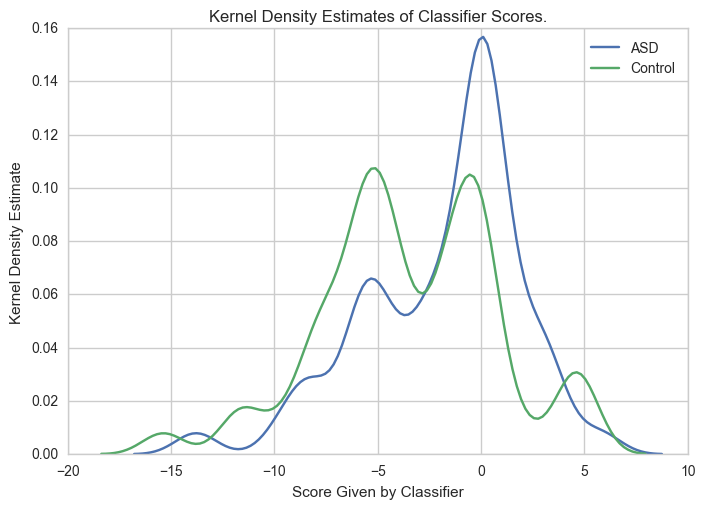

Test Accuracy:  0.61
Test Precision 0.657142857143
Test Recall 0.46


In [13]:
bl = static.block_rep(D['test'], model)
acc, prec, rec = static.thresh_simple(bl,
                           L['test'],
                           diff,
                           best_thresh,
                           True)
print 'Test Accuracy: ', acc
print 'Test Precision', prec
print 'Test Recall', rec

In [14]:
low, high = best_thresh
difference = diff.copy()
difference[np.abs(difference) < low] = 0
difference[np.abs(difference) > high] = 0
difference = difference - np.mean(difference)
bl = static.block_rep(D['test'], model)
evidence = map(lambda x: np.sum((x * difference)), bl)
evidence = np.array(evidence)

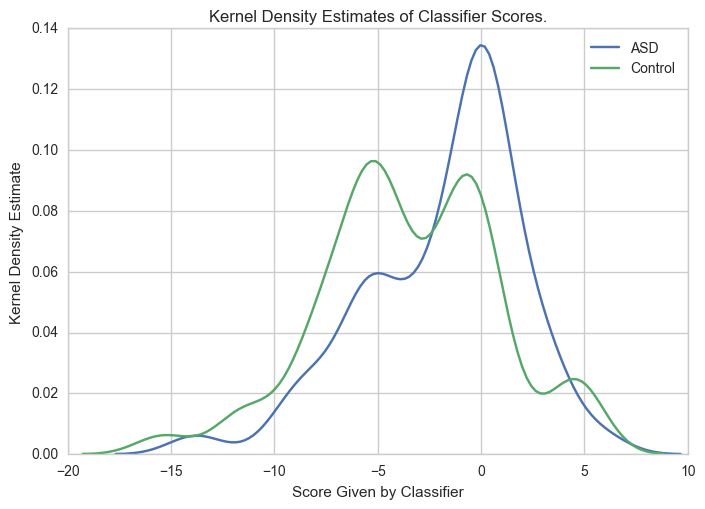

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
ev_a = evidence[L['test'] == 1]
ev_c = evidence[L['test'] == 2]
band = 1.3
sns.kdeplot(np.array(ev_a), bw = band, label='ASD')
sns.kdeplot(np.array(ev_c), bw = band, label = 'Control')
plt.title("Kernel Density Estimates of Classifier Scores.")
plt.xlabel("Score Given by Classifier")
plt.ylabel("Kernel Density Estimate")
plt.show()

Evaluating:  {'clust_params': {'affinity': 'precomputed', 'gamma': 0.25, 'n_clusters': 12}}


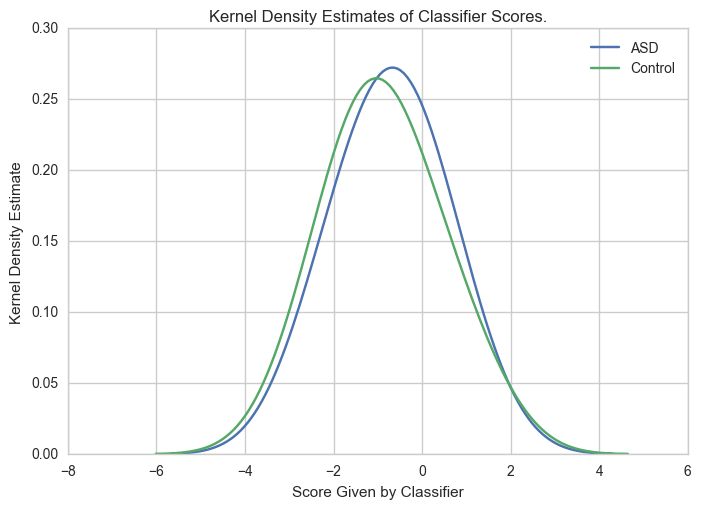

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'gamma': 1, 'n_clusters': 12}}


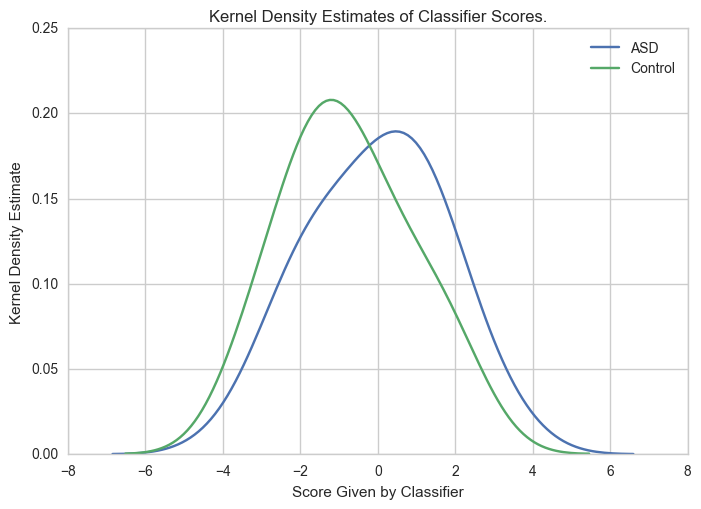

Accuracy:  0.64
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'gamma': 4, 'n_clusters': 12}}


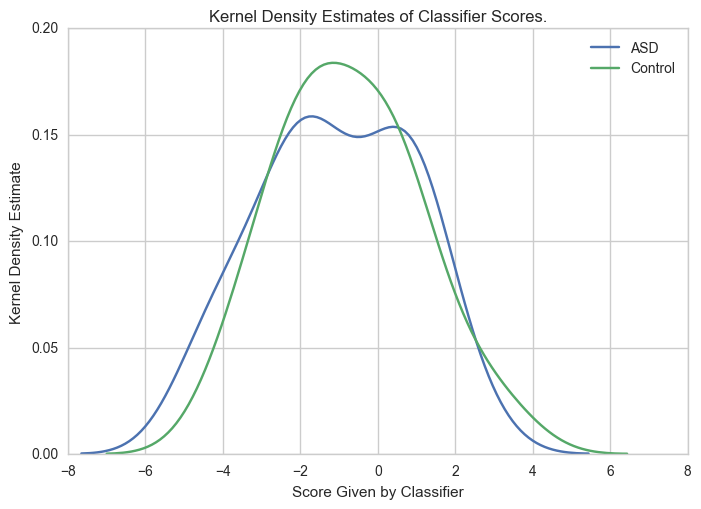

Accuracy:  0.52
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'gamma': 10, 'n_clusters': 12}}


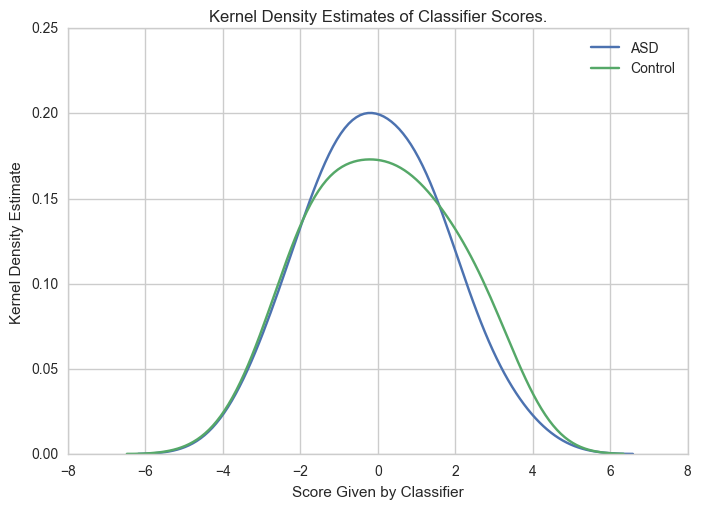

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'gamma': 0.25, 'n_clusters': 15}}


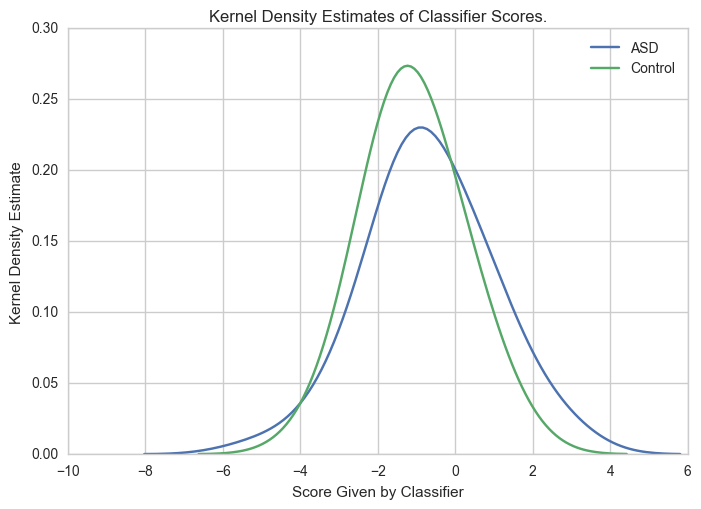

Accuracy:  0.57
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'gamma': 1, 'n_clusters': 15}}


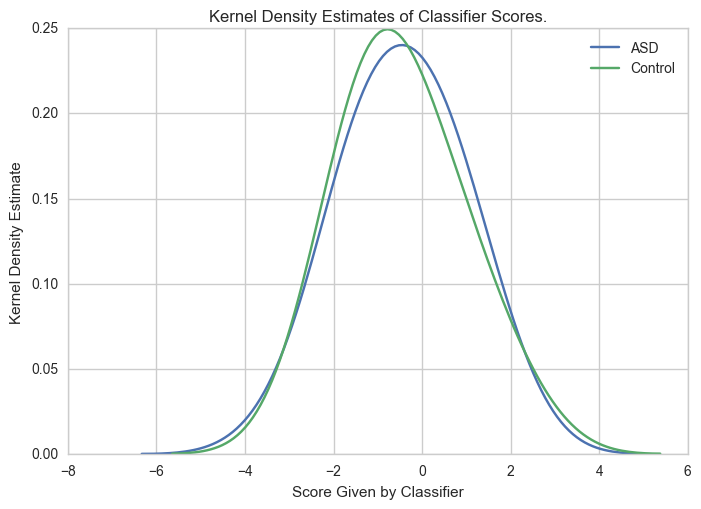

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'gamma': 4, 'n_clusters': 15}}


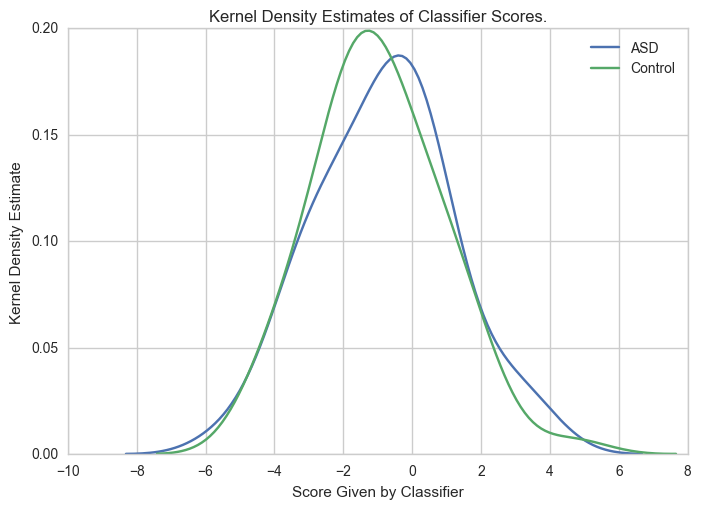

Accuracy:  0.57
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'gamma': 10, 'n_clusters': 15}}


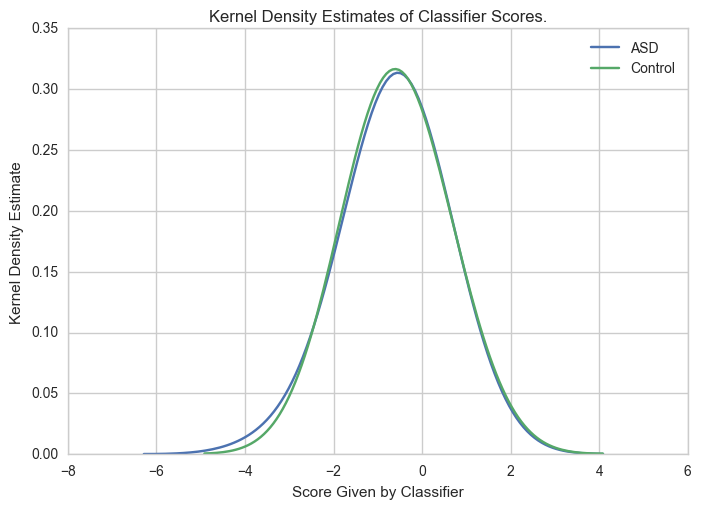

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'gamma': 0.25, 'n_clusters': 17}}


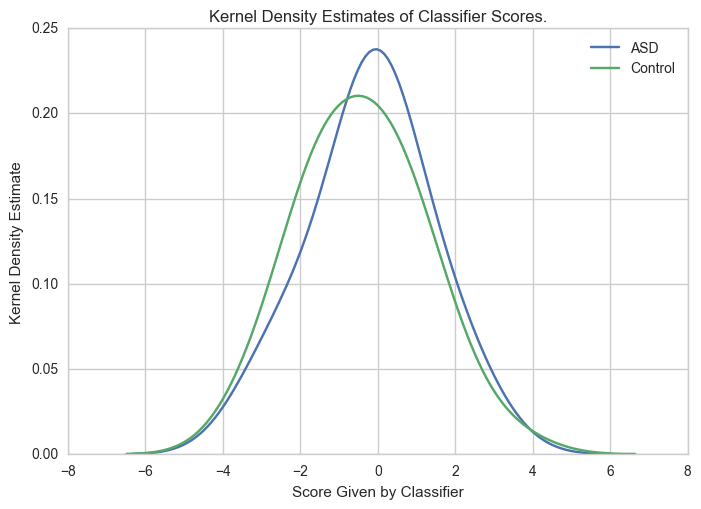

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'gamma': 1, 'n_clusters': 17}}


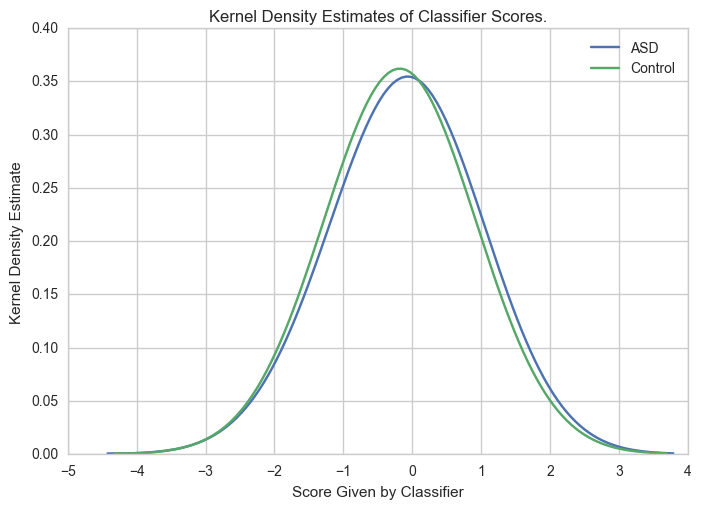

Accuracy:  0.61
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'gamma': 4, 'n_clusters': 17}}


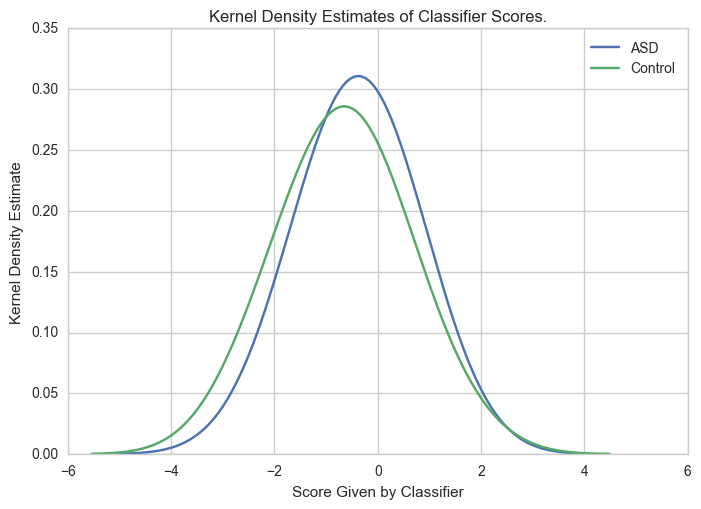

Accuracy:  0.56
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'gamma': 10, 'n_clusters': 17}}


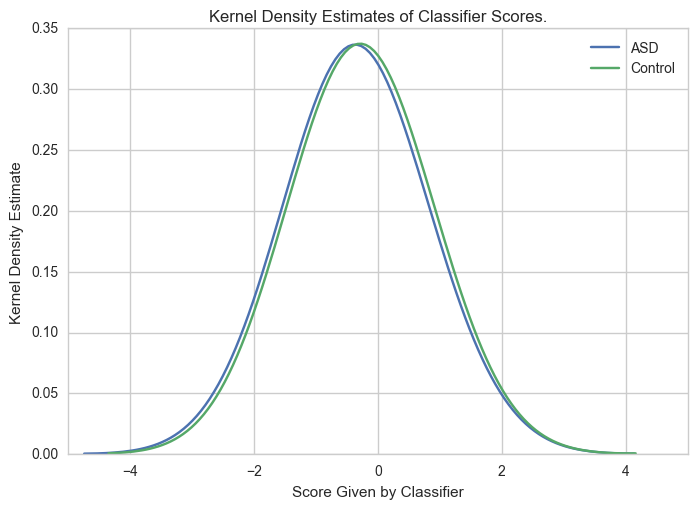

Accuracy:  0.46


ValueError: setting an array element with a sequence.

In [6]:
# make notebook look in correct directory
import os
os.chdir('../src/')
import util.setup as setup
import numpy as np
from util import clean_data as cd
import algos.basic as basic
import algos.similarity as sim
import experiments.static as static
import util.viz as viz
import experiments.rando as rando
model = {
    'clust' : sim.spec,
    'correl' : sim.dtw,
    'thresh' : np.arange(.01, .1, .032),
    'show_plots' : False
}
cp = []
n_clust_options = [12, 15, 17]
gamma_options = [.25, 1, 4, 10]
for n in n_clust_options:
    for g in gamma_options:
        p = {
            'clust_params' : {
                'affinity' : 'precomputed',
                'n_clusters' : n,
                'gamma' : g
            }
        }
        cp.append(p)
accs = rando.hyper_search(model, cp)
import matplotlib.pyplot as plt
plt.hist(accs)
plt.show()

Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.5, 'preference': -1}}


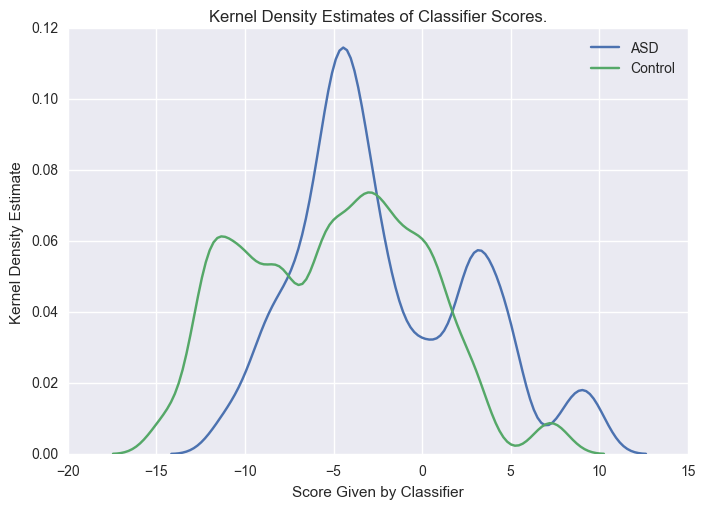

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.5, 'preference': -0.75}}


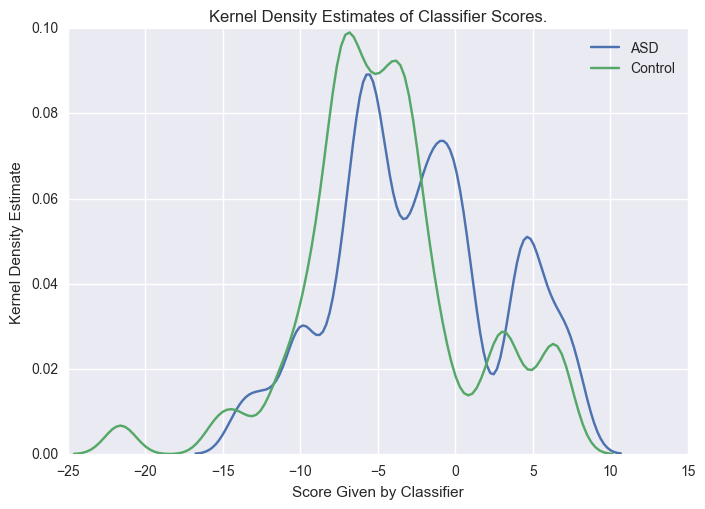

Accuracy:  0.62
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.5, 'preference': -0.5}}


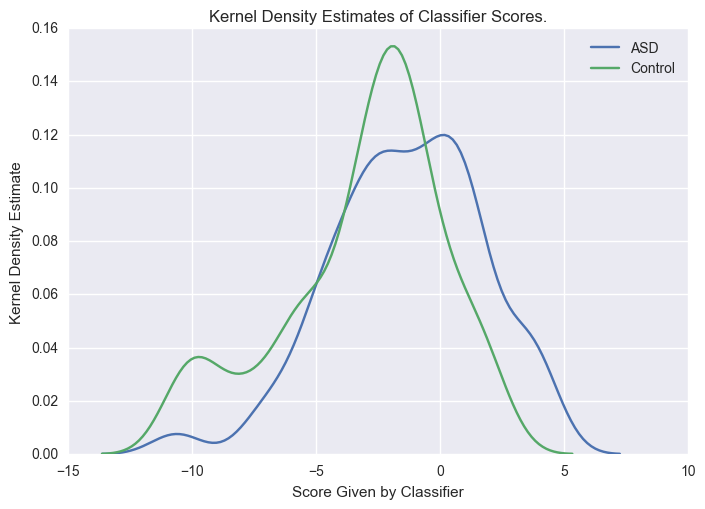

Accuracy:  0.6
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.5, 'preference': -0.25}}


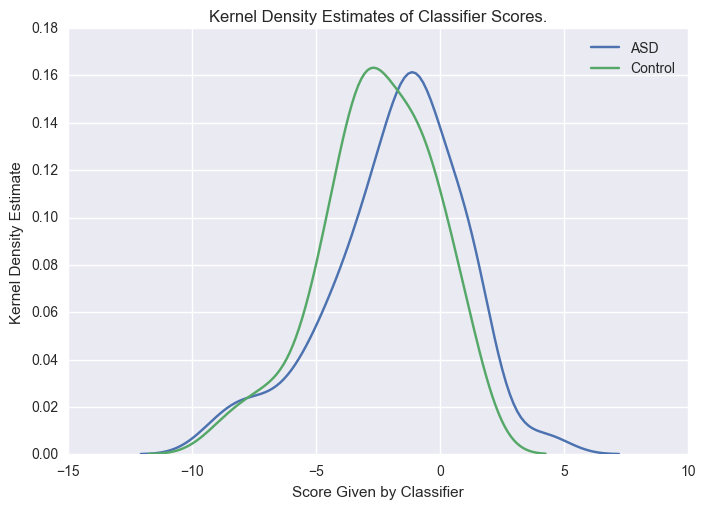

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.5, 'preference': 0}}


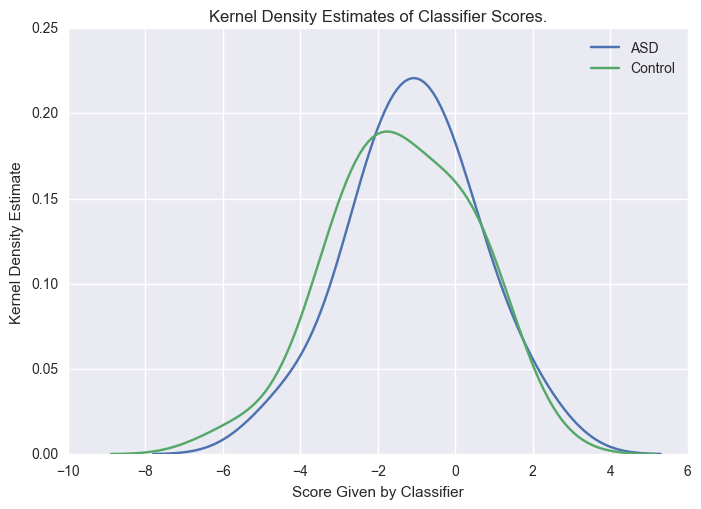

Accuracy:  0.5
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.65, 'preference': -1}}


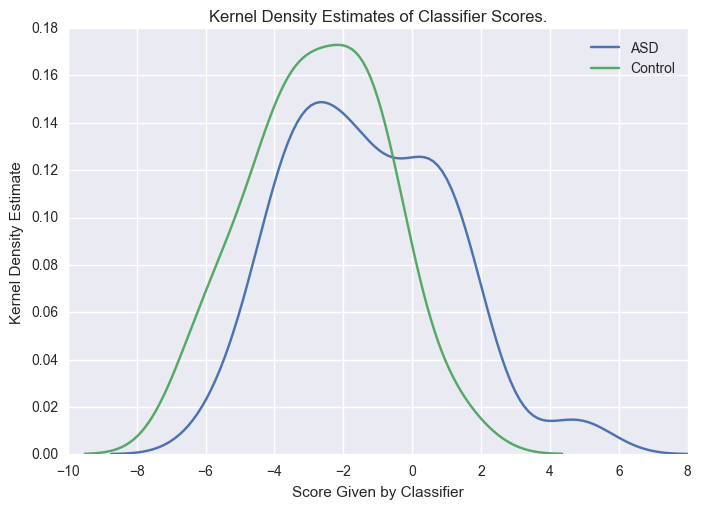

Accuracy:  0.61
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.65, 'preference': -0.75}}


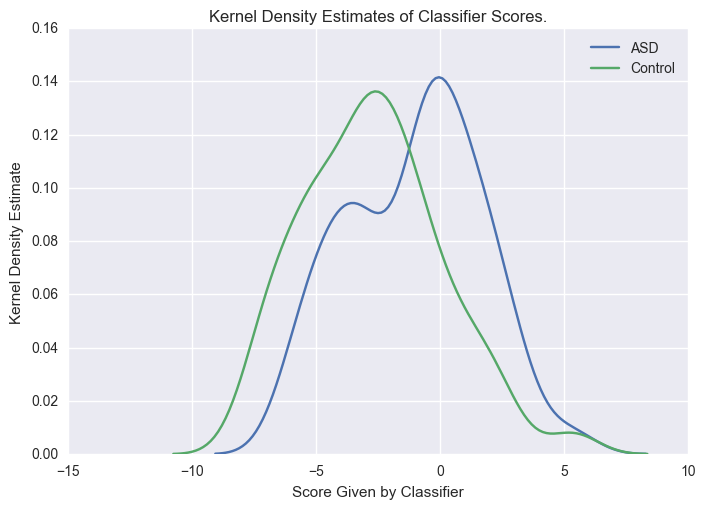

Accuracy:  0.61
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.65, 'preference': -0.5}}


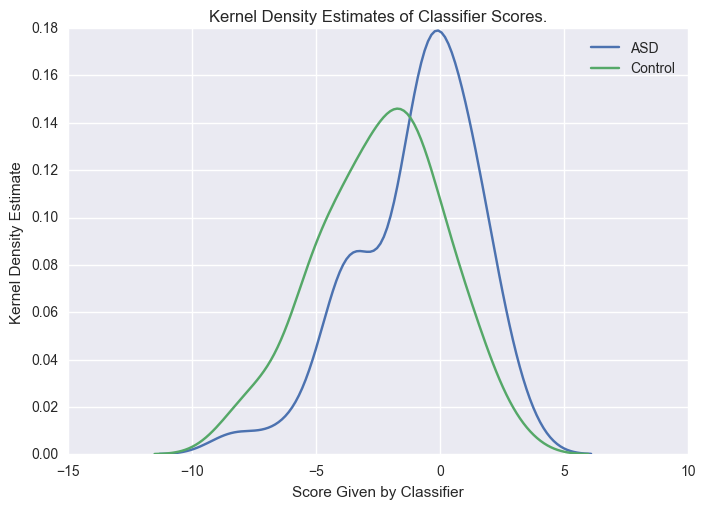

Accuracy:  0.61
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.65, 'preference': -0.25}}


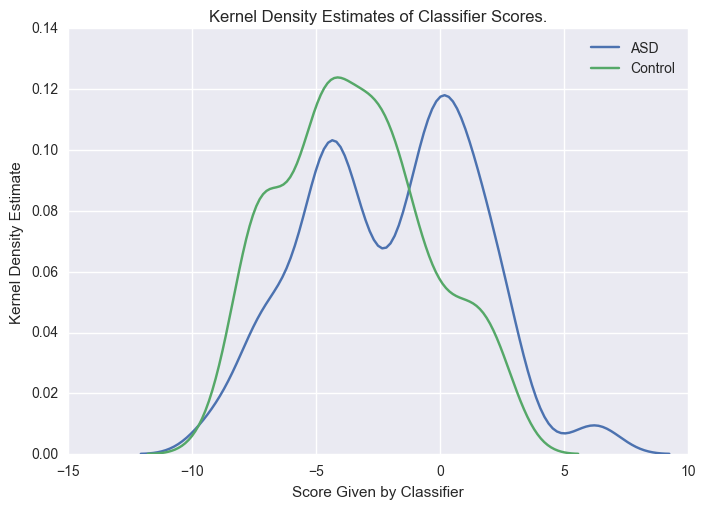

Accuracy:  0.63
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.65, 'preference': 0}}


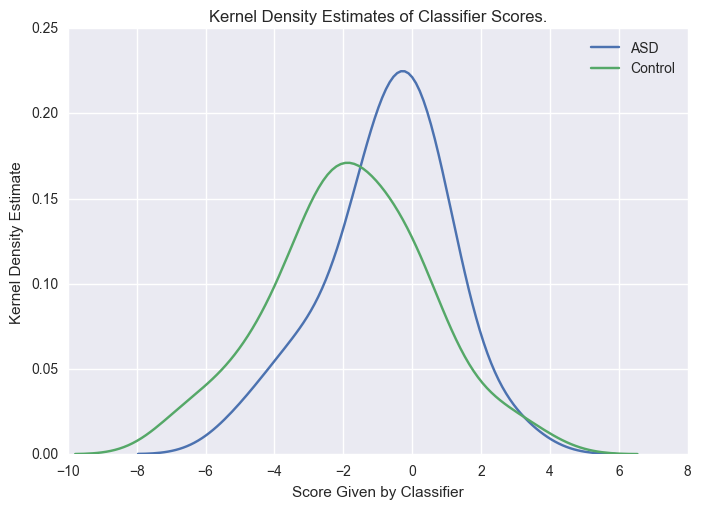

Accuracy:  0.6
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.8, 'preference': -1}}


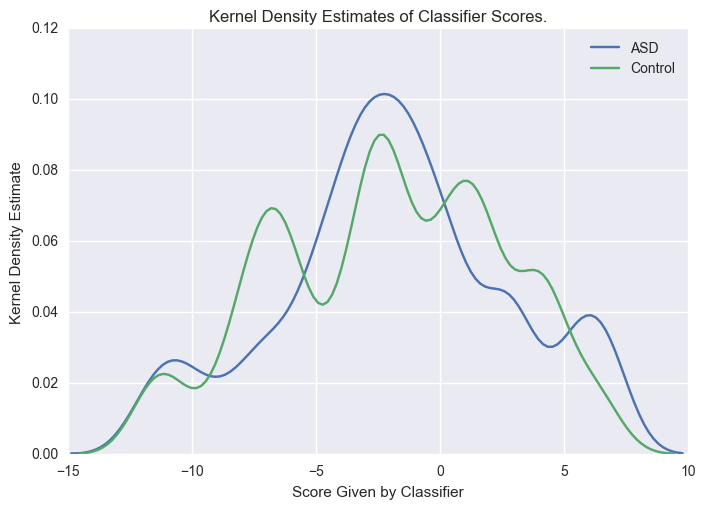

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.8, 'preference': -0.75}}


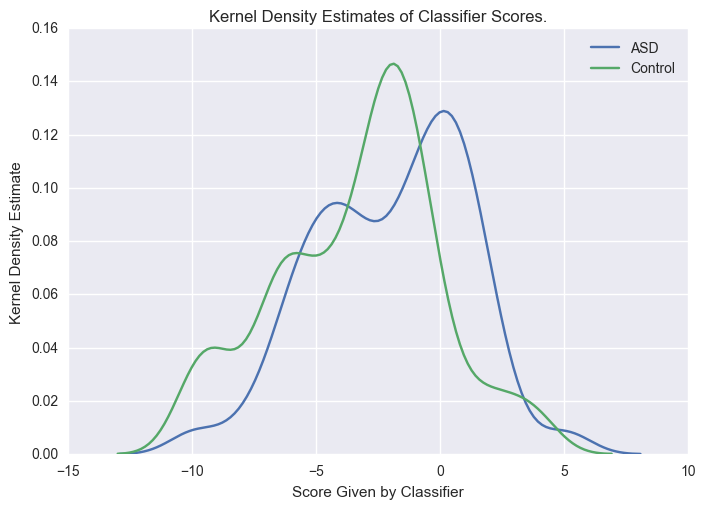

Accuracy:  0.62
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.8, 'preference': -0.5}}


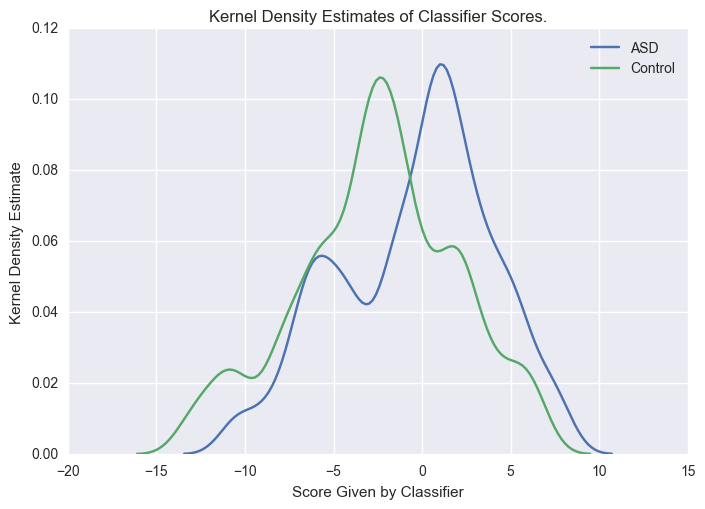

Accuracy:  0.64
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.8, 'preference': -0.25}}


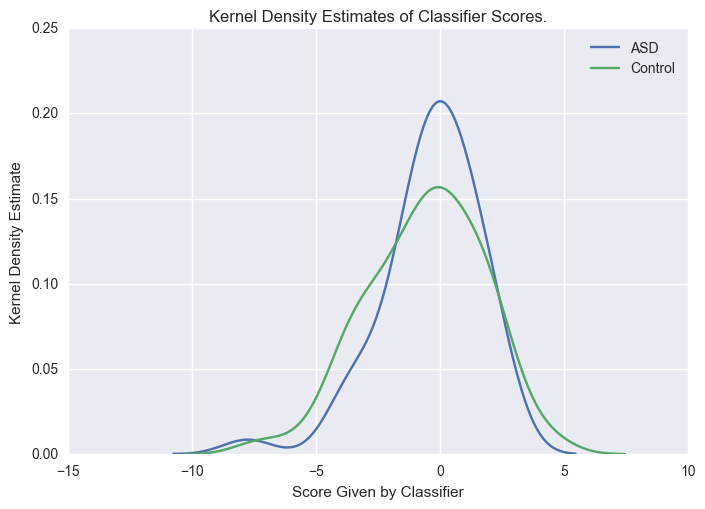

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.8, 'preference': 0}}


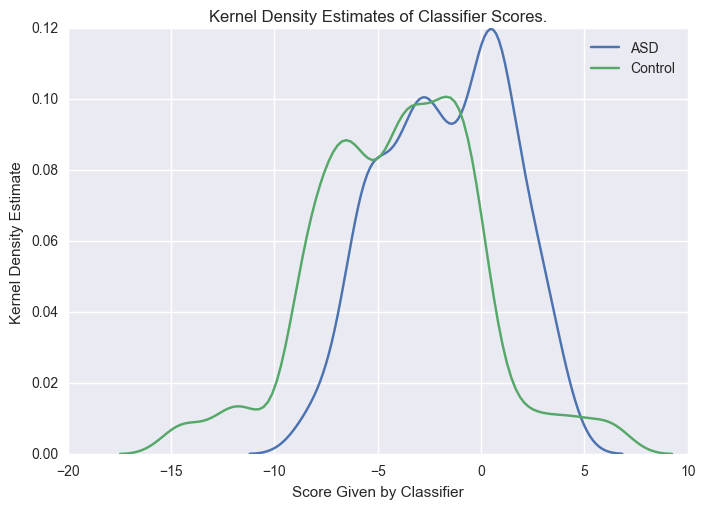

Accuracy:  0.65
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.95, 'preference': -1}}


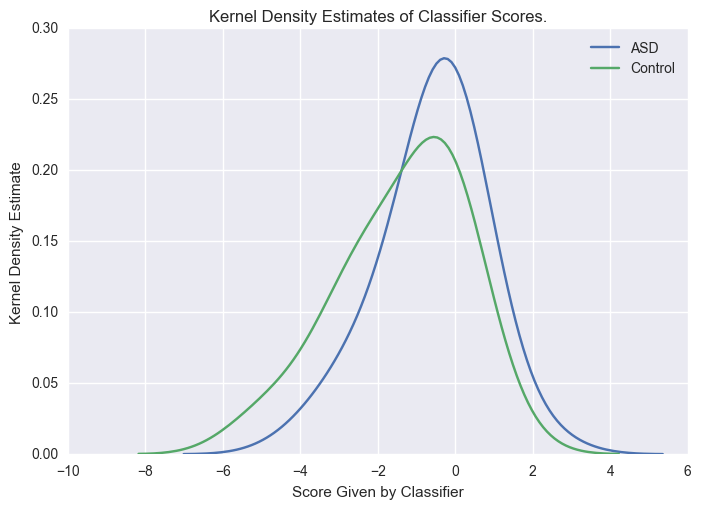

Accuracy:  0.59
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.95, 'preference': -0.75}}


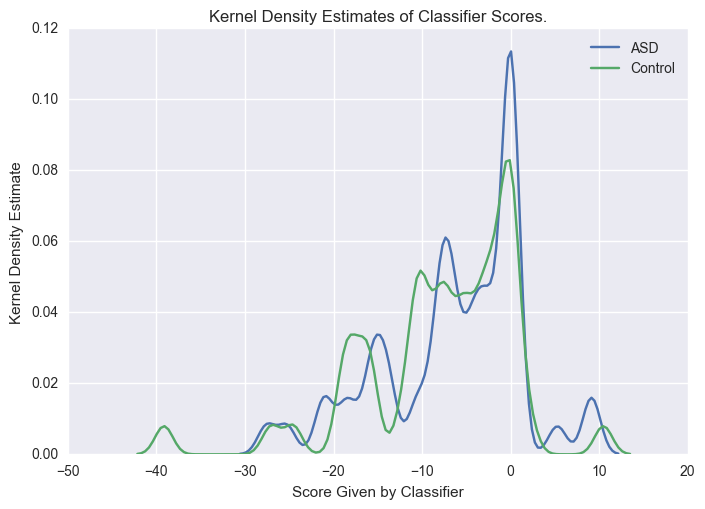

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.95, 'preference': -0.5}}


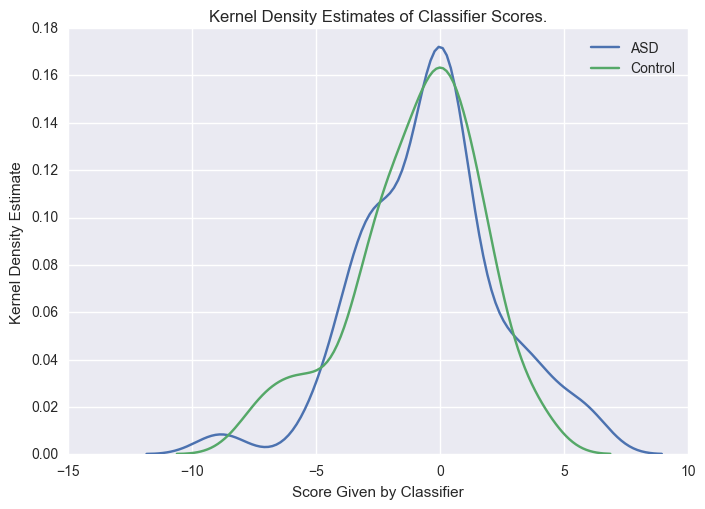

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.95, 'preference': -0.25}}


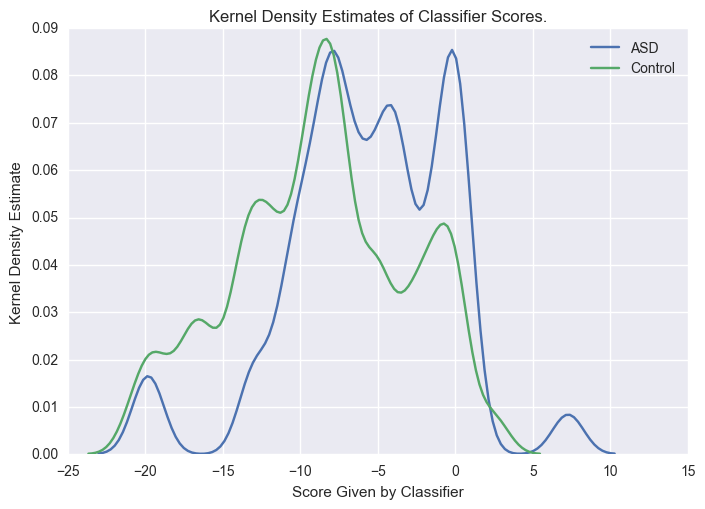

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'damping': 0.95, 'preference': 0}}


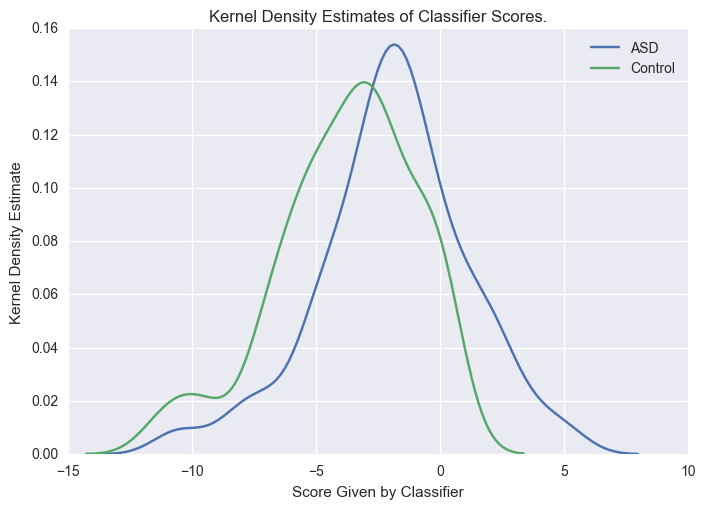

Accuracy:  0.62


ValueError: setting an array element with a sequence.

In [1]:
# make notebook look in correct directory
import os
os.chdir('../src/')
import util.setup as setup
import numpy as np
from util import clean_data as cd
import algos.basic as basic
import algos.similarity as sim
import experiments.static as static
import util.viz as viz
import experiments.rando as rando
model = {
    'clust' : sim.ap,
    'correl' : basic.correl,
    'thresh' : np.arange(.01, .1, .032),
    'show_plots' : False
}
cp = []
damping_options = [.5, .65, .8, .95]
pref_options = [-1, -.75, -.5, -.25, 0]
for d in damping_options:
    for pref in pref_options:
        p = {
            'clust_params' : {
                'affinity' : 'precomputed',
                'damping' : d,
                'preference' : pref
            }
        }
        cp.append(p)
accs = rando.hyper_search(model, cp)
import matplotlib.pyplot as plt
plt.hist(accs)
plt.show()

Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 0}}


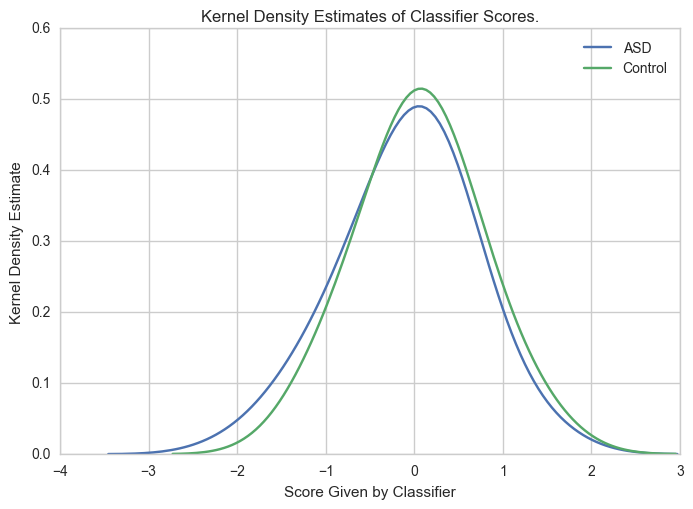

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 1}}


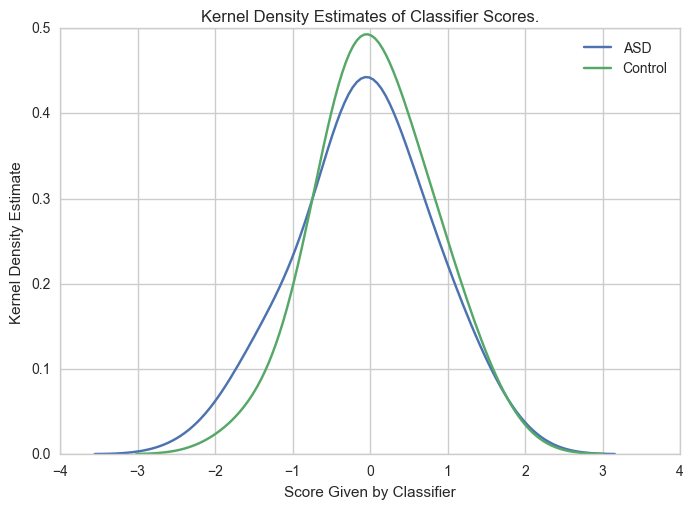

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 2}}


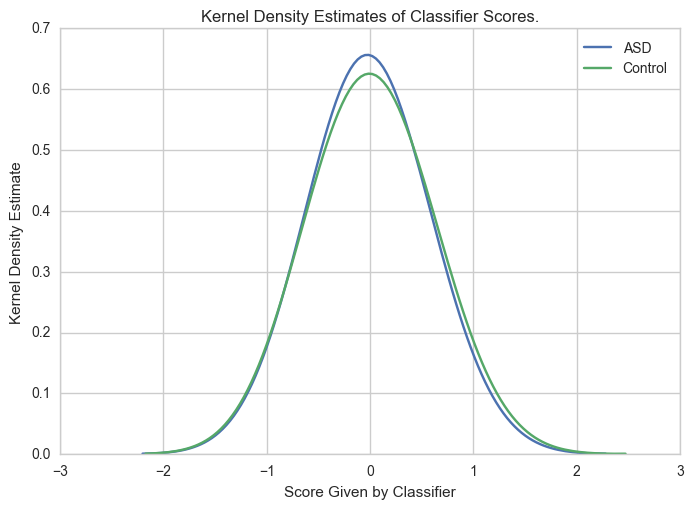

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 3}}


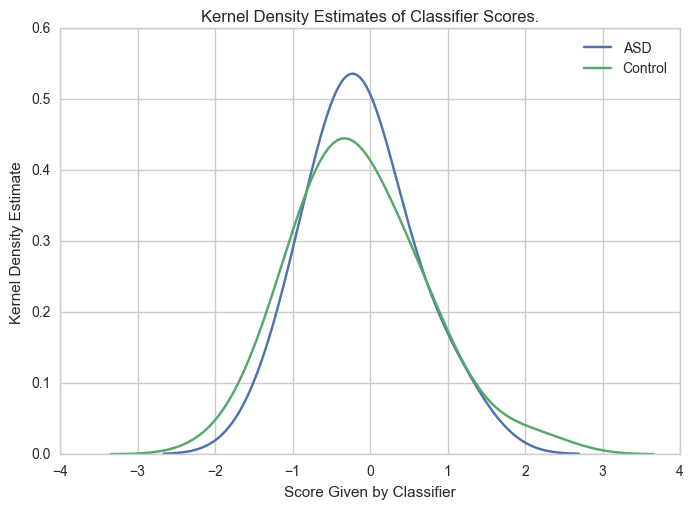

Accuracy:  0.52
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 4}}


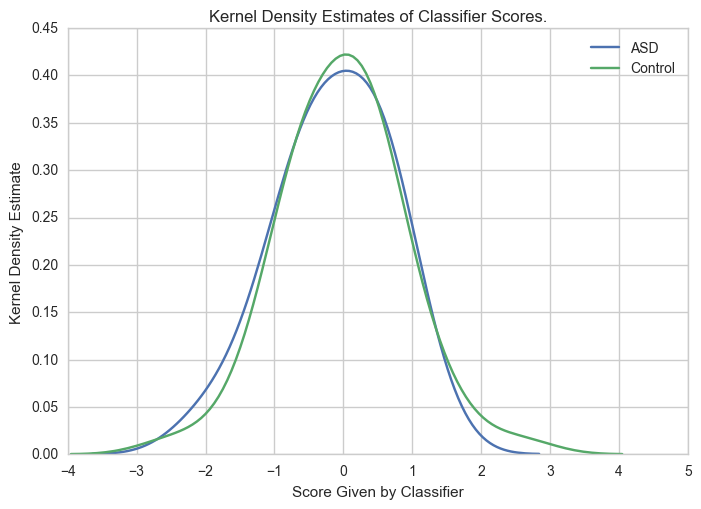

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 5}}


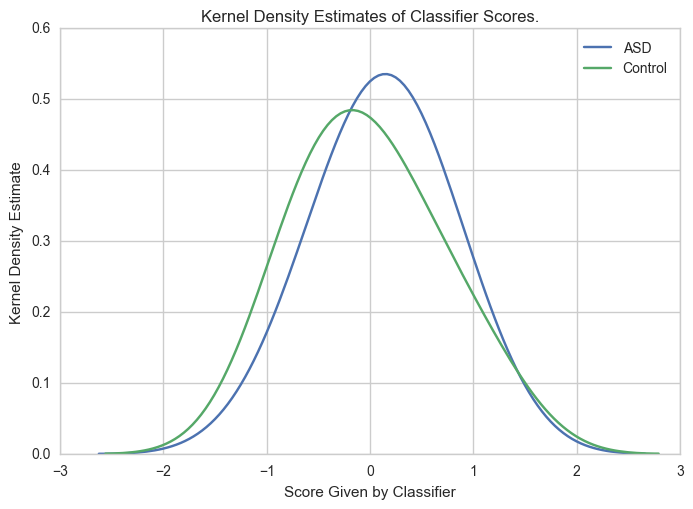

Accuracy:  0.58
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 6}}


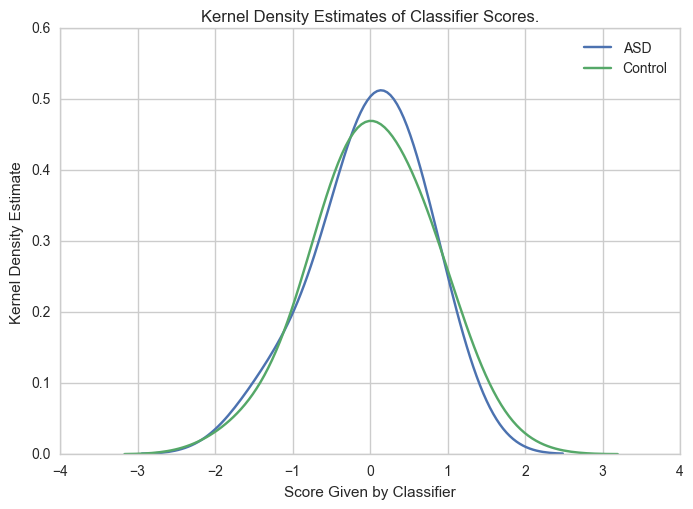

Accuracy:  0.51
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 7}}


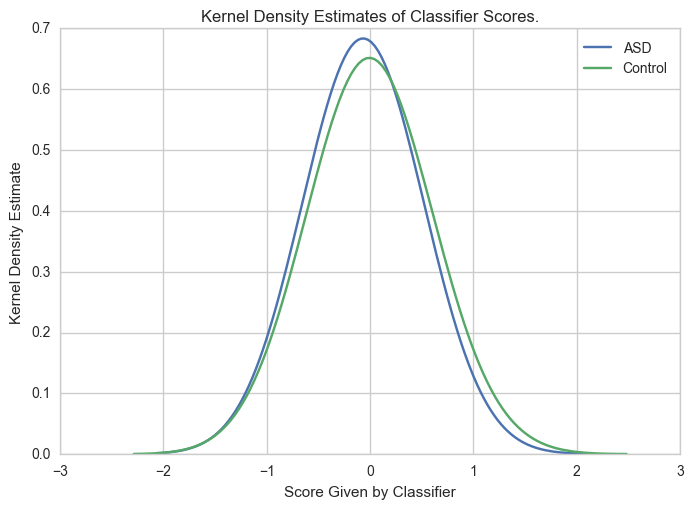

Accuracy:  0.46
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 8}}


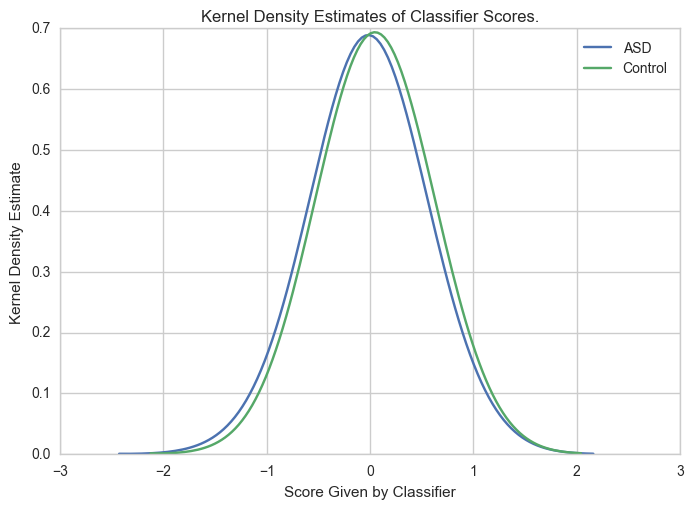

Accuracy:  0.45
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 9}}


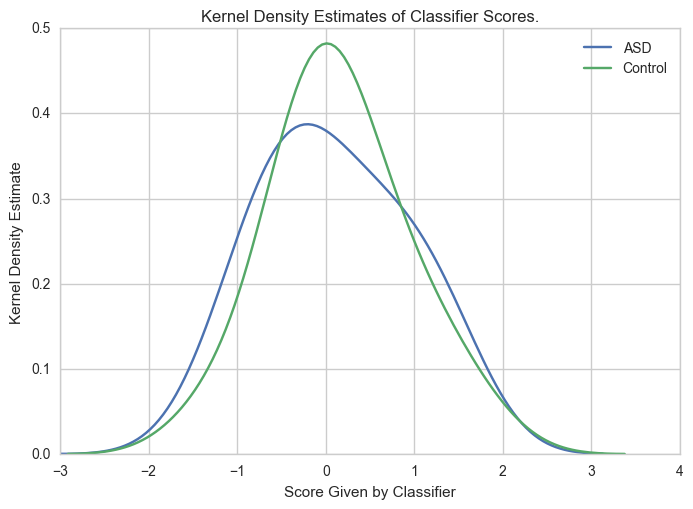

Accuracy:  0.46
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 10}}


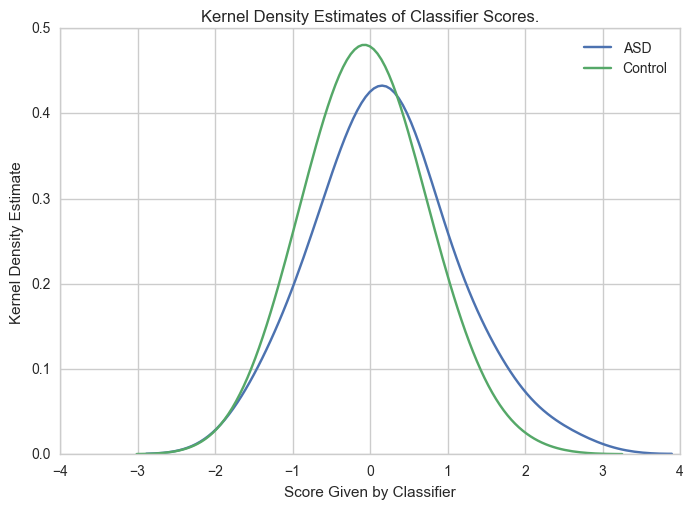

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 11}}


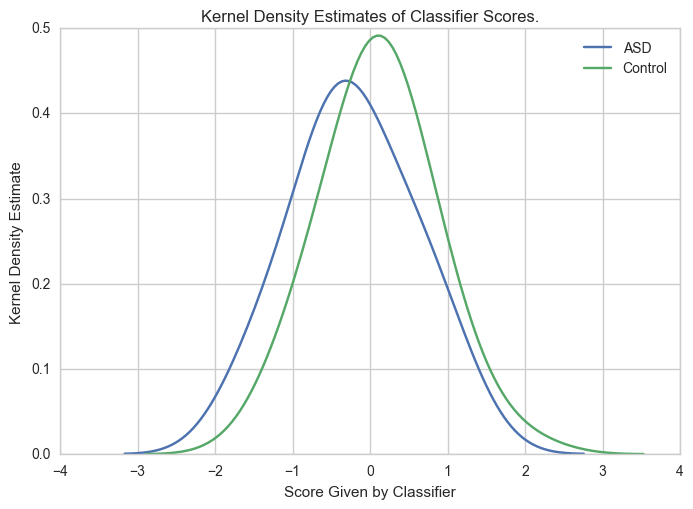

Accuracy:  0.4
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 12}}


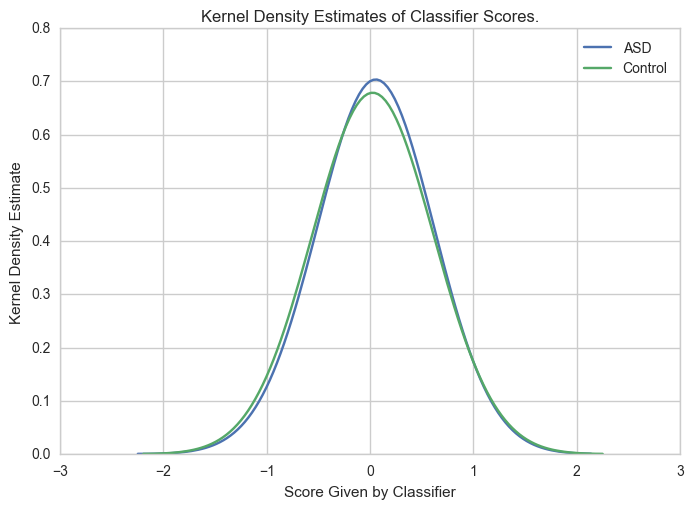

Accuracy:  0.5
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 13}}


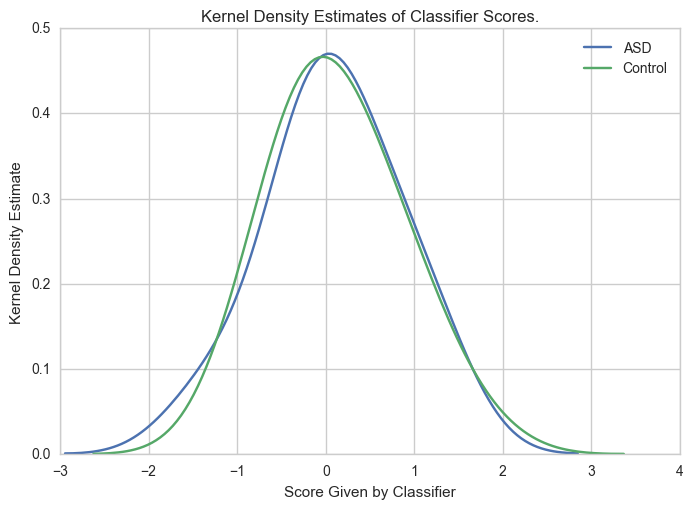

Accuracy:  0.51
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 14}}


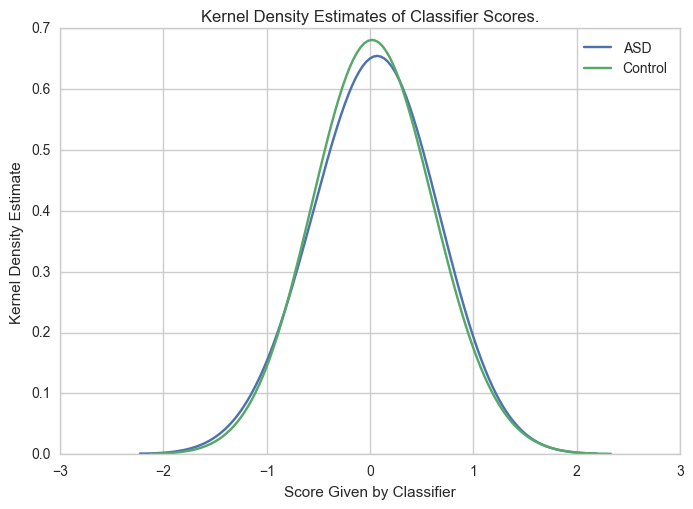

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 15}}


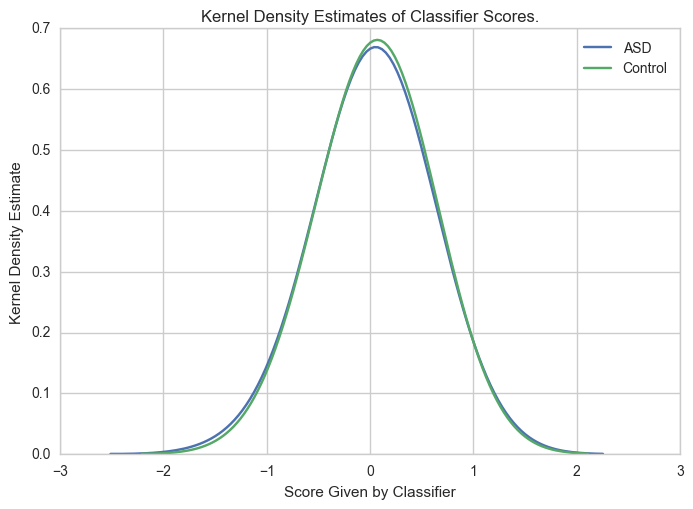

Accuracy:  0.46
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 16}}


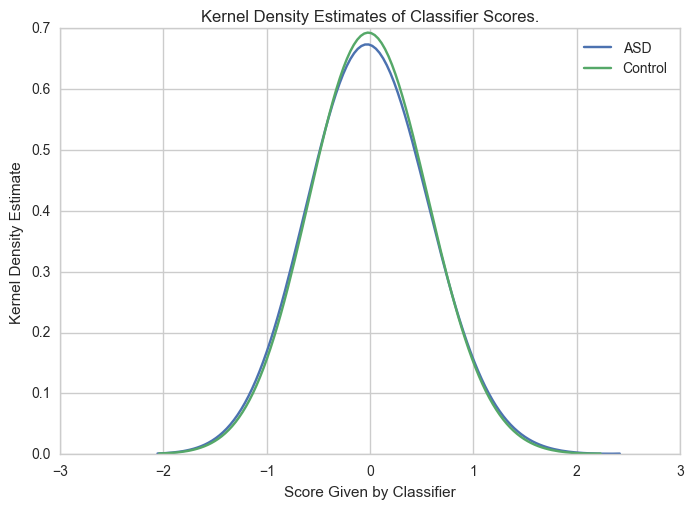

Accuracy:  0.46
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 17}}


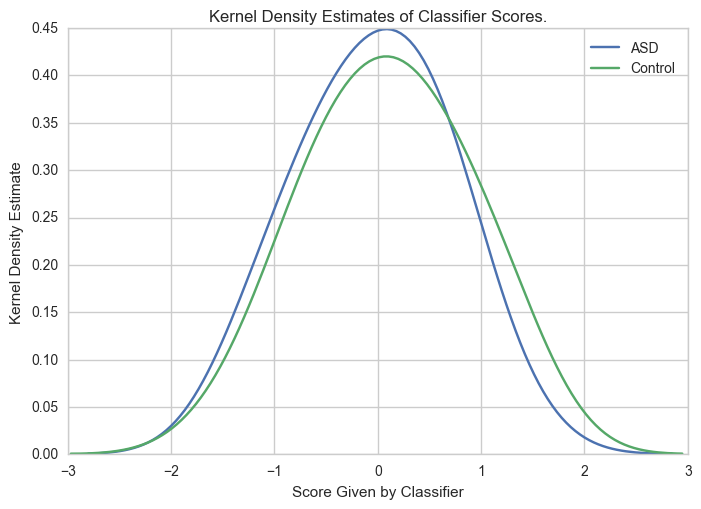

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 18}}


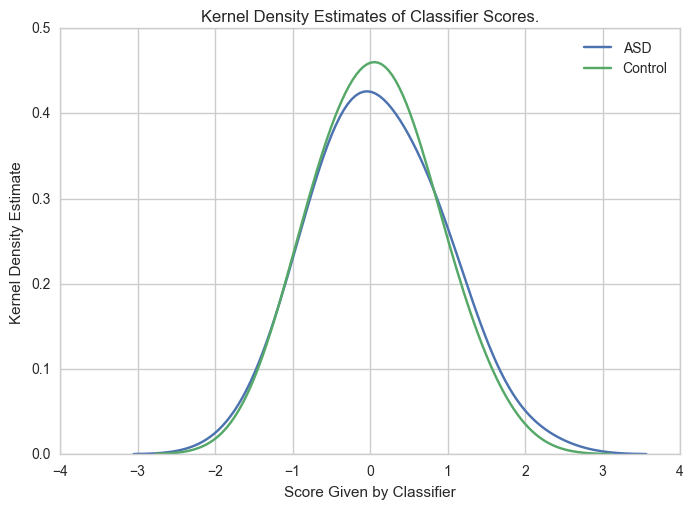

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 19}}


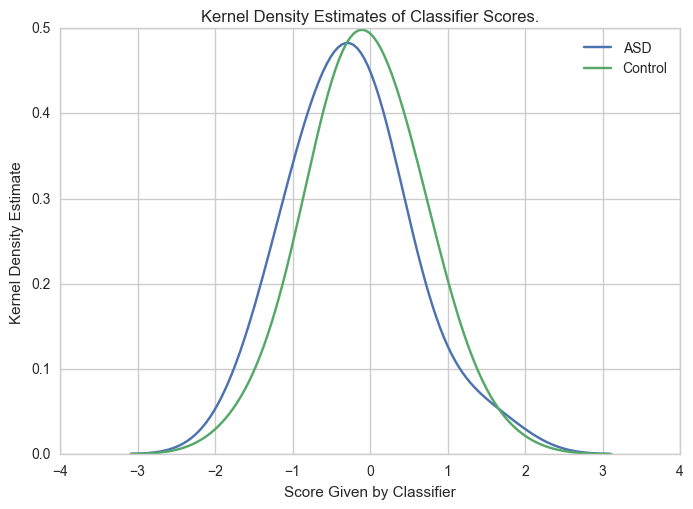

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 20}}


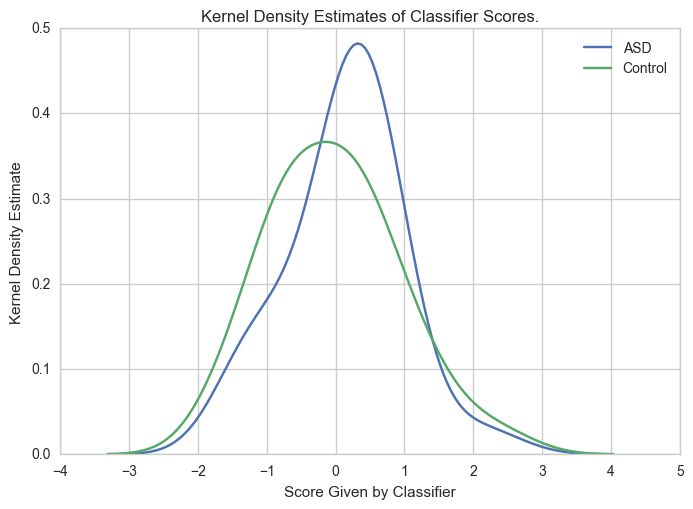

Accuracy:  0.59
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 21}}


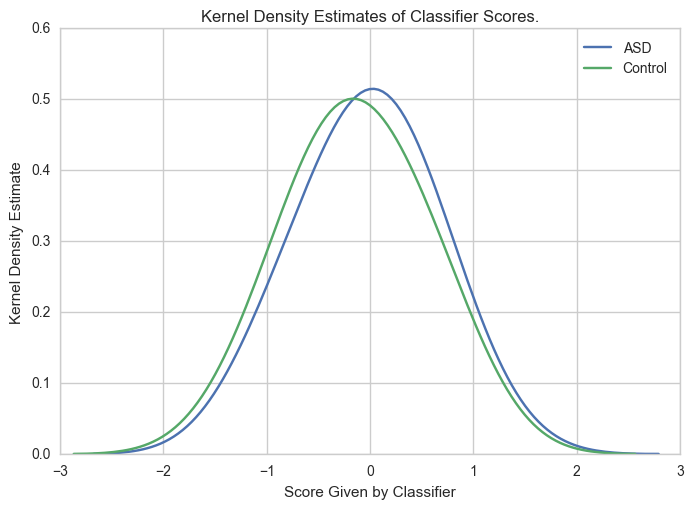

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 22}}


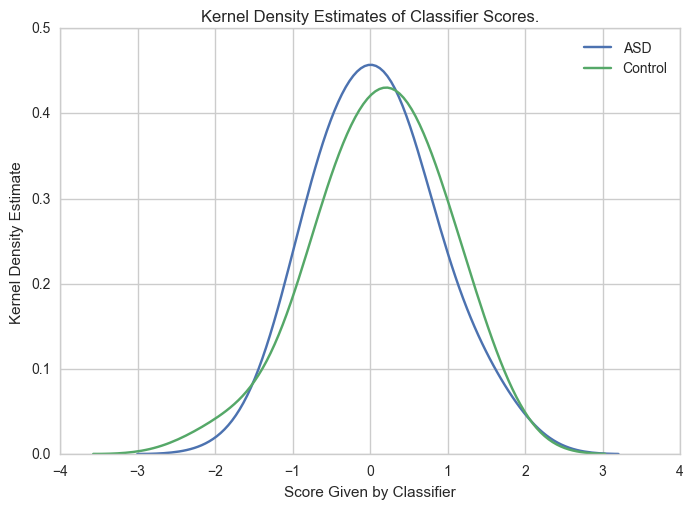

Accuracy:  0.45
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 23}}


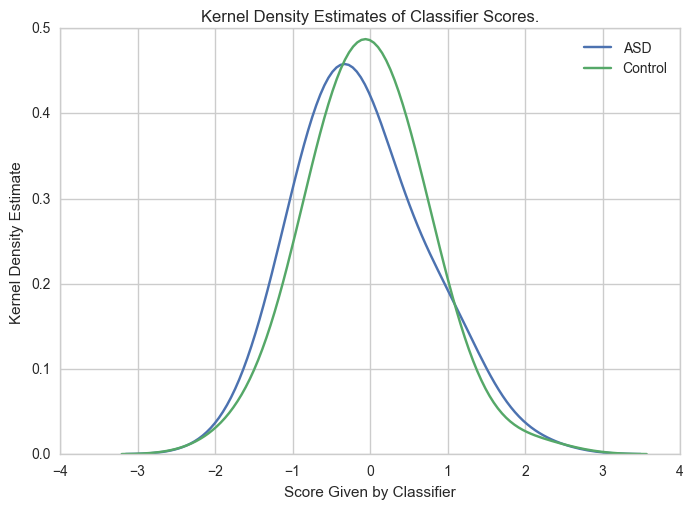

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 24}}


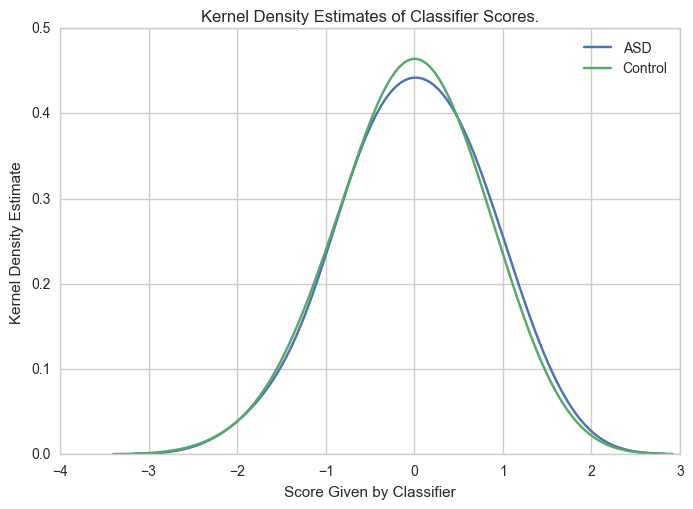

Accuracy:  0.5
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 25}}


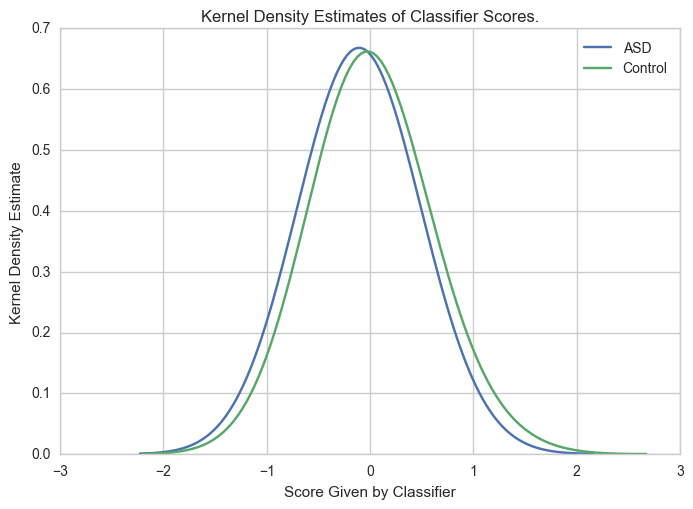

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 26}}


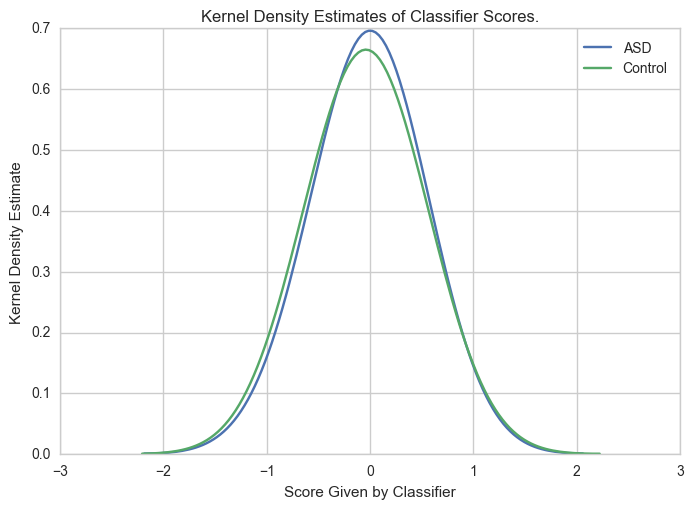

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 27}}


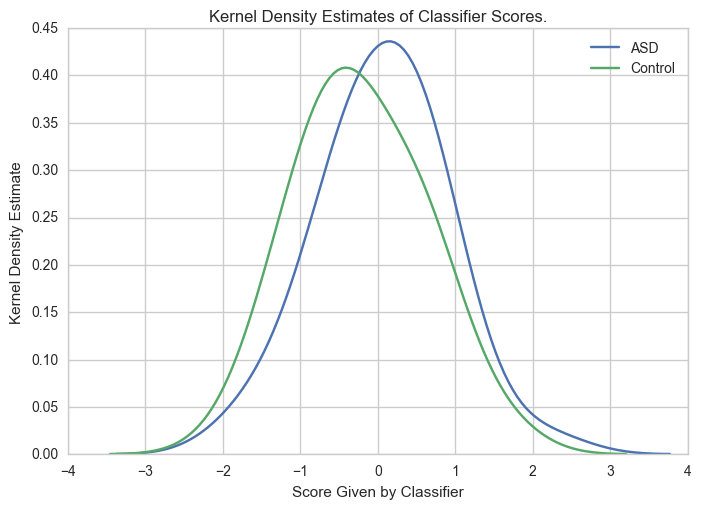

Accuracy:  0.58
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 28}}


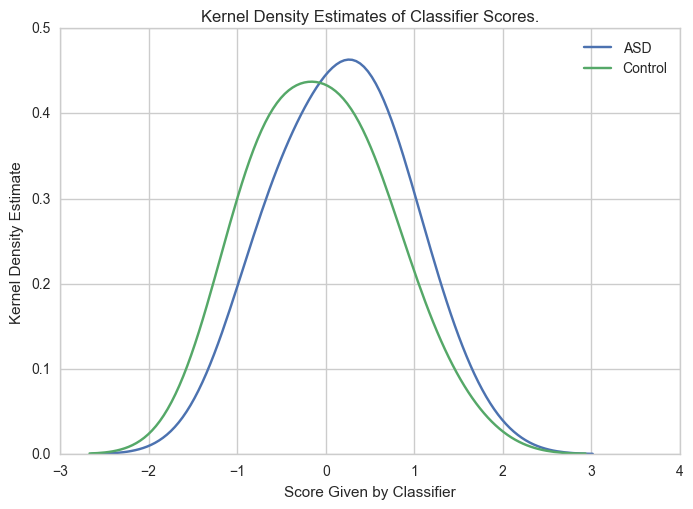

Accuracy:  0.61
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 29}}


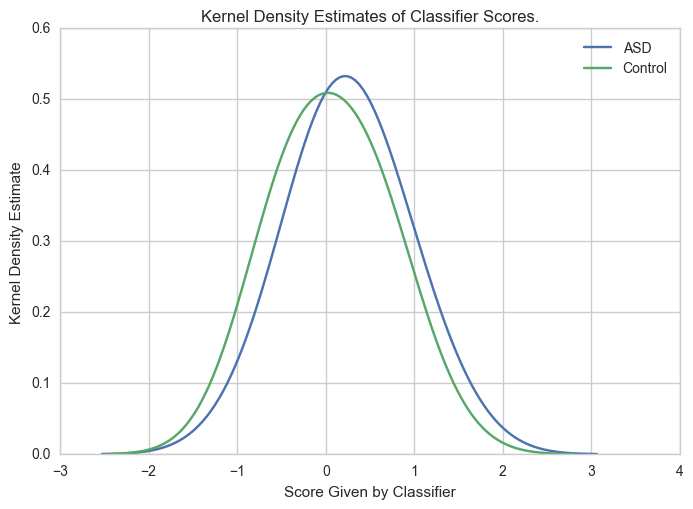

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 30}}


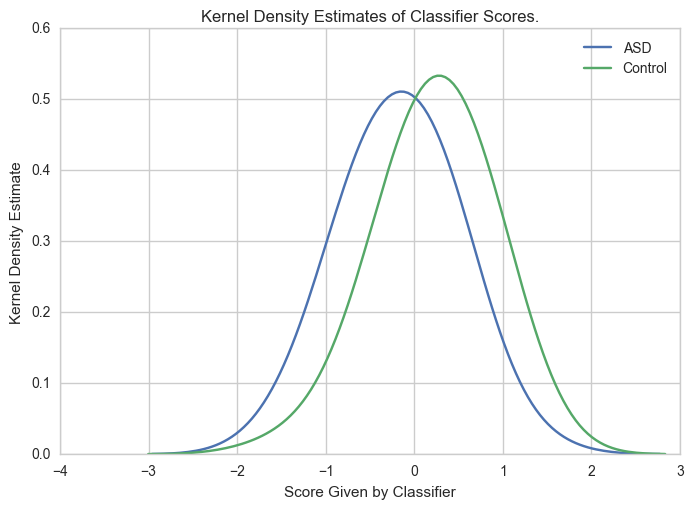

Accuracy:  0.38
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 31}}


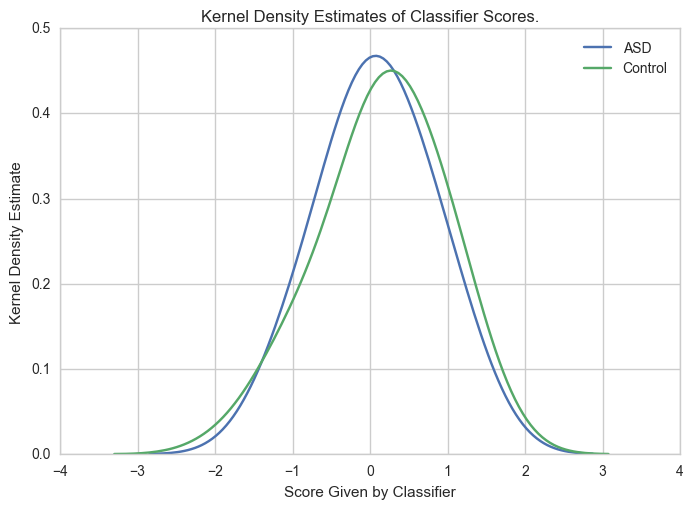

Accuracy:  0.43
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 32}}


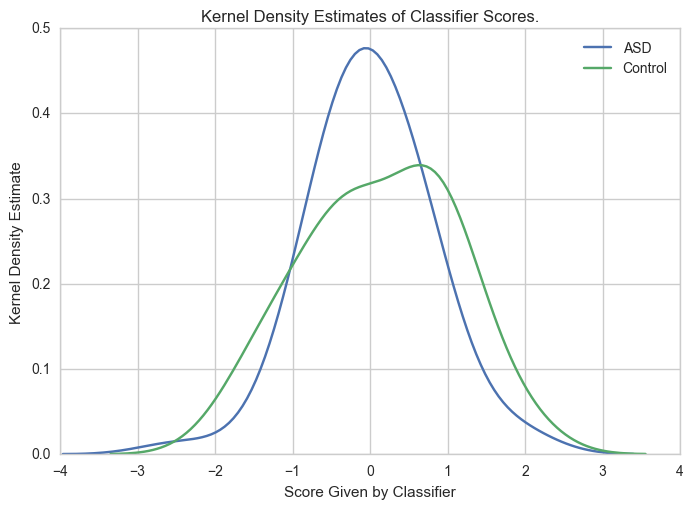

Accuracy:  0.5
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 33}}


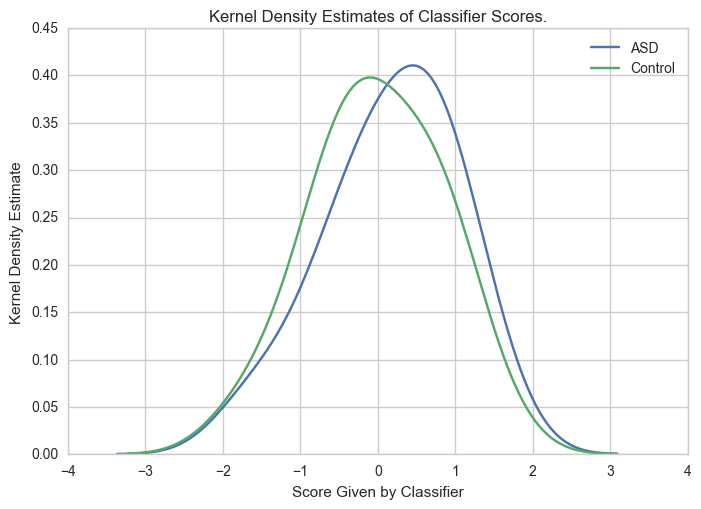

Accuracy:  0.59
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 34}}


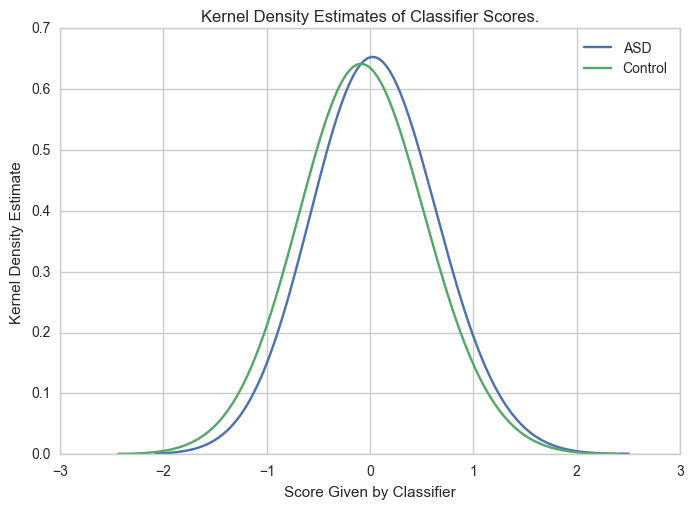

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 35}}


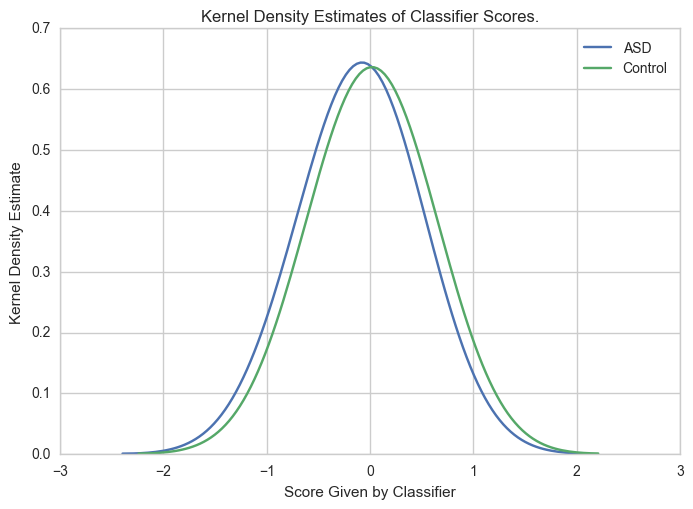

Accuracy:  0.43
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 36}}


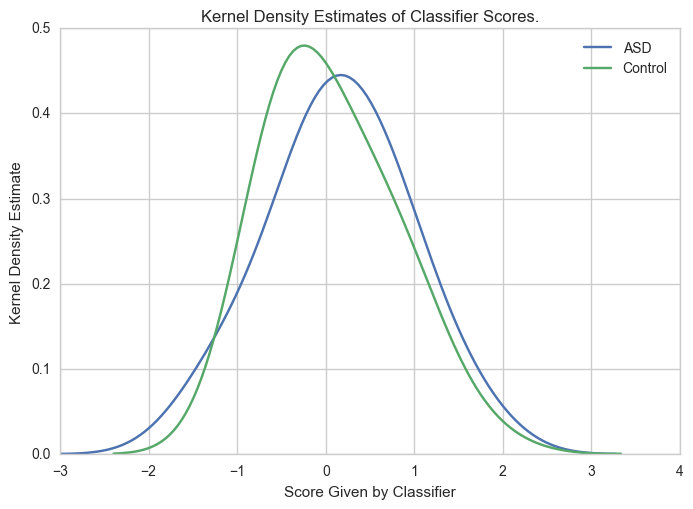

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 37}}


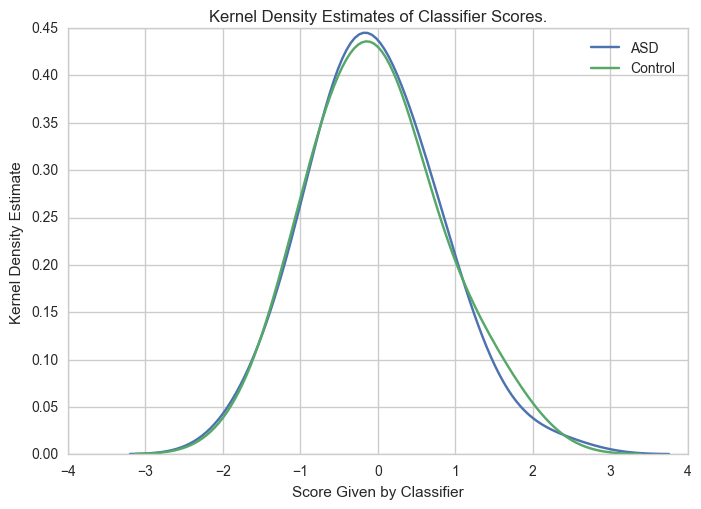

Accuracy:  0.5
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 38}}


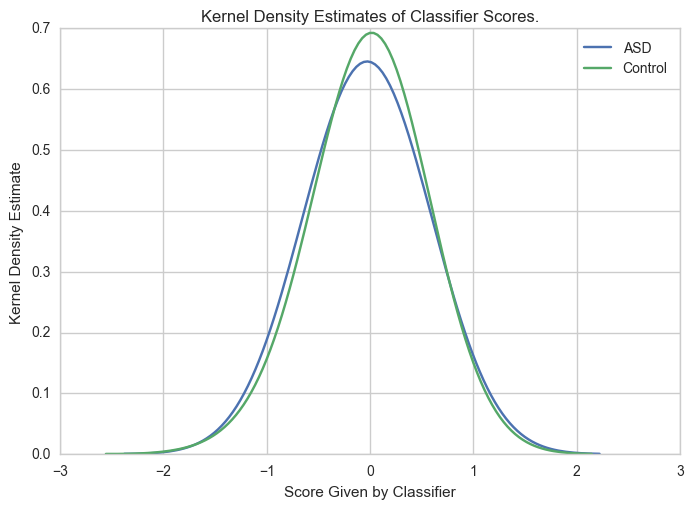

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 39}}


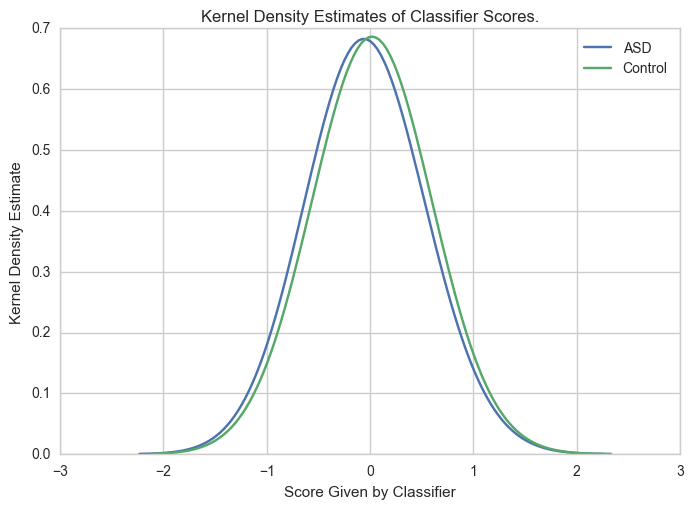

Accuracy:  0.43
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 40}}


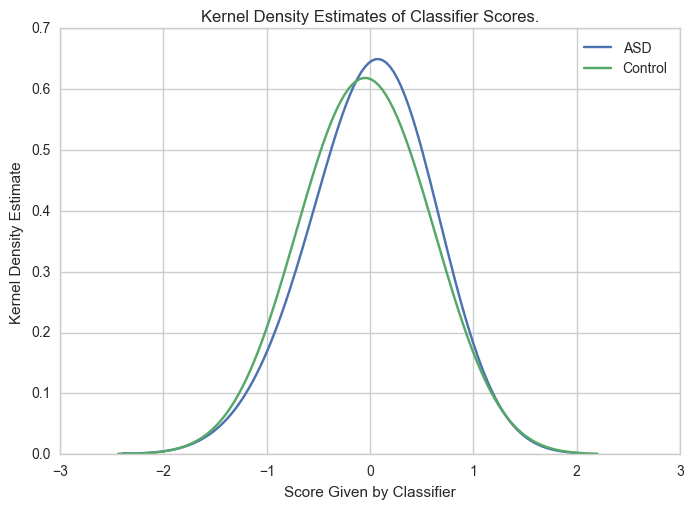

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 41}}


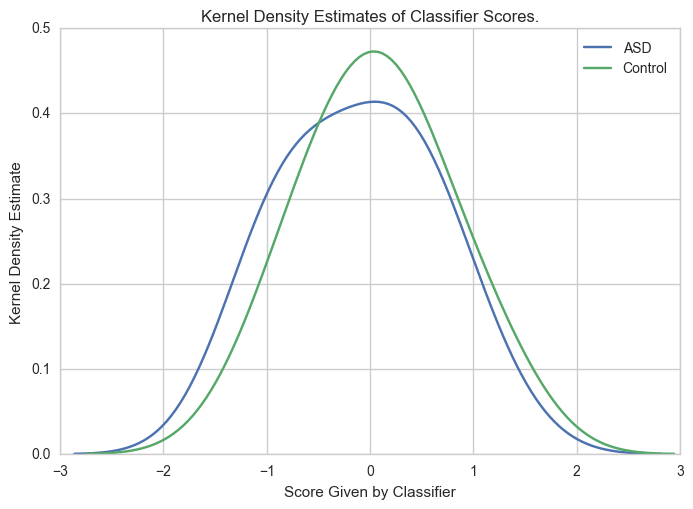

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 42}}


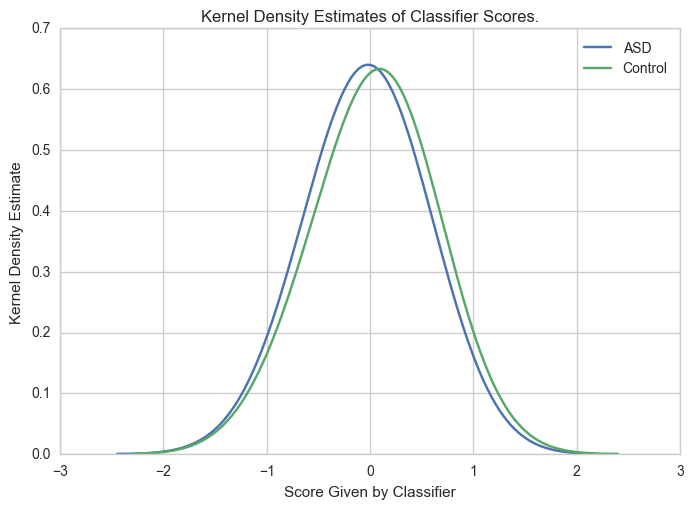

Accuracy:  0.38
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 43}}


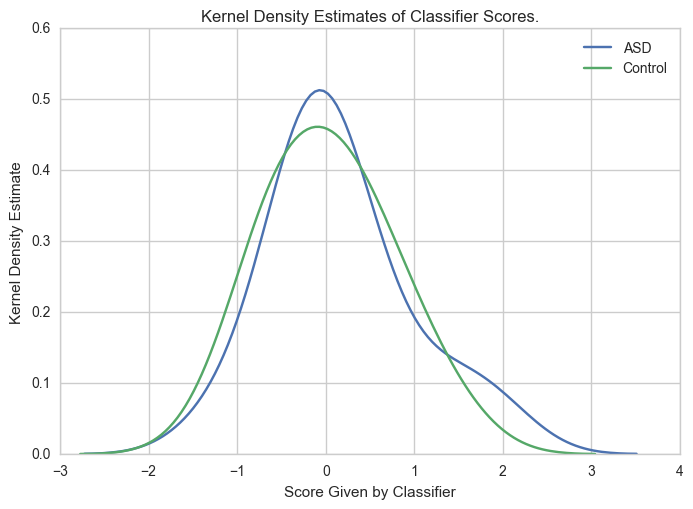

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 44}}


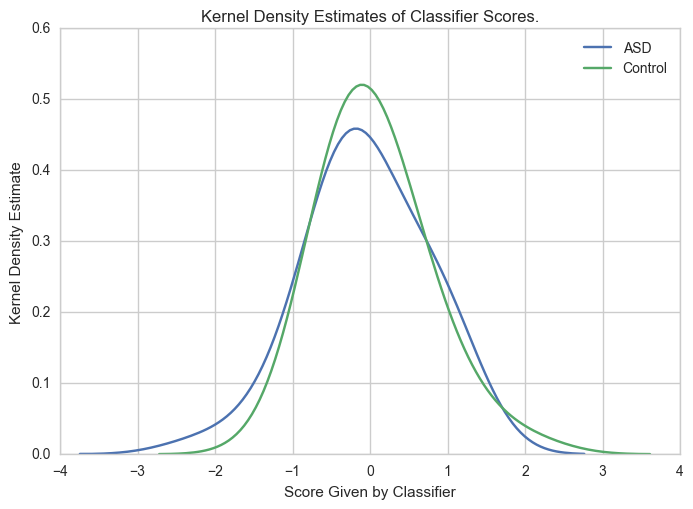

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 45}}


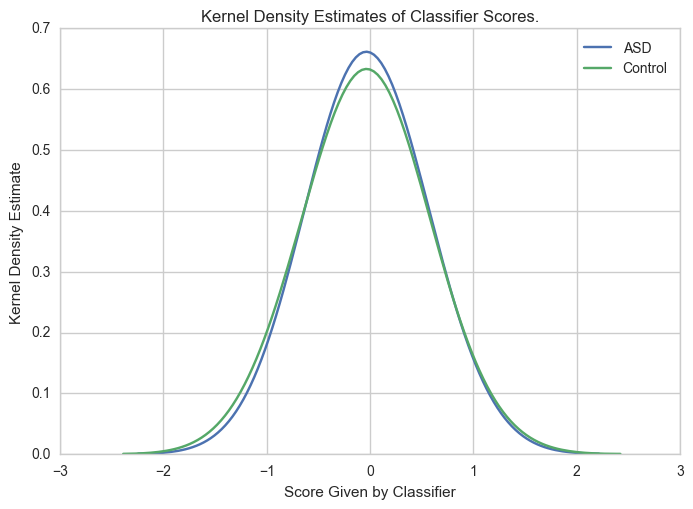

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 46}}


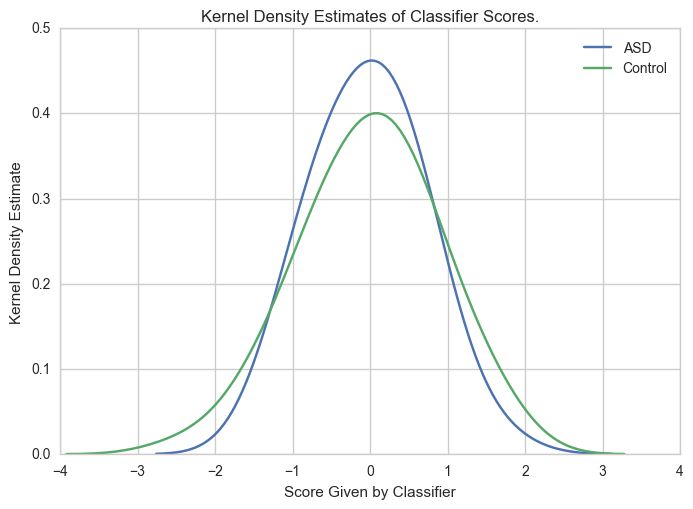

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 47}}


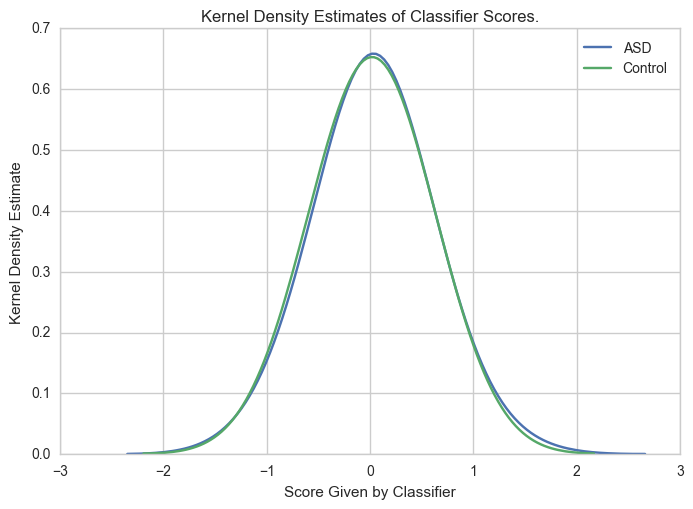

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 48}}


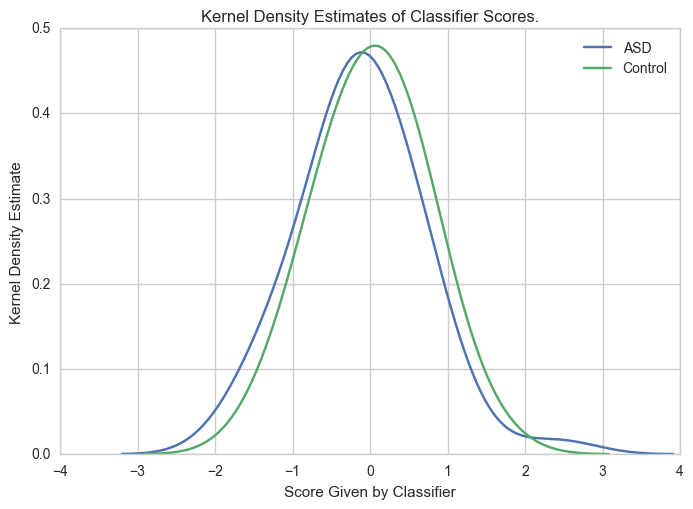

Accuracy:  0.45
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 49}}


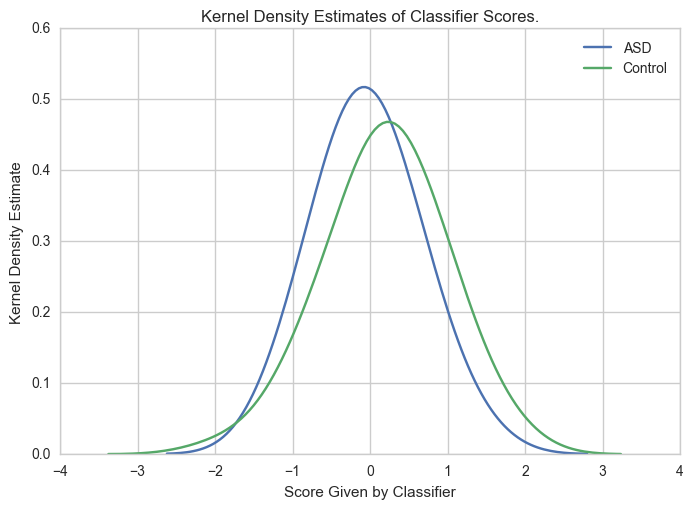

Accuracy:  0.4
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 50}}


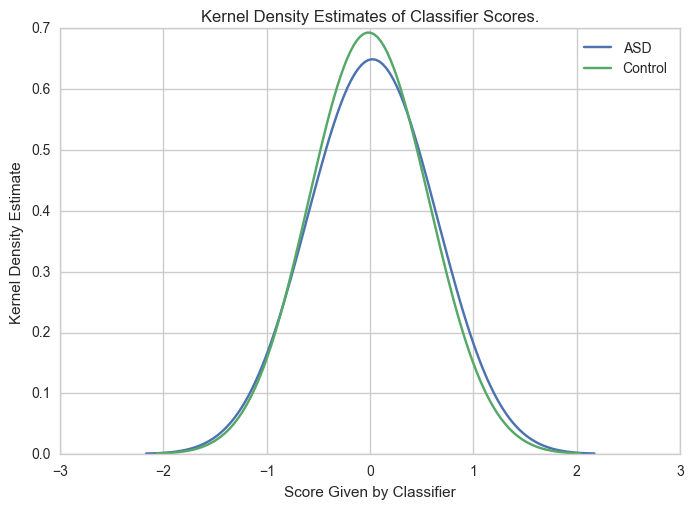

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 51}}


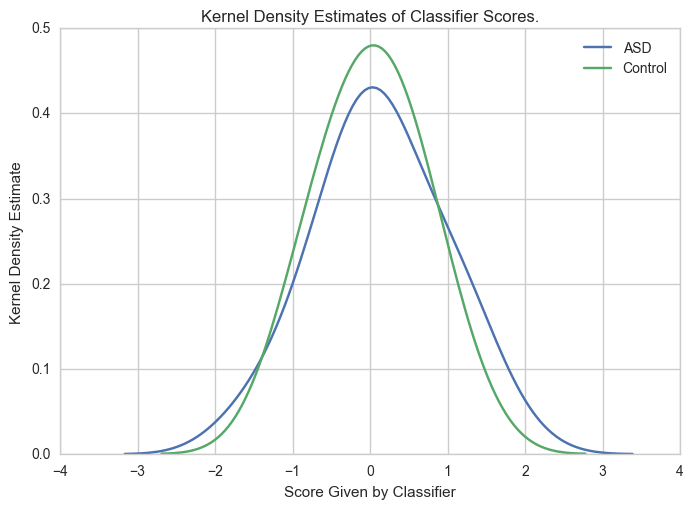

Accuracy:  0.52
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 52}}


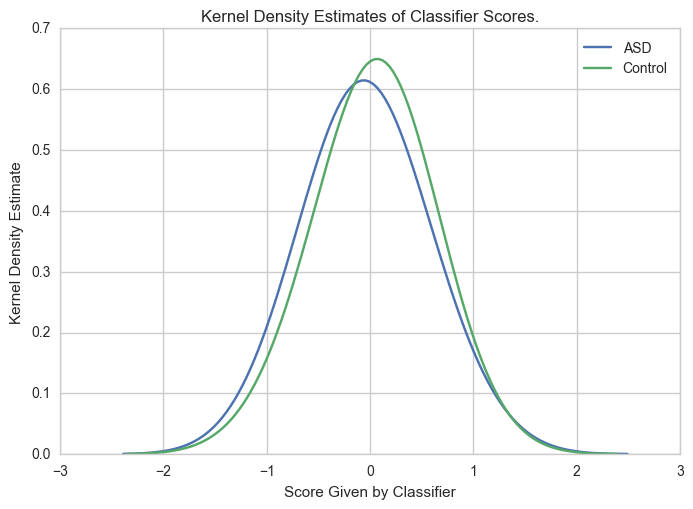

Accuracy:  0.37
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 53}}


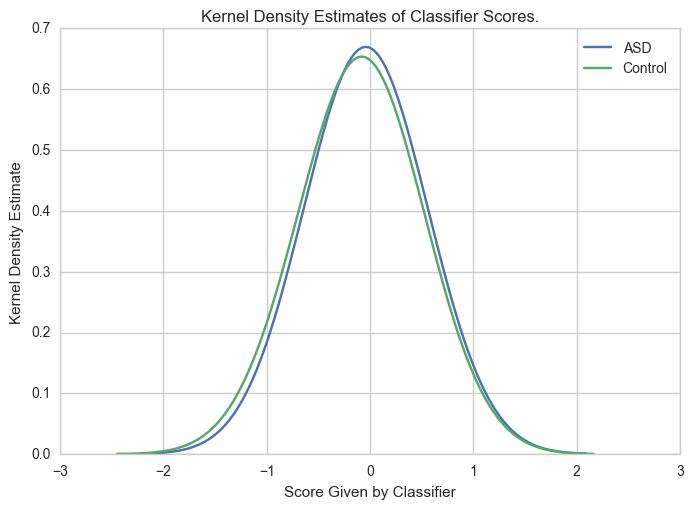

Accuracy:  0.56
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 54}}


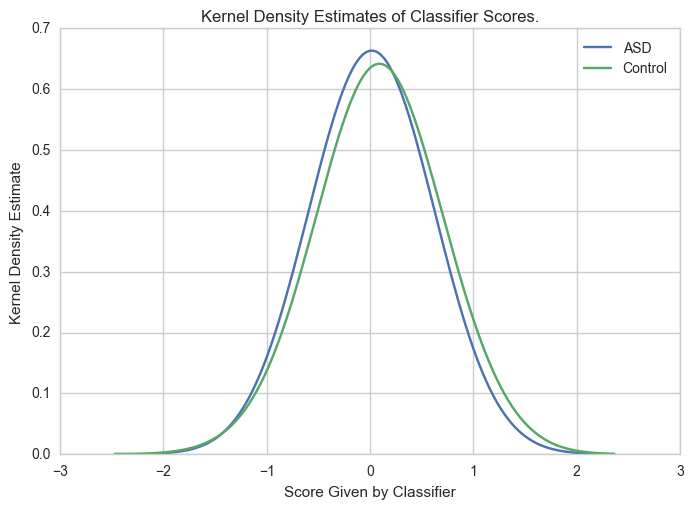

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 55}}


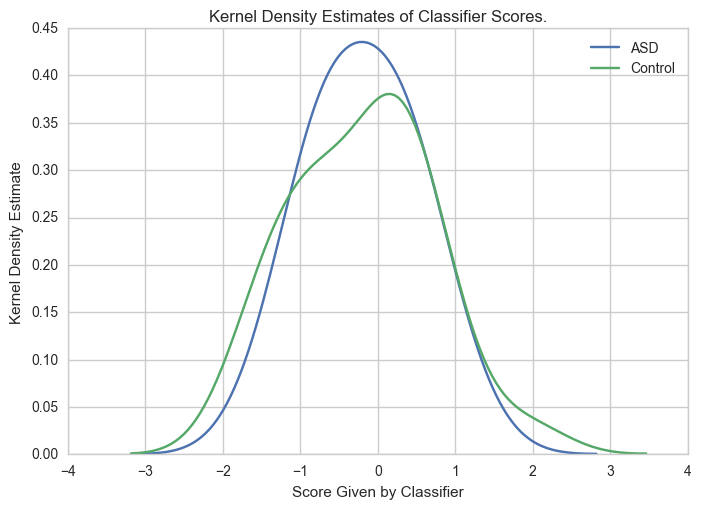

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 56}}


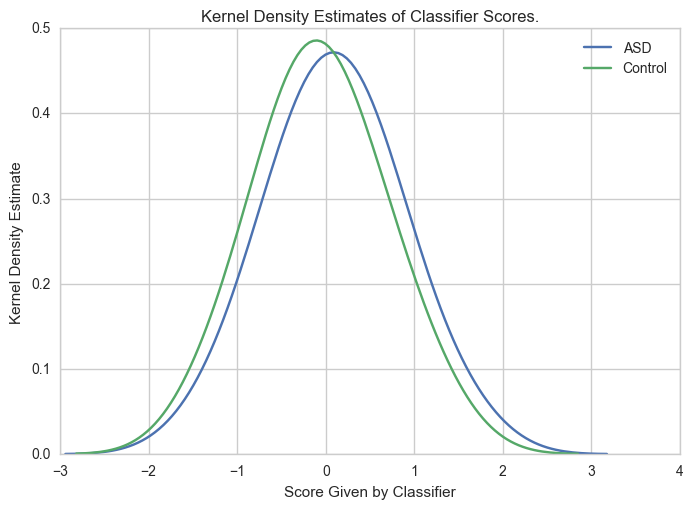

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 57}}


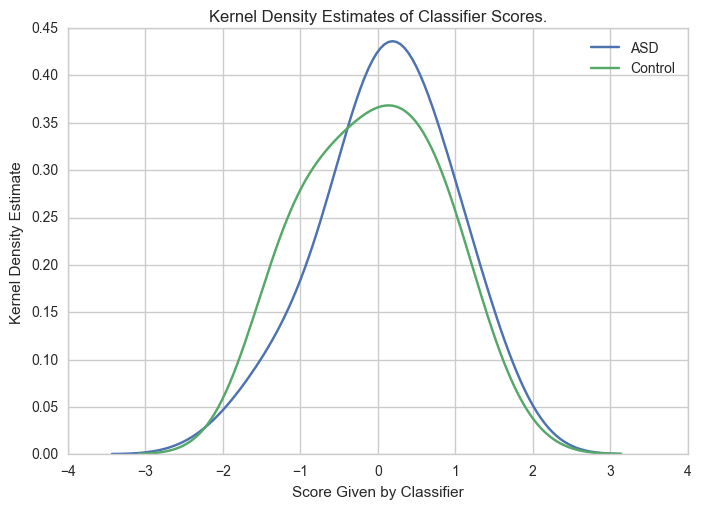

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 58}}


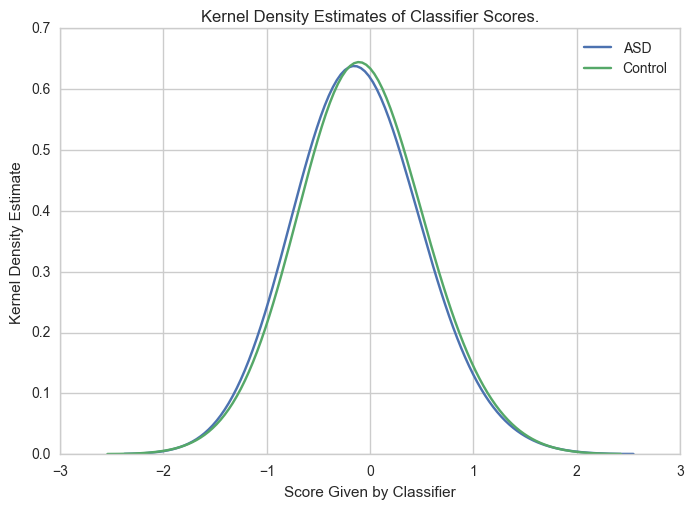

Accuracy:  0.51
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 59}}


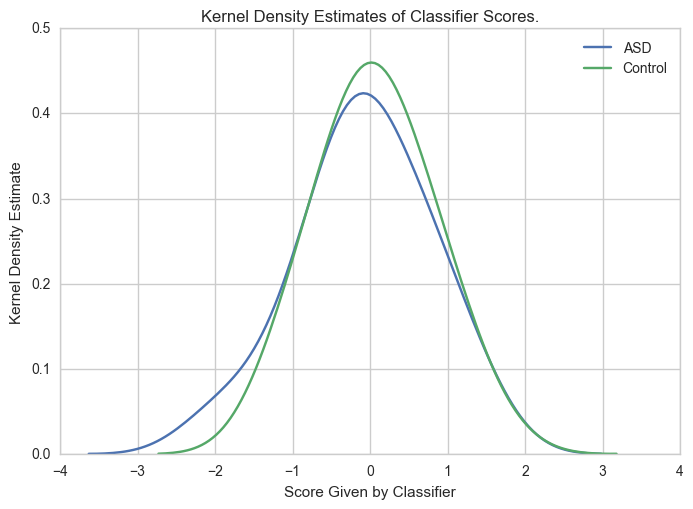

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 60}}


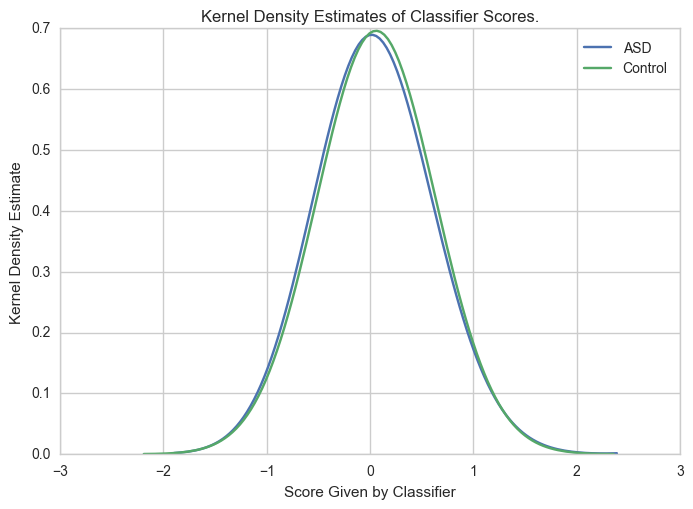

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 61}}


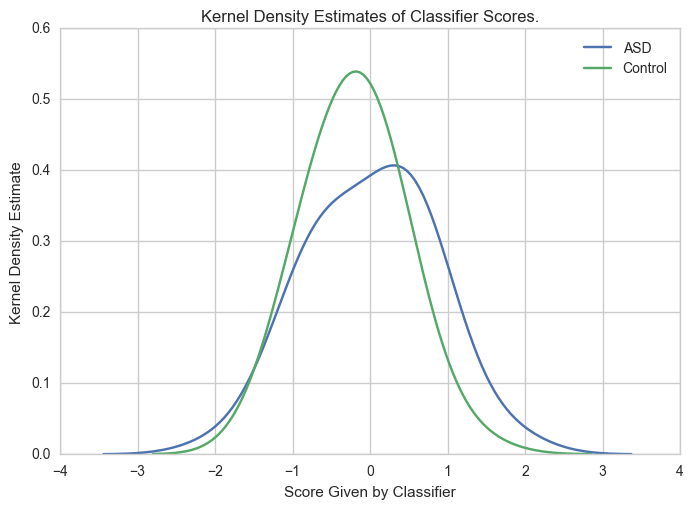

Accuracy:  0.57
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 62}}


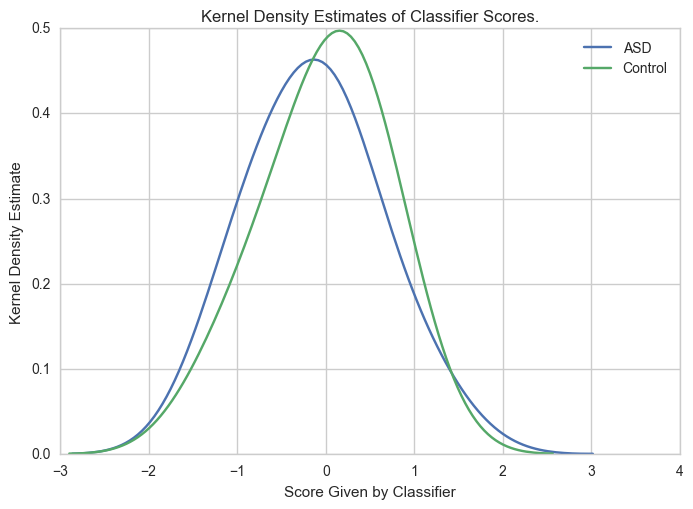

Accuracy:  0.45
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 63}}


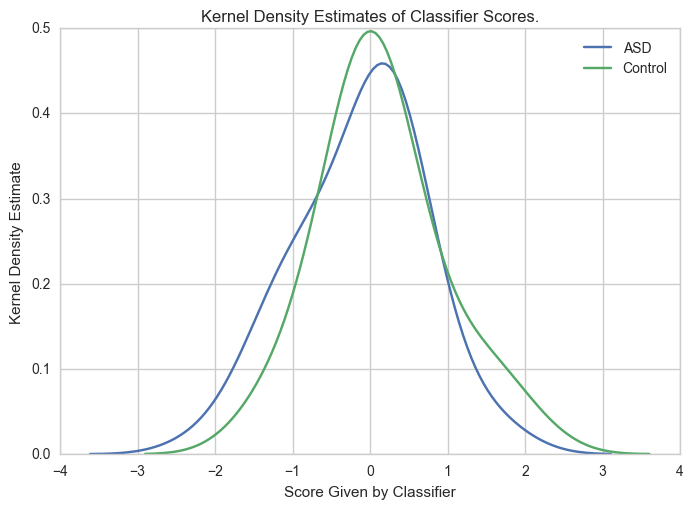

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 64}}


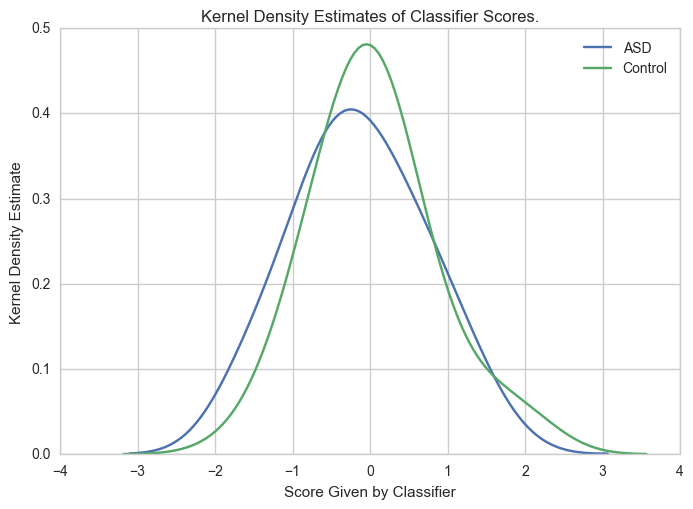

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 65}}


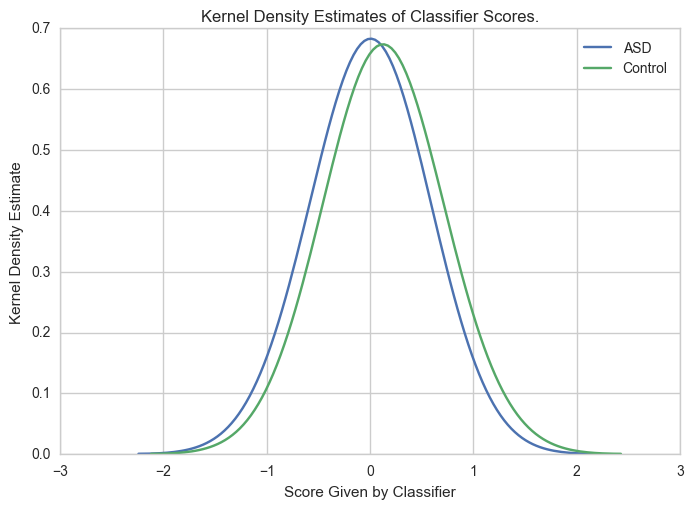

Accuracy:  0.4
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 66}}


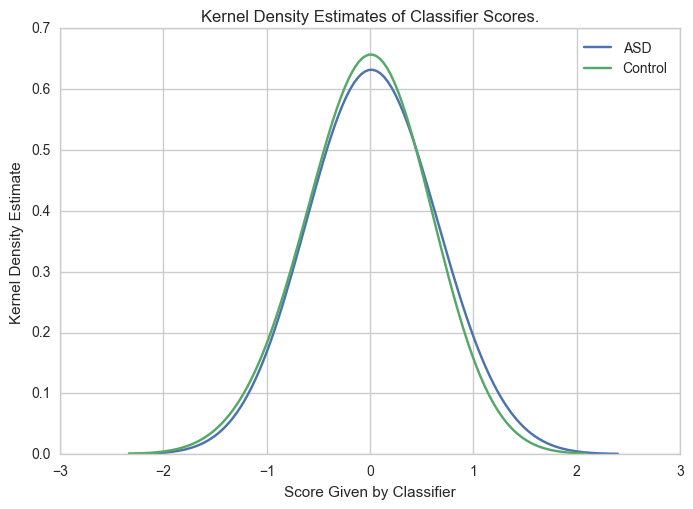

Accuracy:  0.51
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 67}}


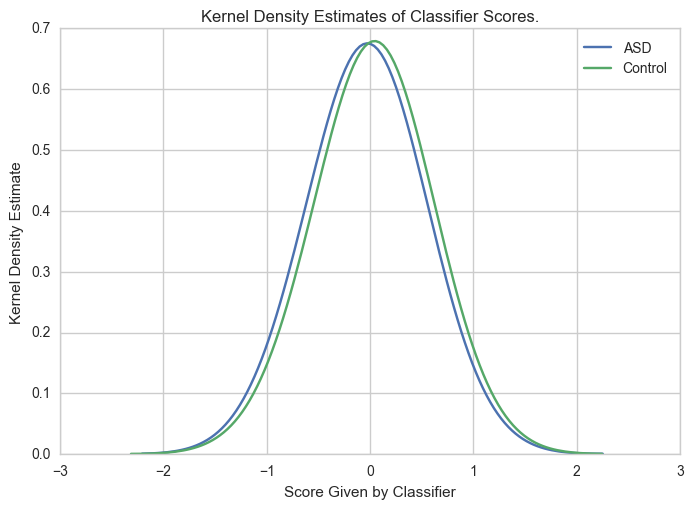

Accuracy:  0.43
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 68}}


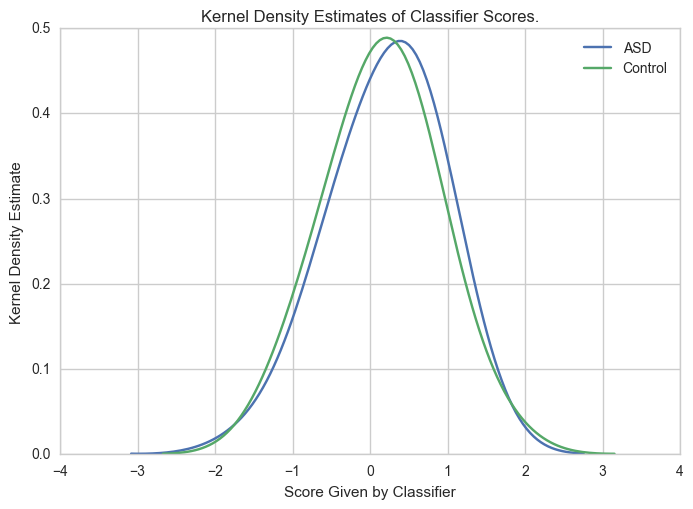

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 69}}


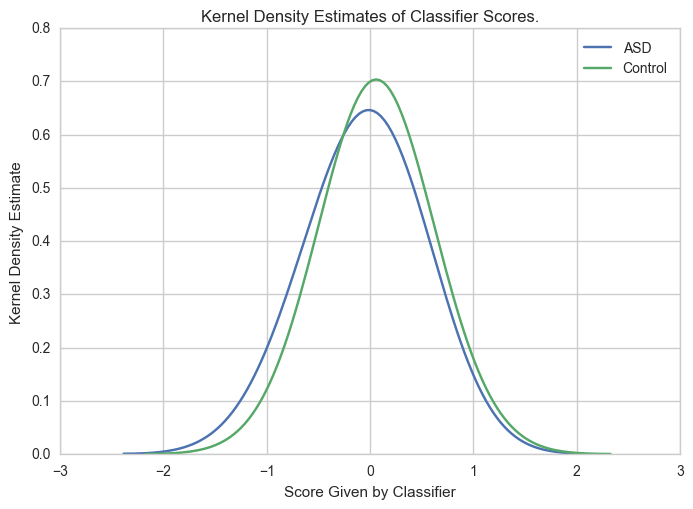

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 70}}


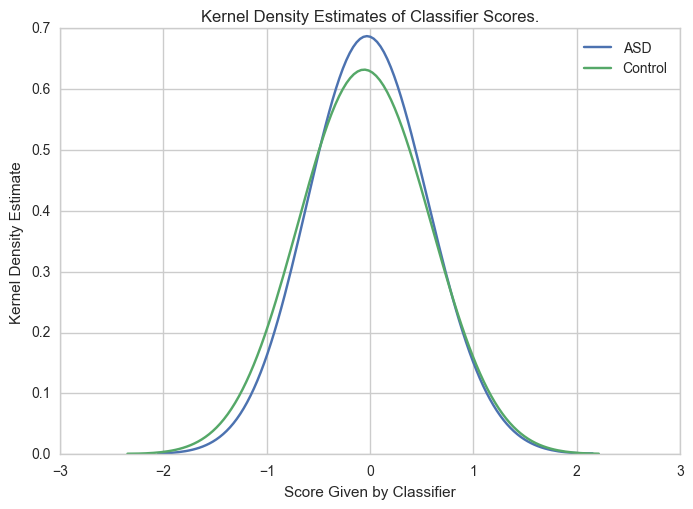

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 71}}


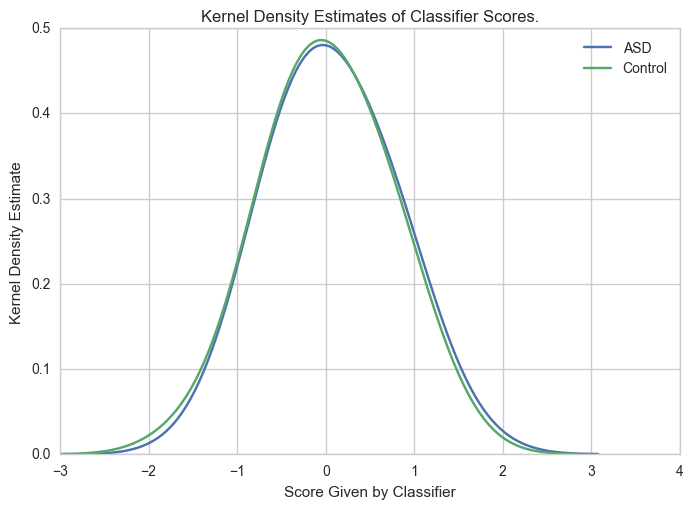

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 72}}


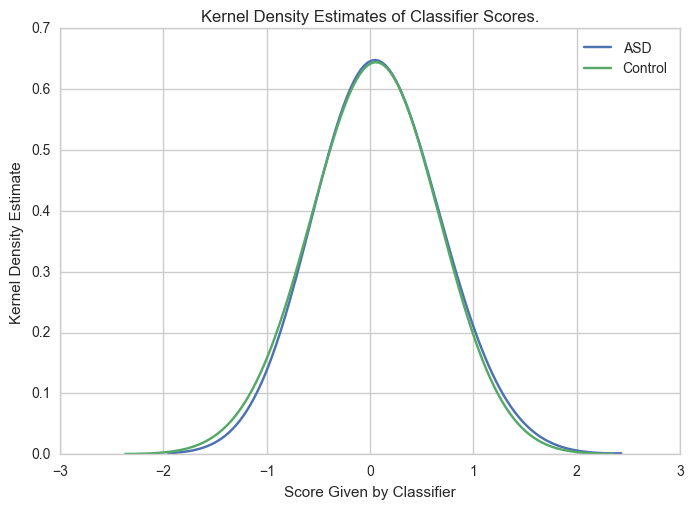

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 73}}


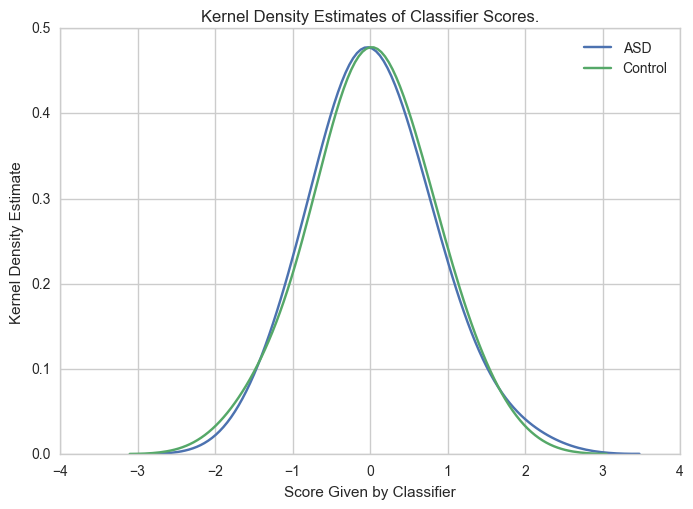

Accuracy:  0.5
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 74}}


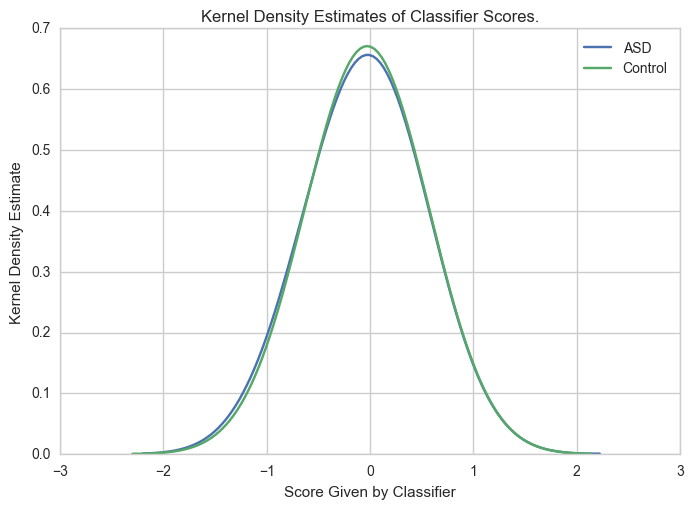

Accuracy:  0.51
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 75}}


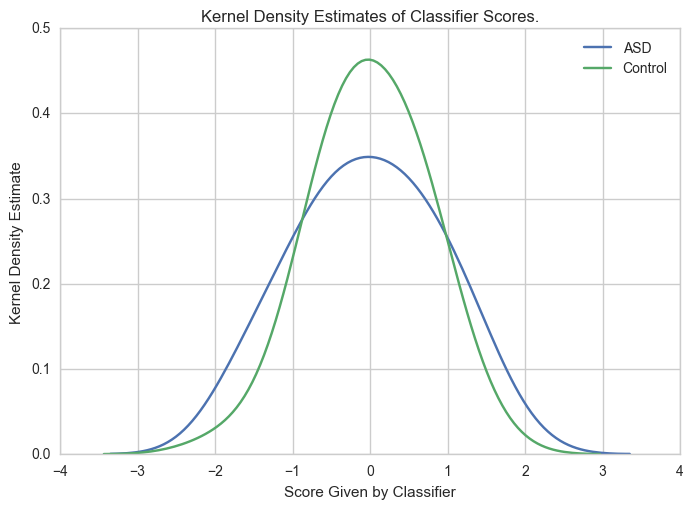

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 76}}


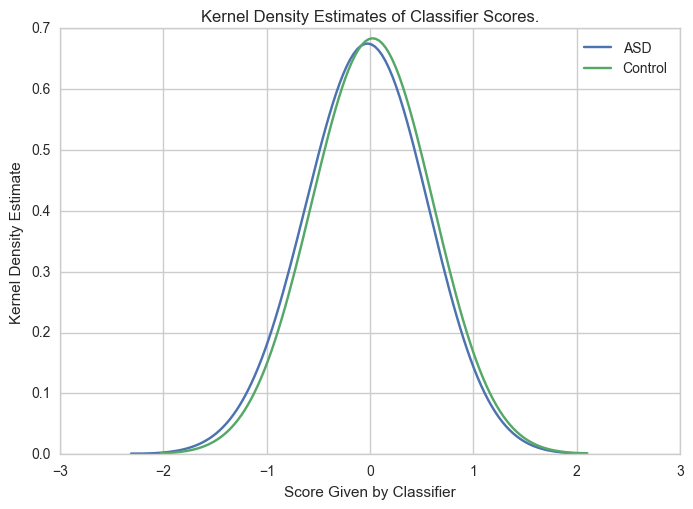

Accuracy:  0.46
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 77}}


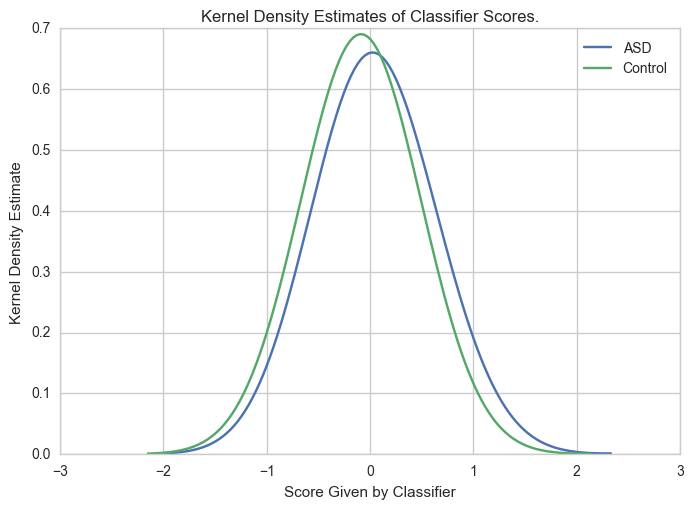

Accuracy:  0.57
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 78}}


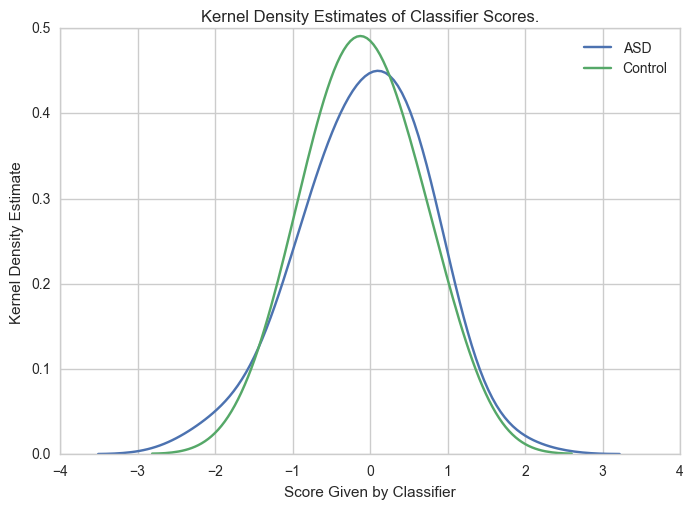

Accuracy:  0.51
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 79}}


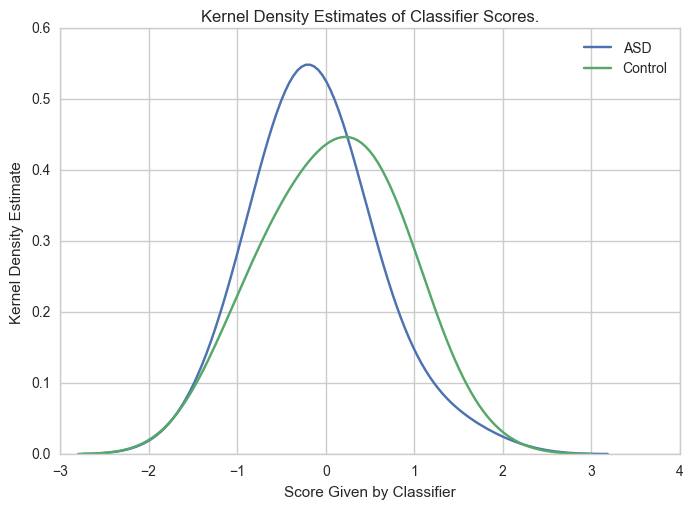

Accuracy:  0.4
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 80}}


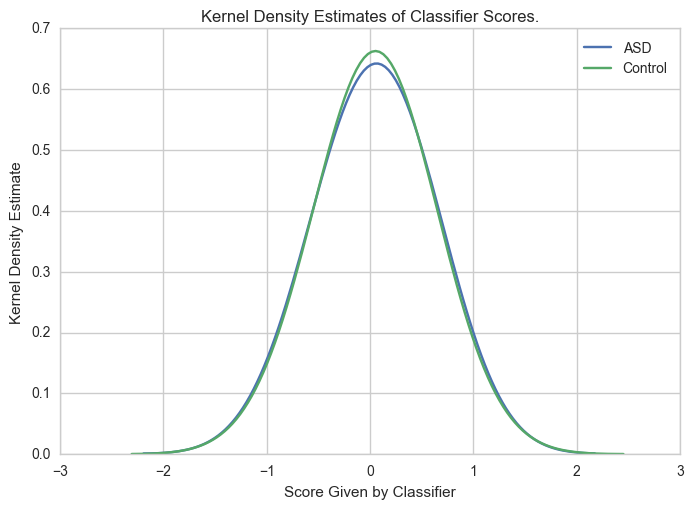

Accuracy:  0.52
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 81}}


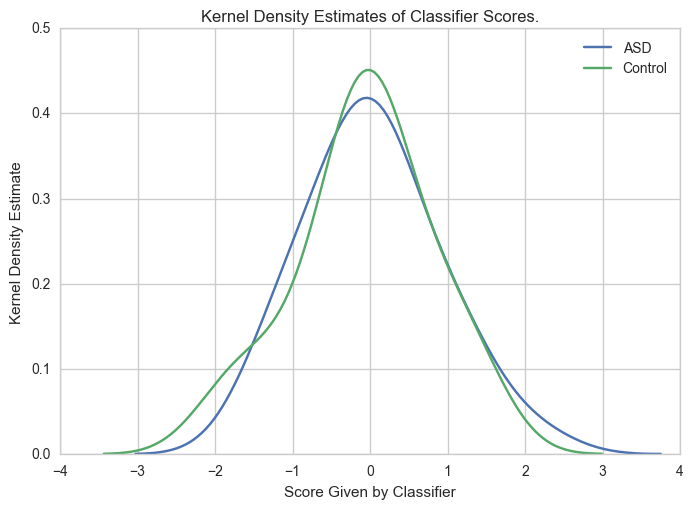

Accuracy:  0.51
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 82}}


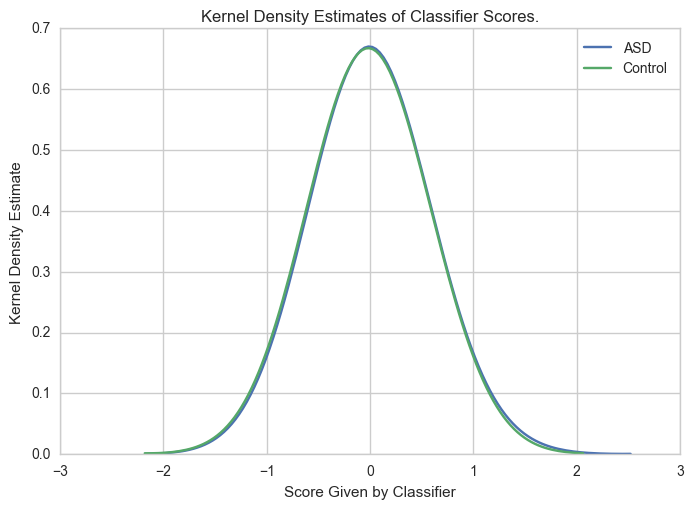

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 83}}


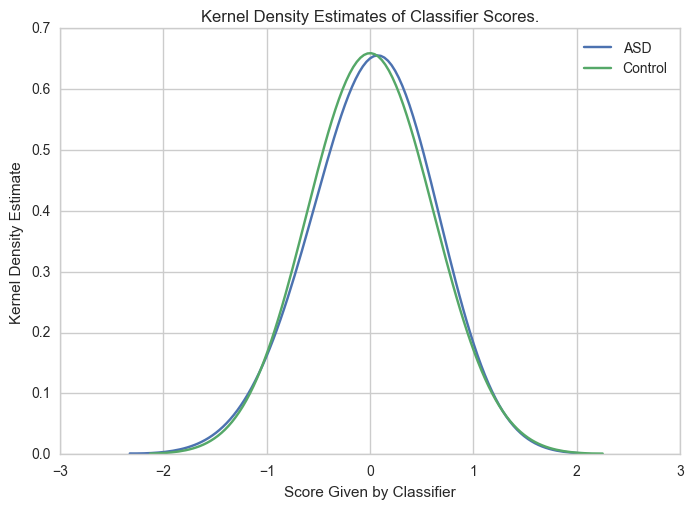

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 84}}


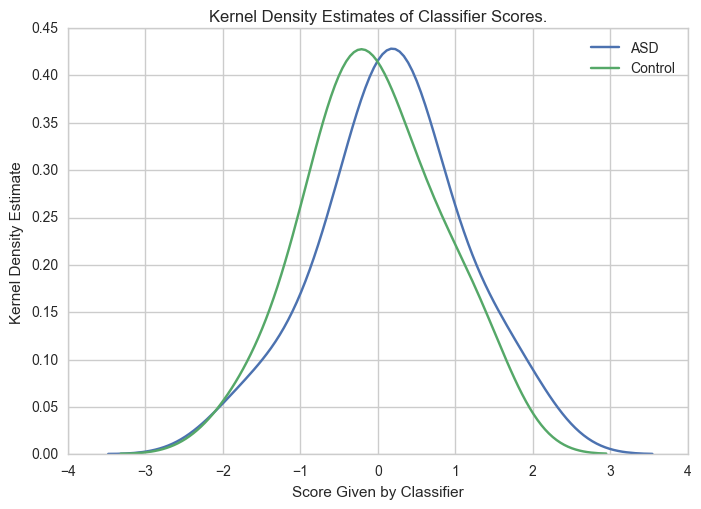

Accuracy:  0.58
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 85}}


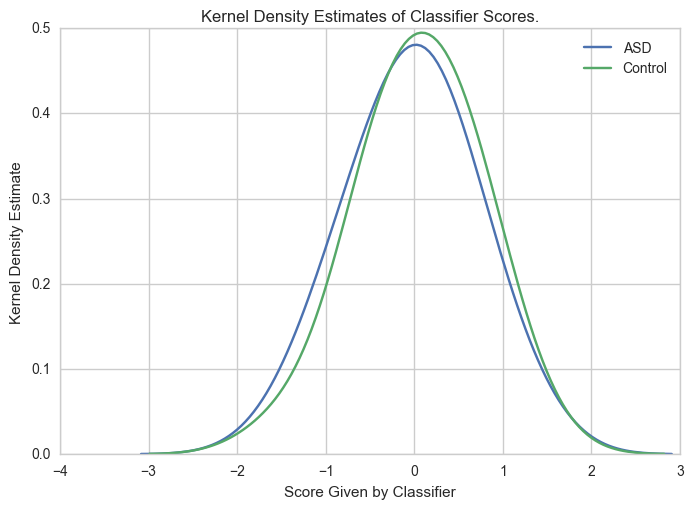

Accuracy:  0.46
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 86}}


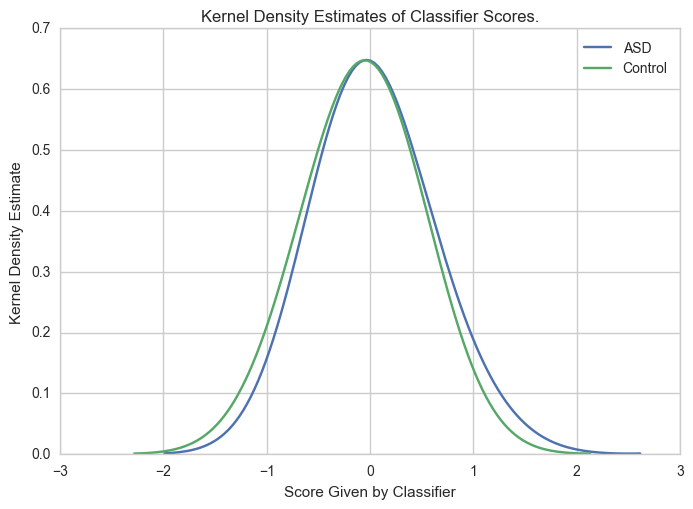

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 87}}


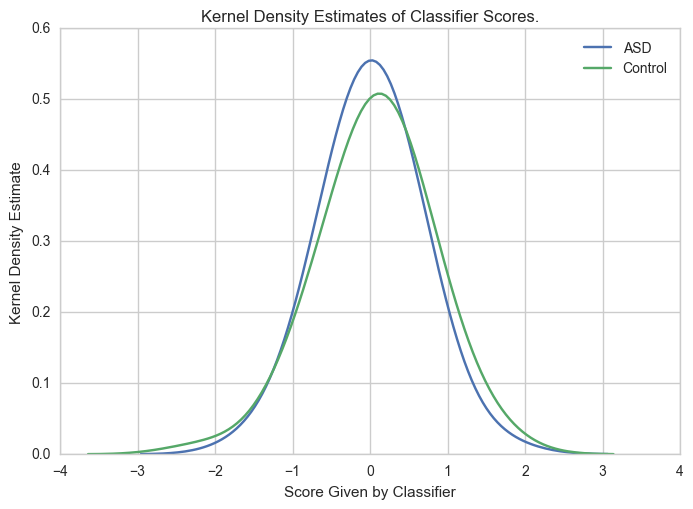

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 88}}


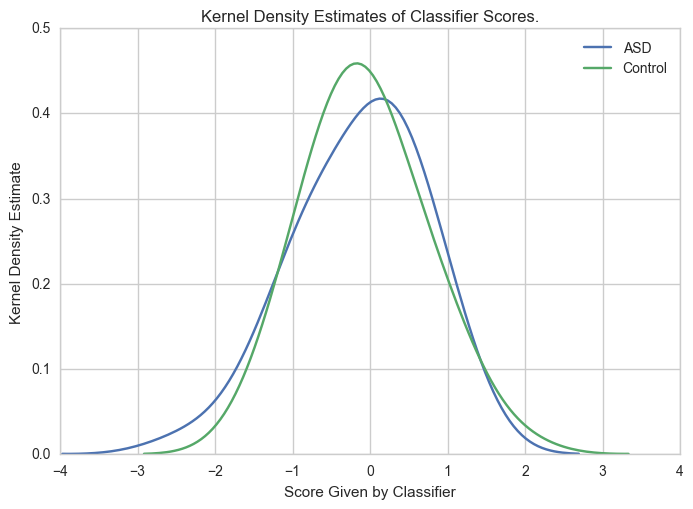

Accuracy:  0.56
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 89}}


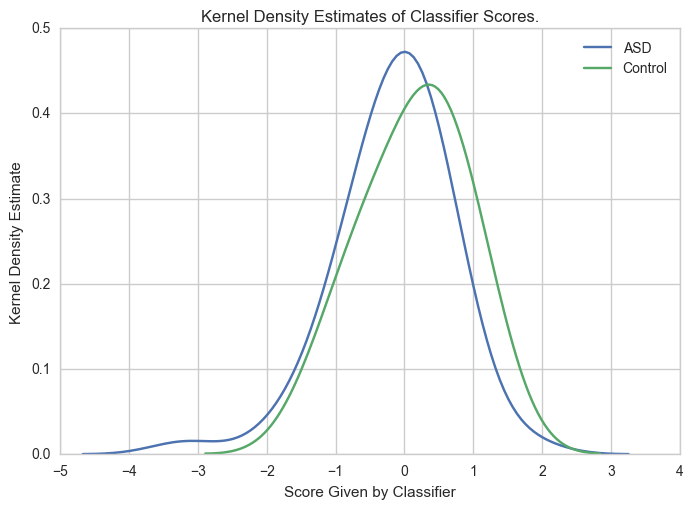

Accuracy:  0.44
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 90}}


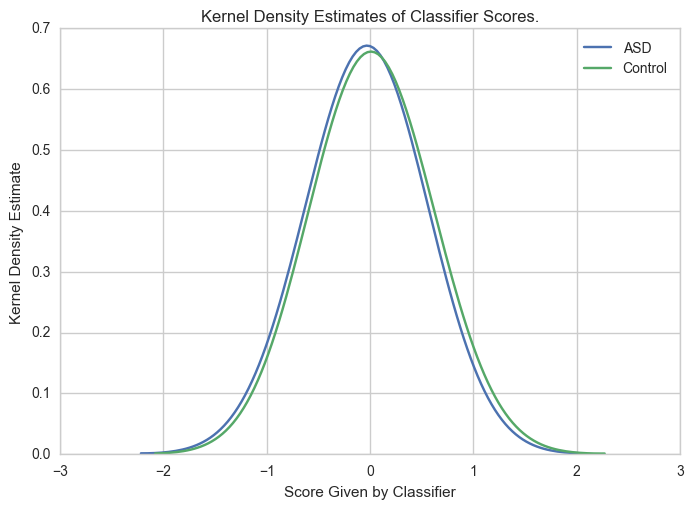

Accuracy:  0.51
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 91}}


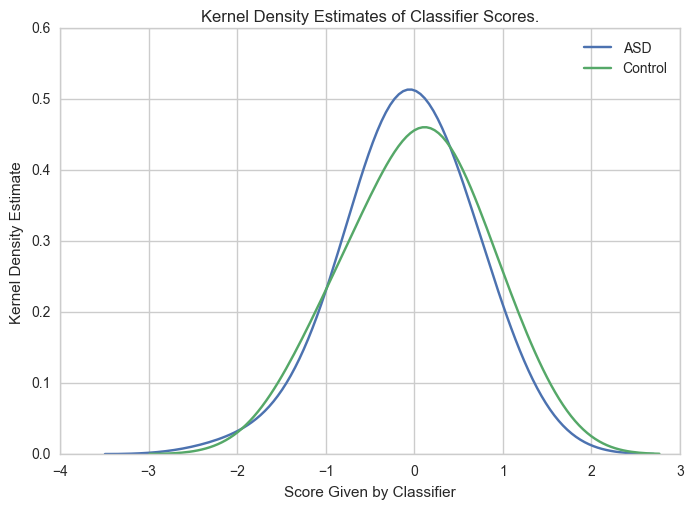

Accuracy:  0.46
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 92}}


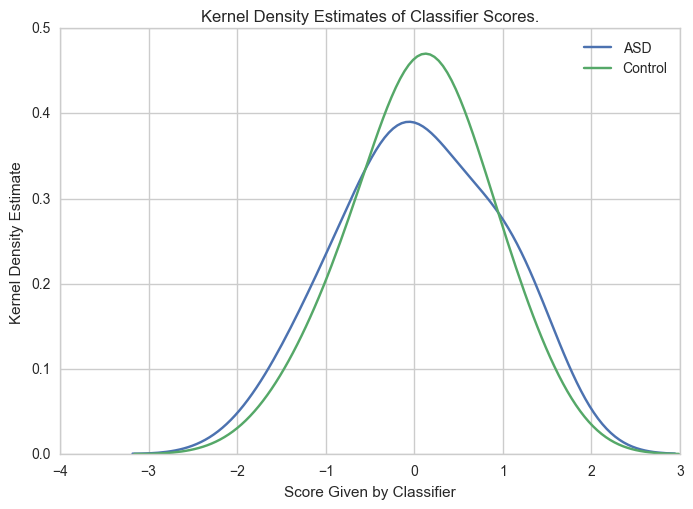

Accuracy:  0.44
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 93}}


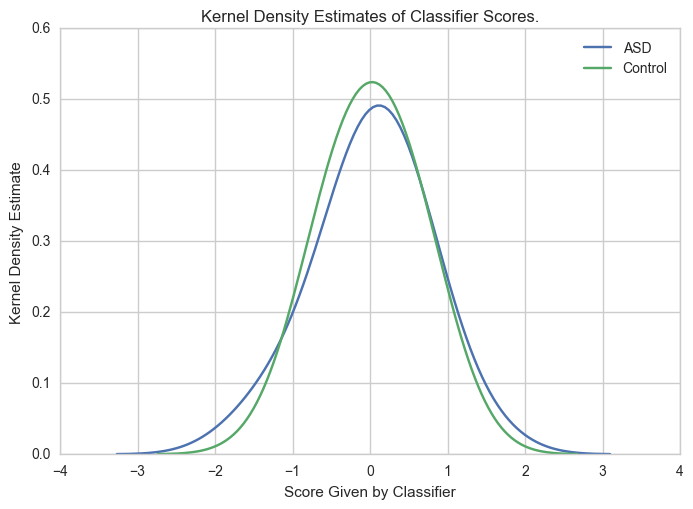

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 94}}


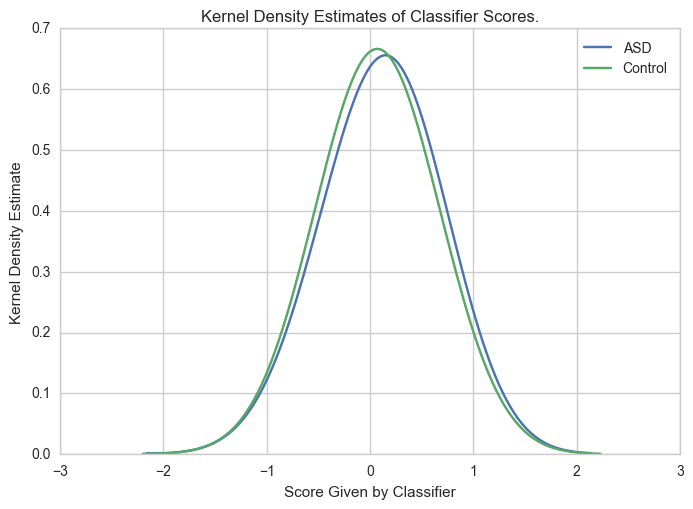

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 95}}


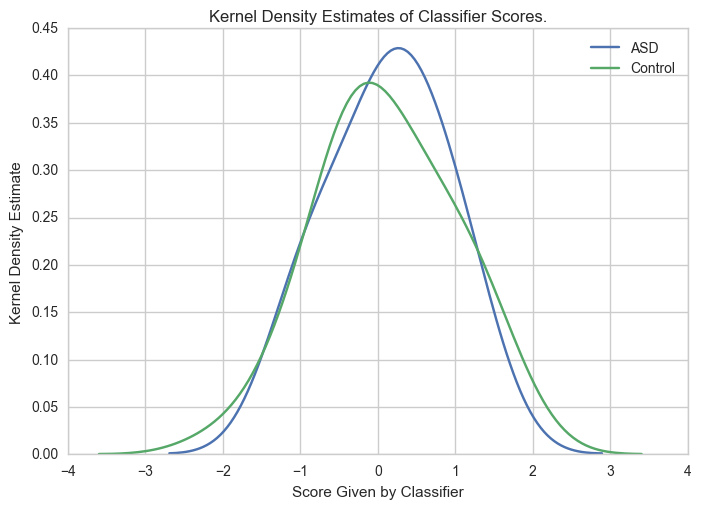

Accuracy:  0.57
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 96}}


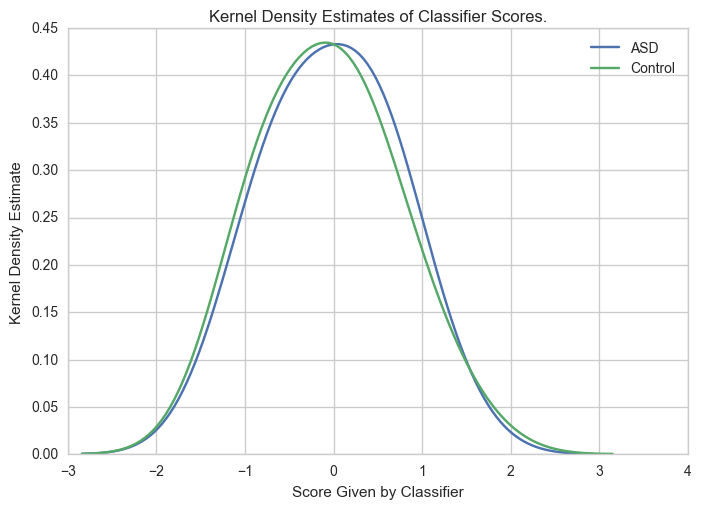

Accuracy:  0.51
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 97}}


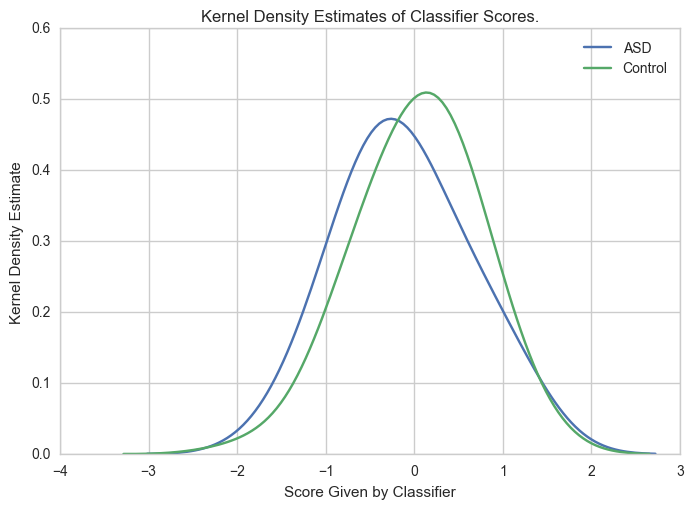

Accuracy:  0.41
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 98}}


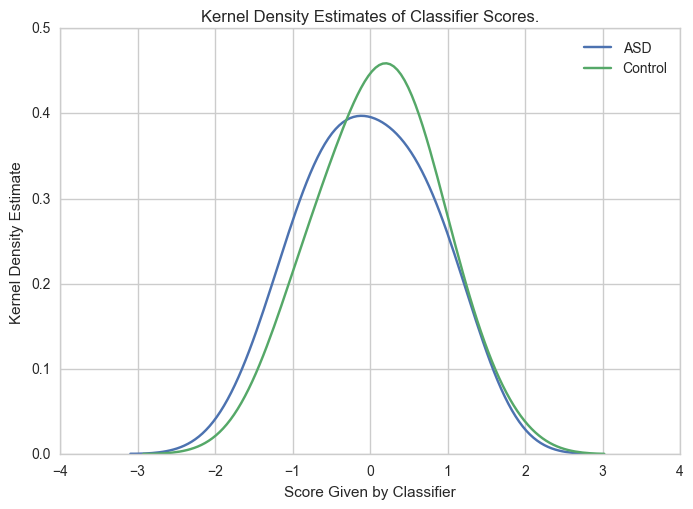

Accuracy:  0.43
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 99}}


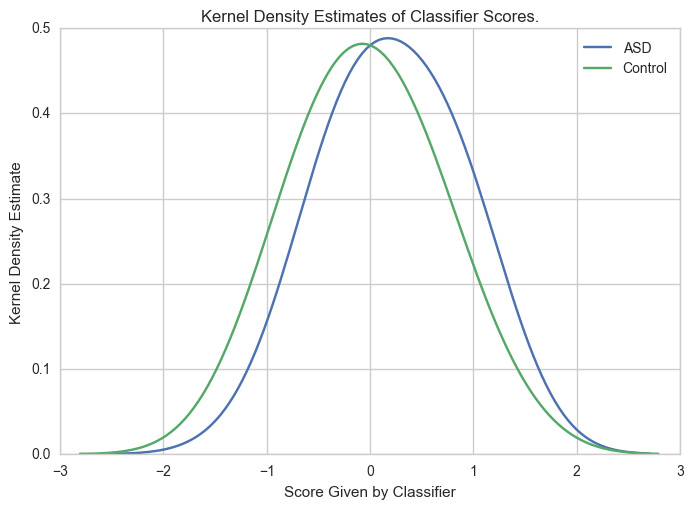

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 100}}


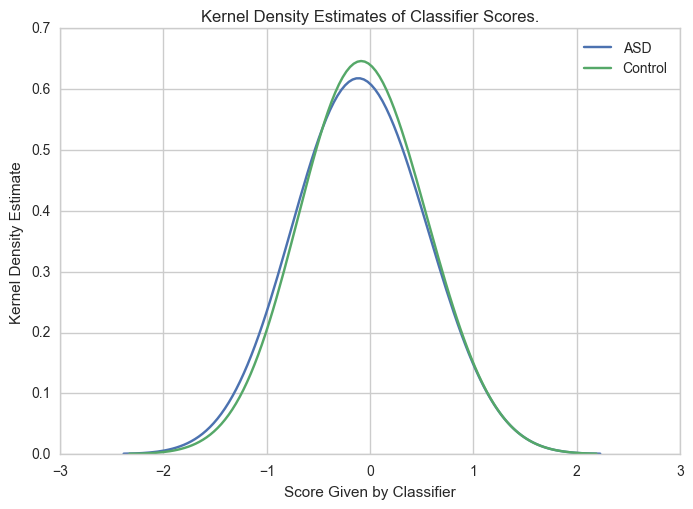

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 101}}


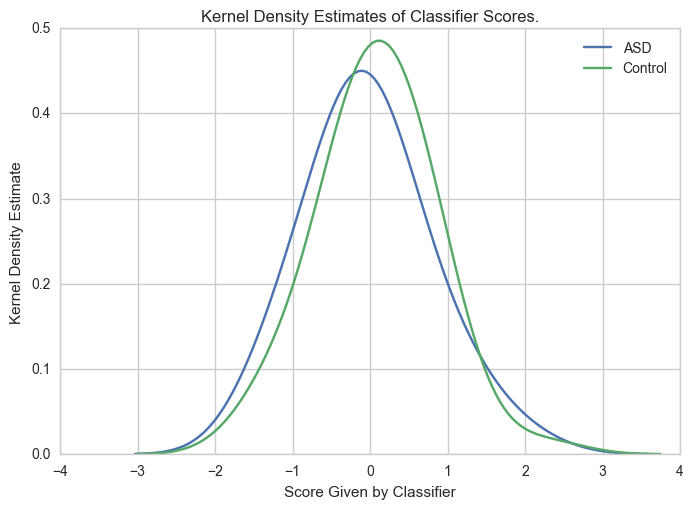

Accuracy:  0.46
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 102}}


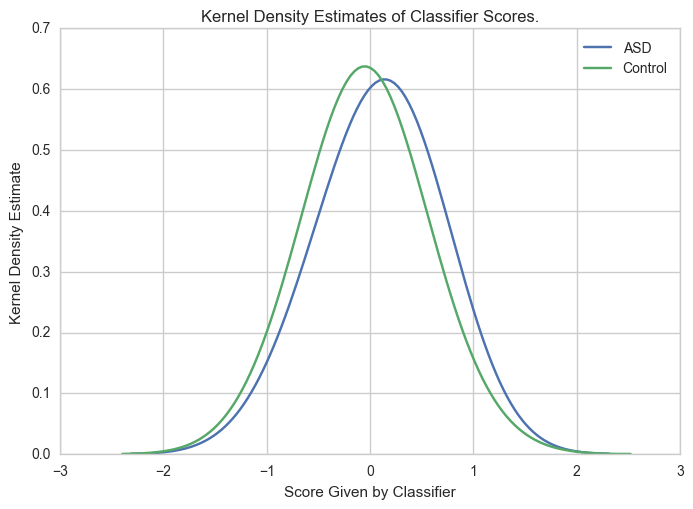

Accuracy:  0.59
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 103}}


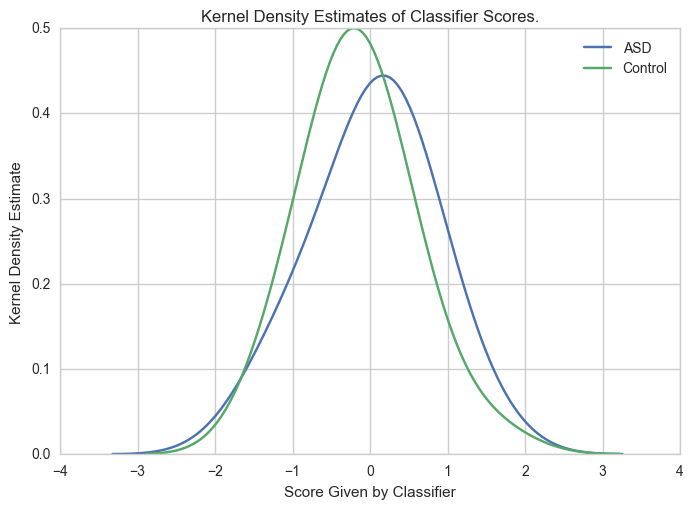

Accuracy:  0.59
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 104}}


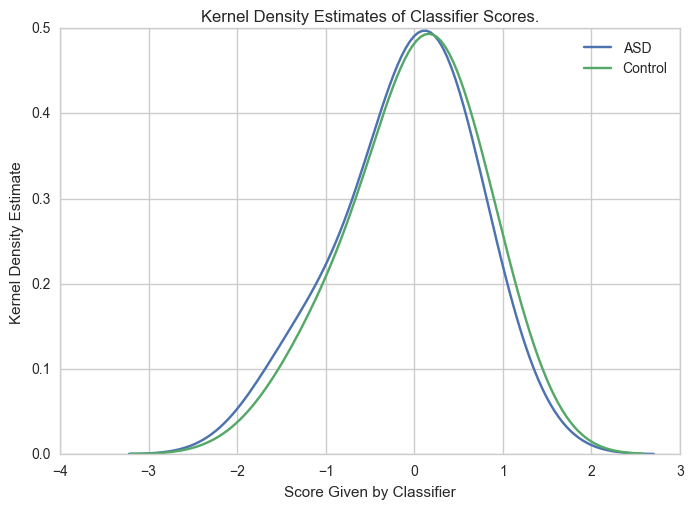

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 105}}


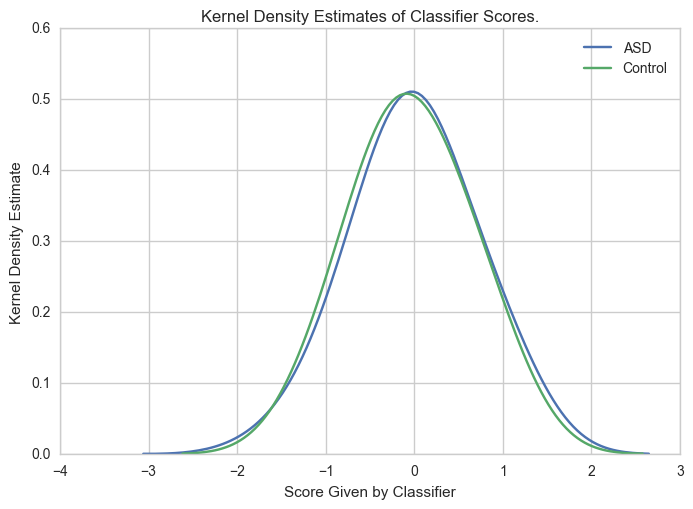

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 106}}


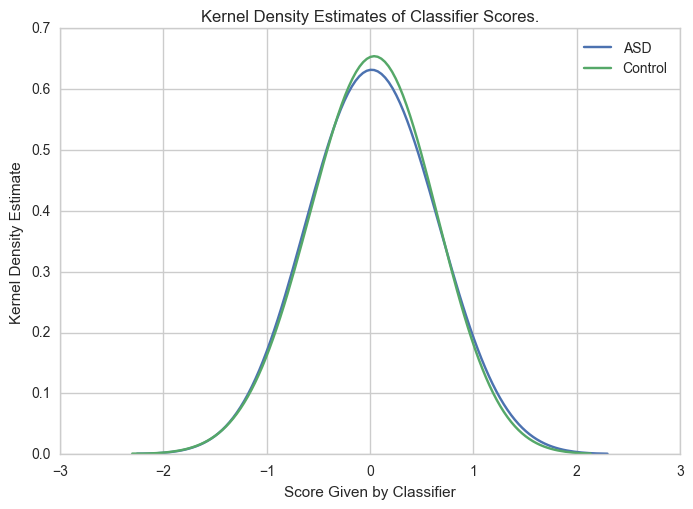

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 107}}


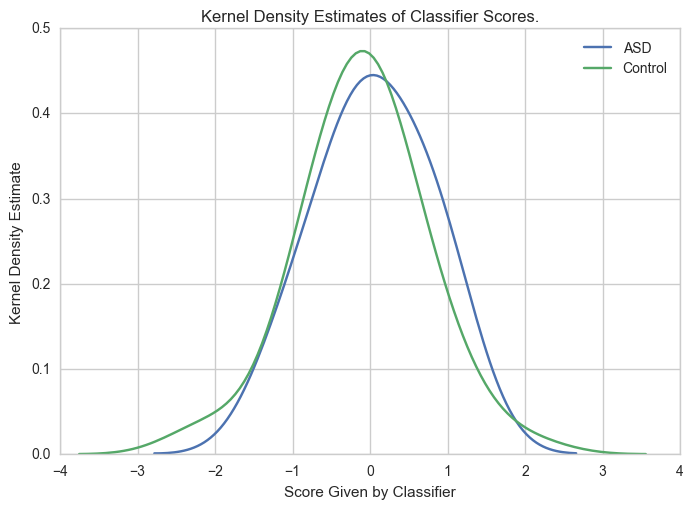

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 108}}


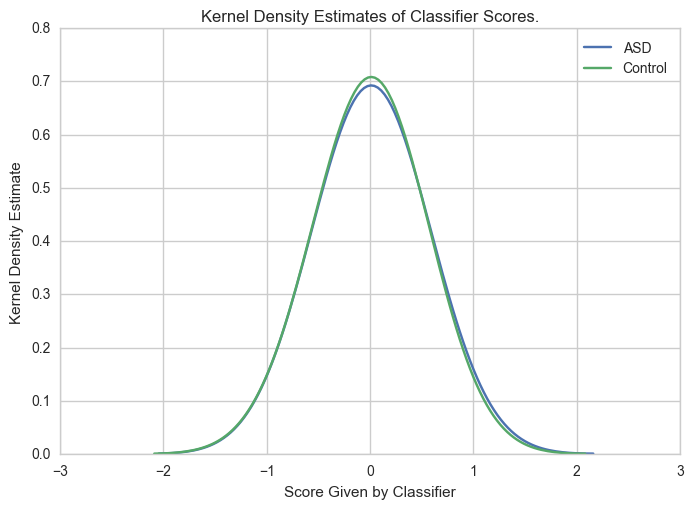

Accuracy:  0.46
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 109}}


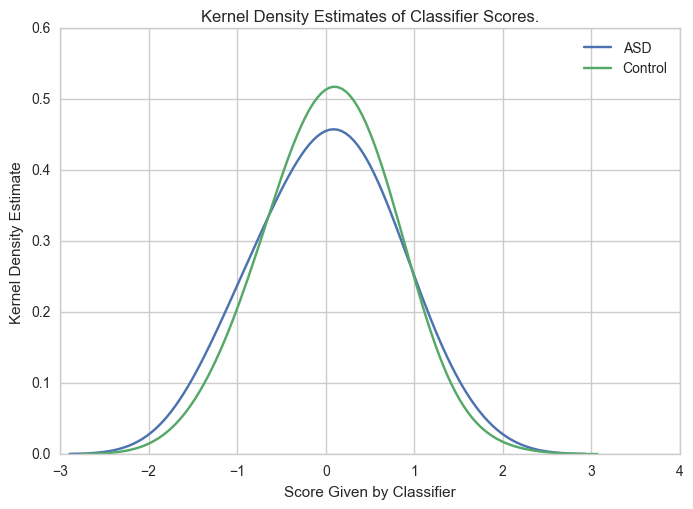

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 110}}


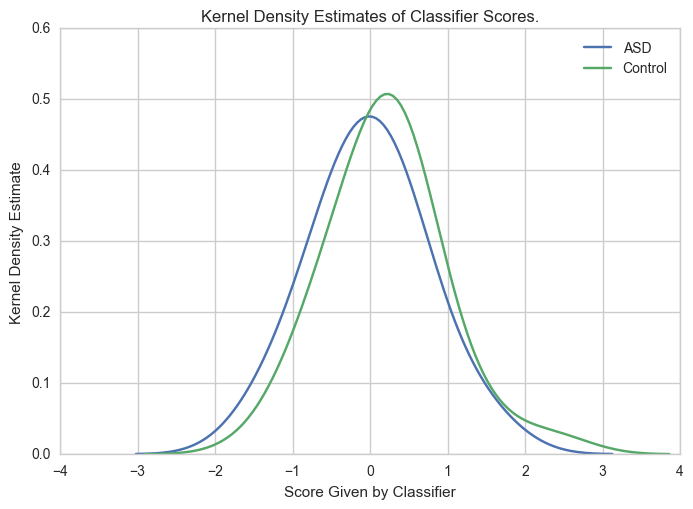

Accuracy:  0.39
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 111}}


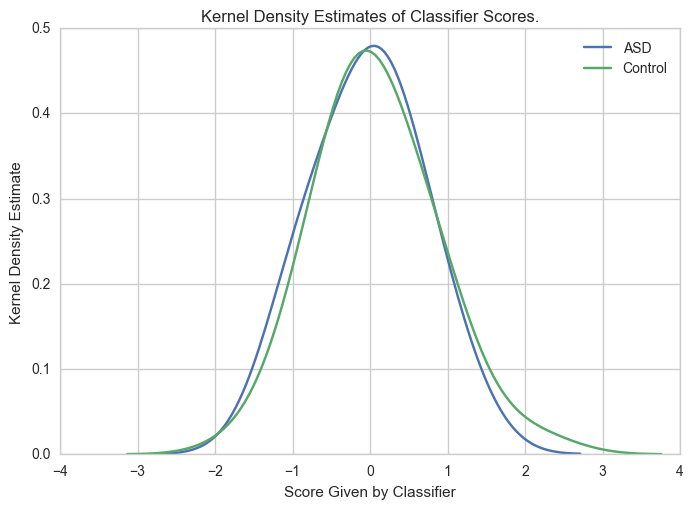

Accuracy:  0.51
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 112}}


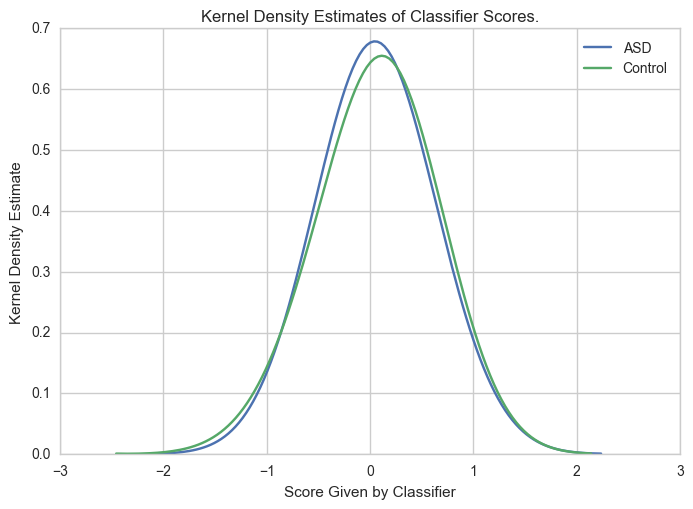

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 113}}


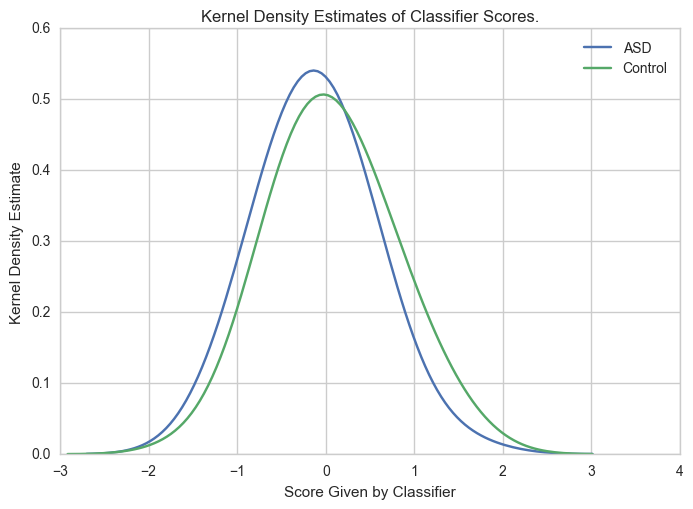

Accuracy:  0.44
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 114}}


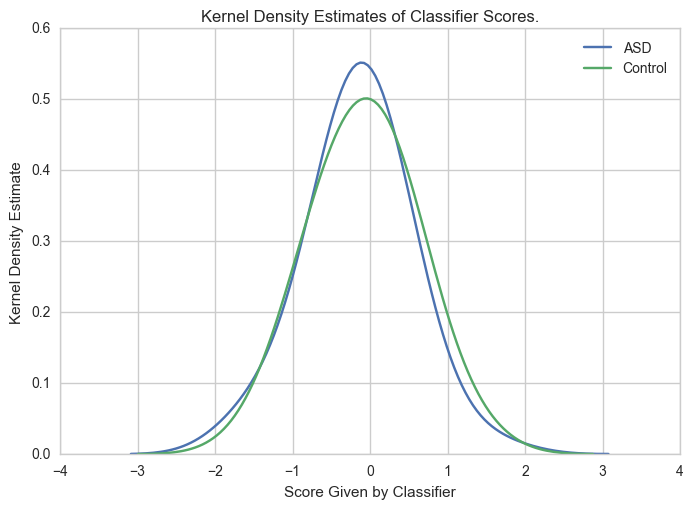

Accuracy:  0.45
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 115}}


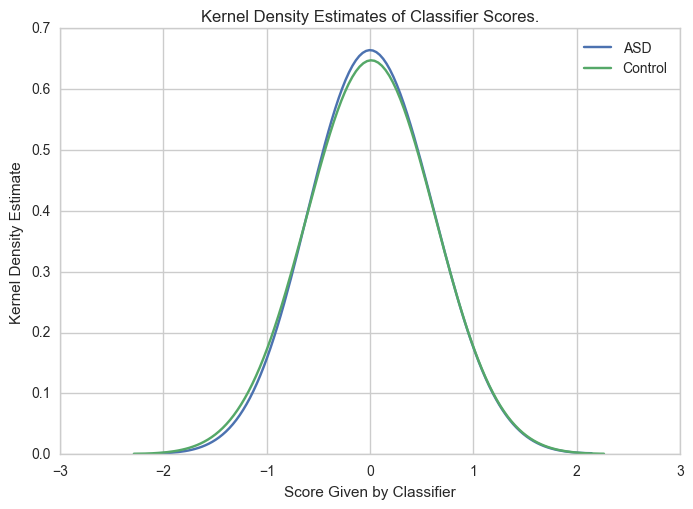

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 116}}


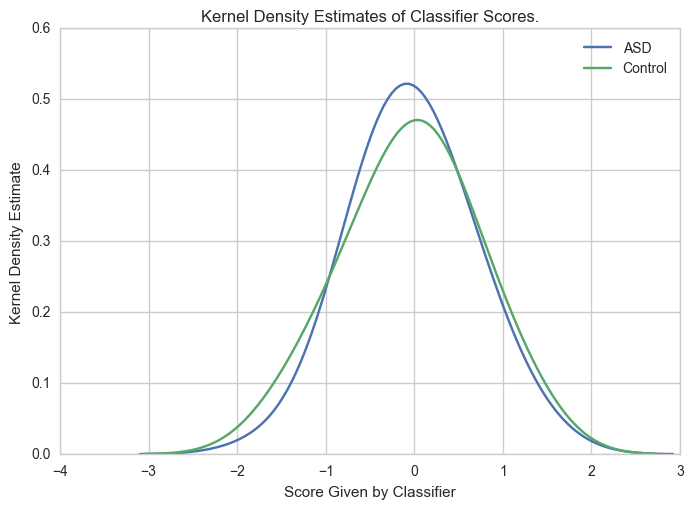

Accuracy:  0.44
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 117}}


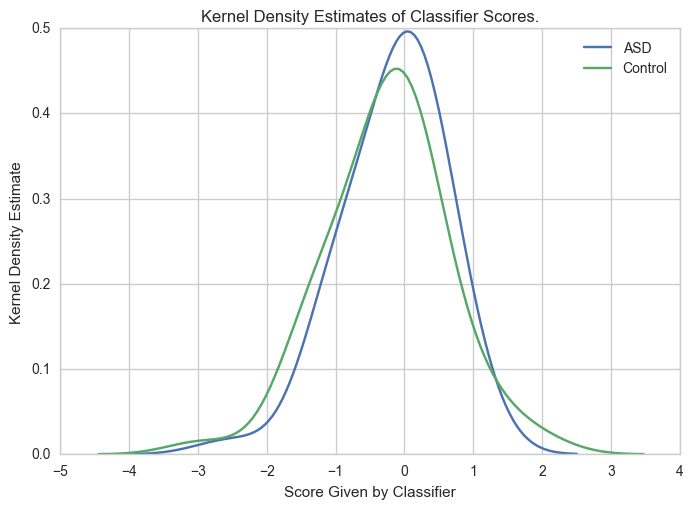

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 118}}


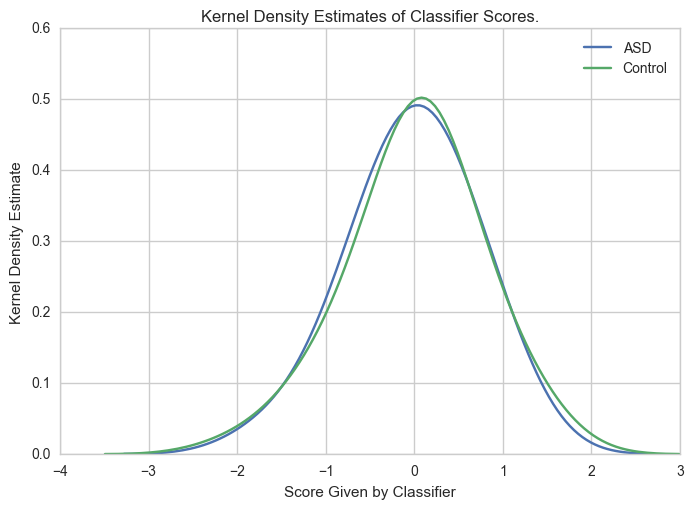

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 119}}


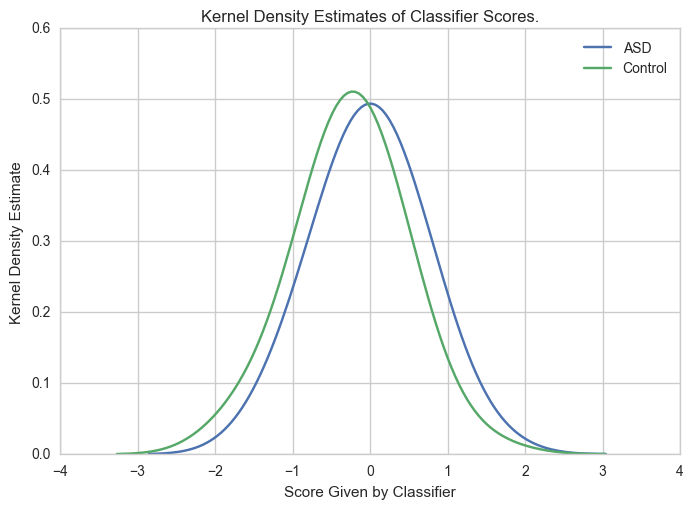

Accuracy:  0.58
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 120}}


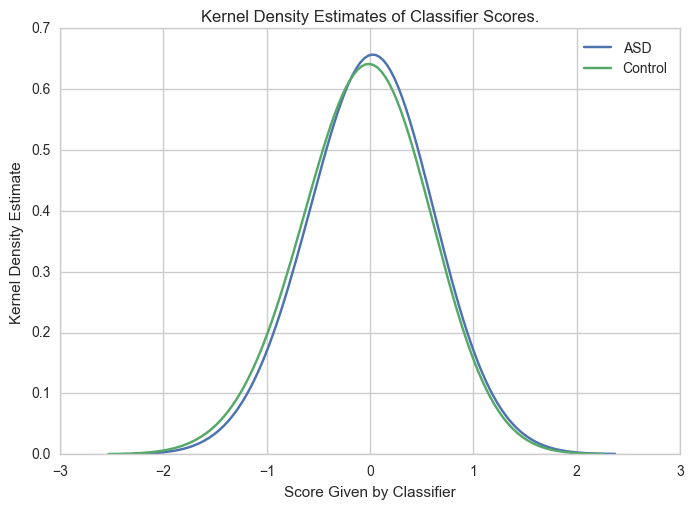

Accuracy:  0.52
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 121}}


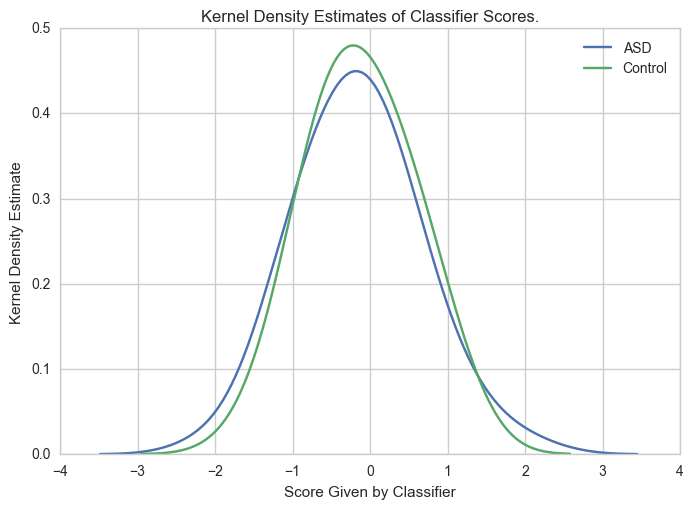

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 122}}


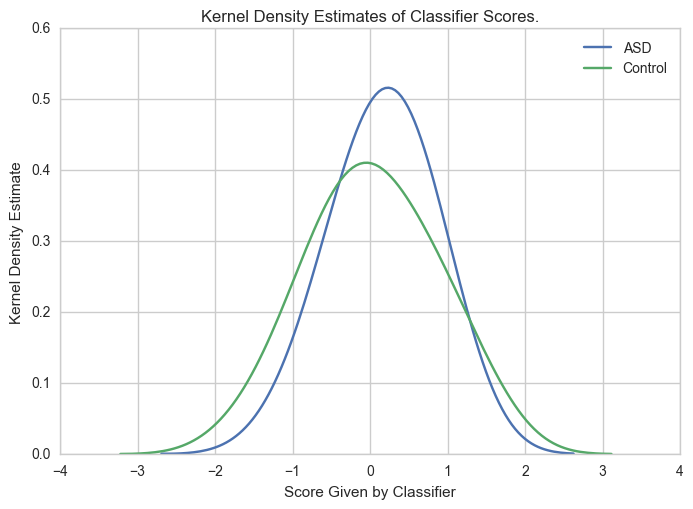

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 123}}


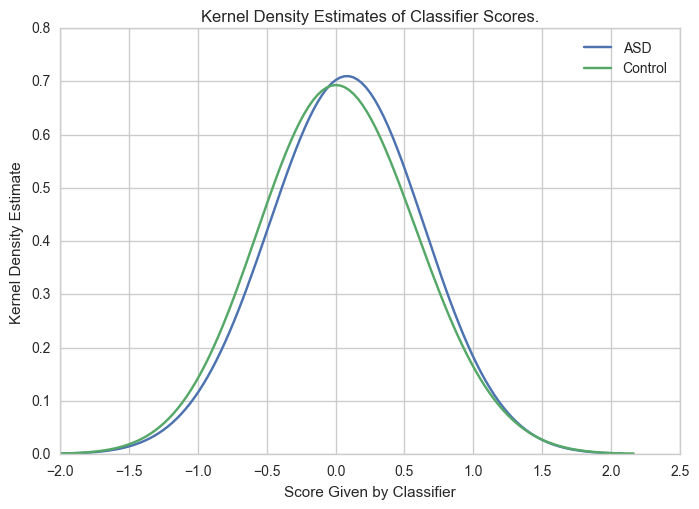

Accuracy:  0.59
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 124}}


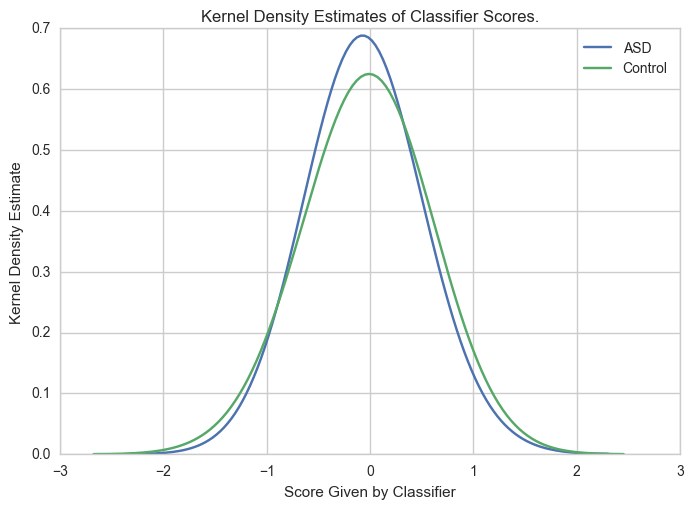

Accuracy:  0.51
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 125}}


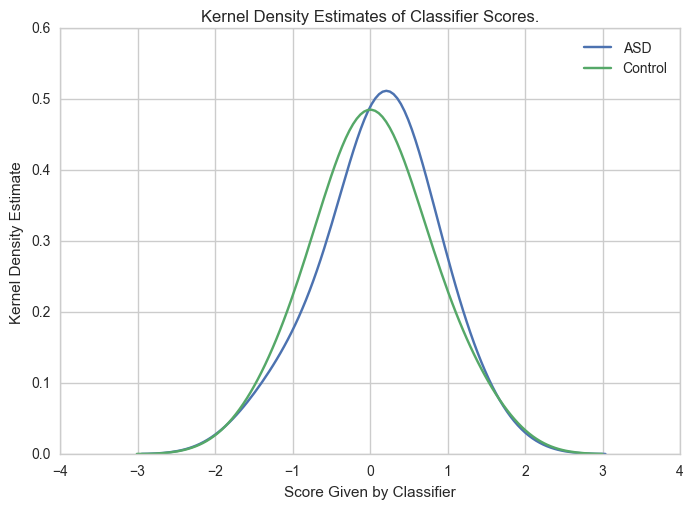

Accuracy:  0.57
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 126}}


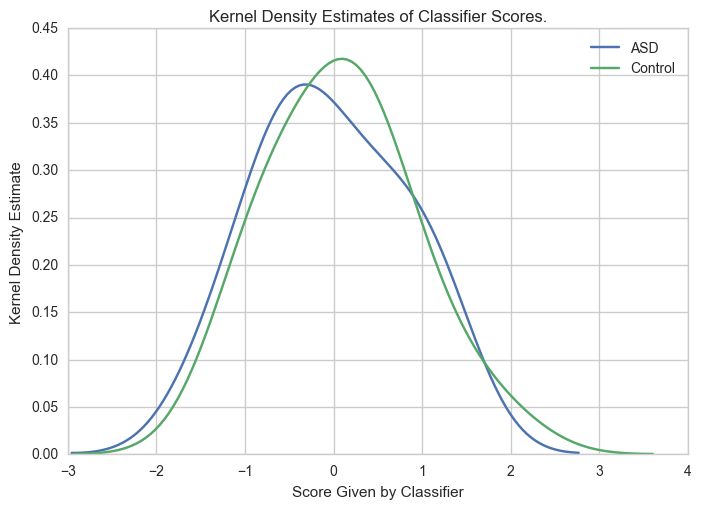

Accuracy:  0.44
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 127}}


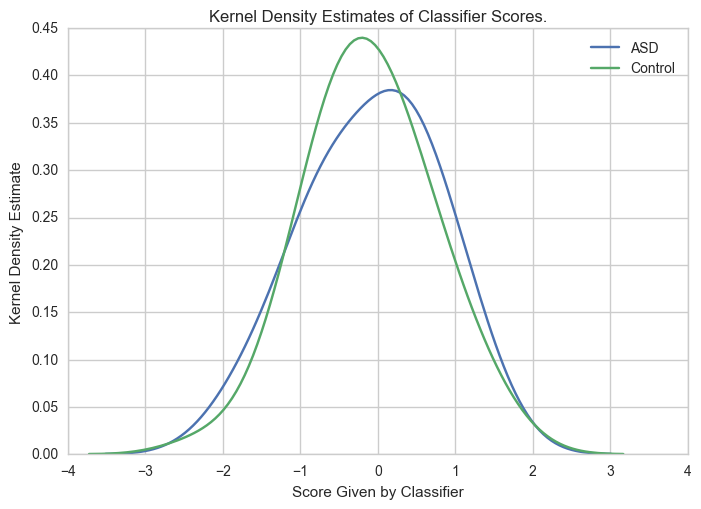

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 128}}


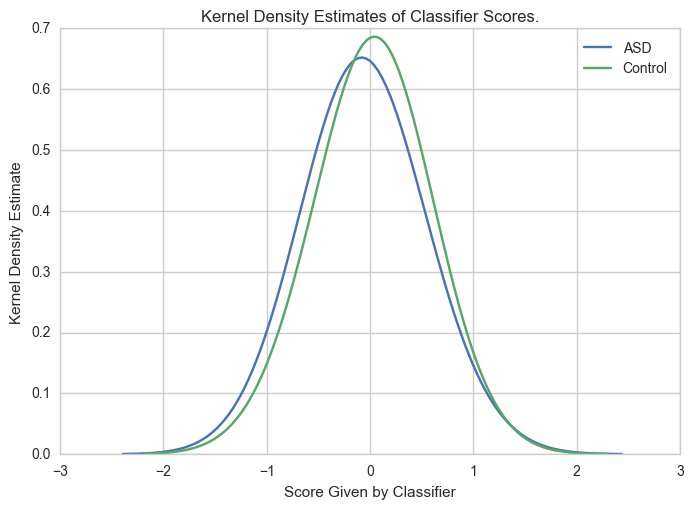

Accuracy:  0.38
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 129}}


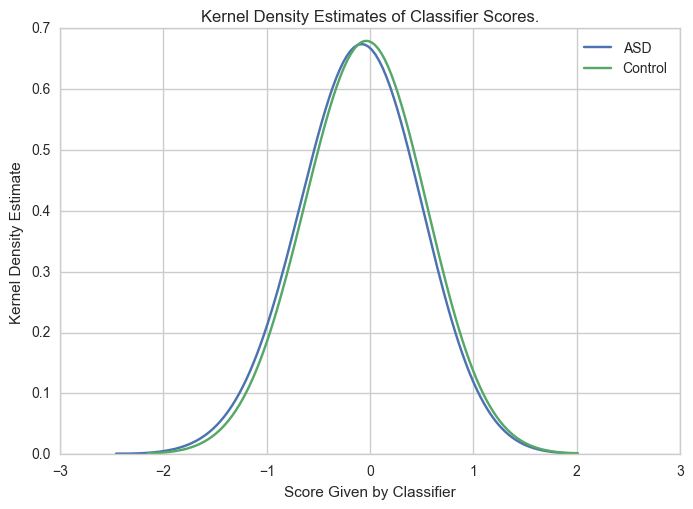

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 130}}


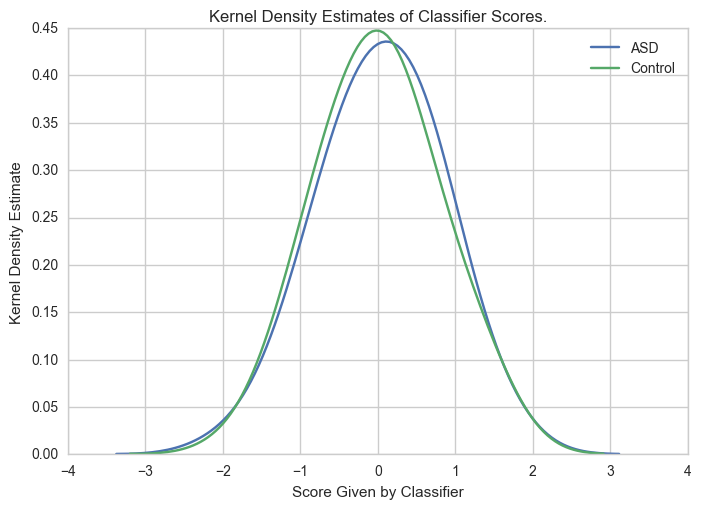

Accuracy:  0.51
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 131}}


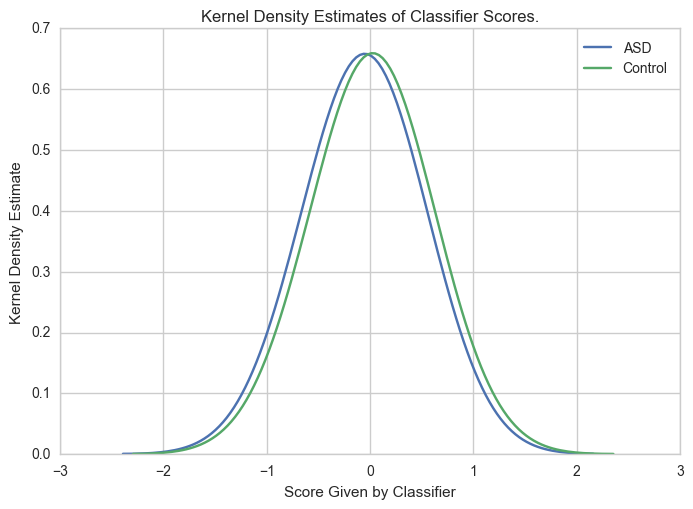

Accuracy:  0.45
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 132}}


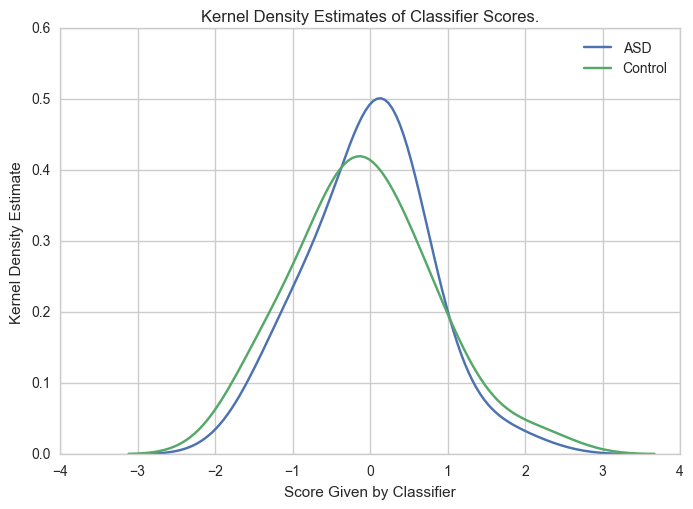

Accuracy:  0.57
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 133}}


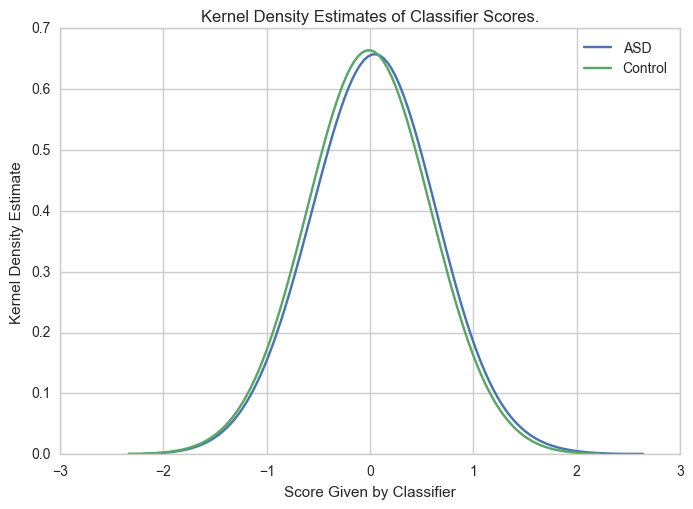

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 134}}


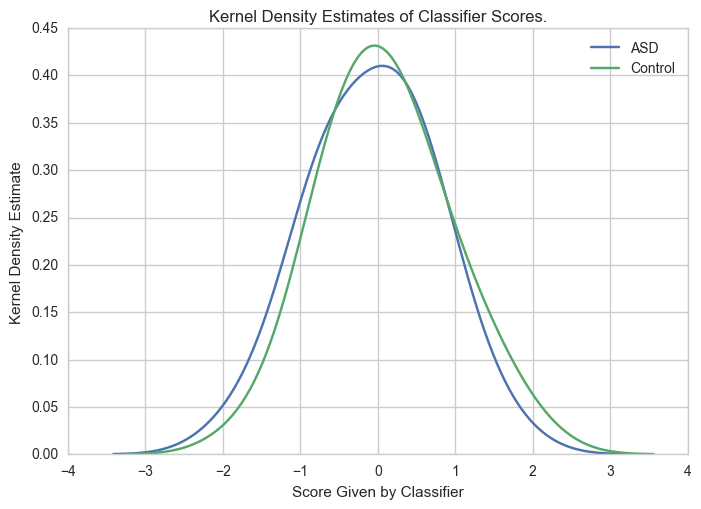

Accuracy:  0.5
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 135}}


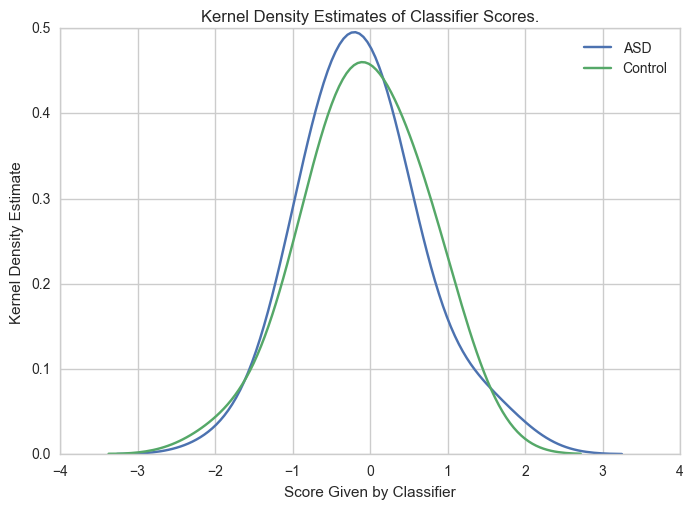

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 136}}


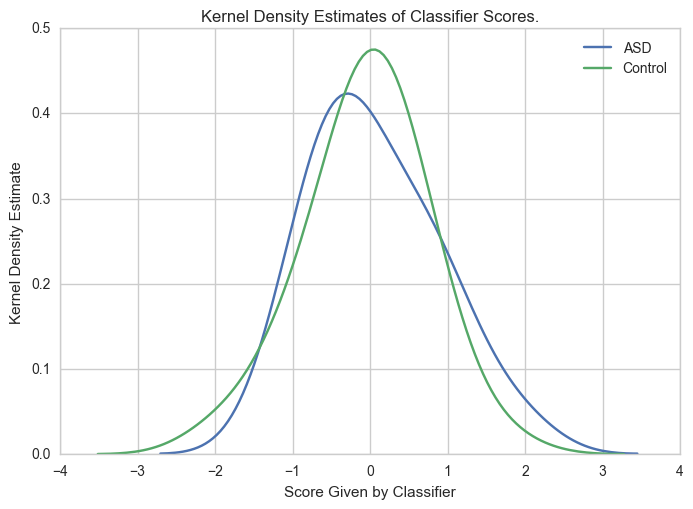

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 137}}


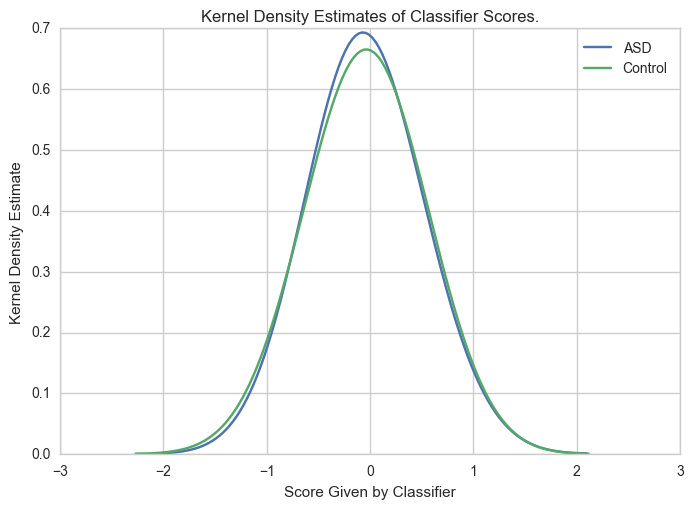

Accuracy:  0.42
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 138}}


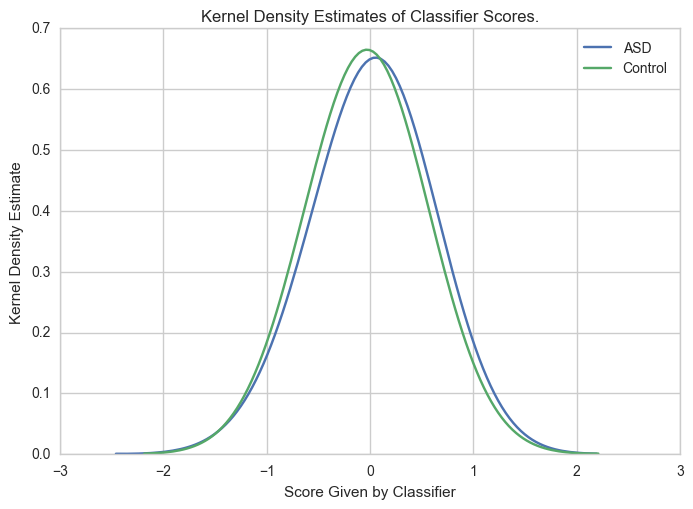

Accuracy:  0.56
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 139}}


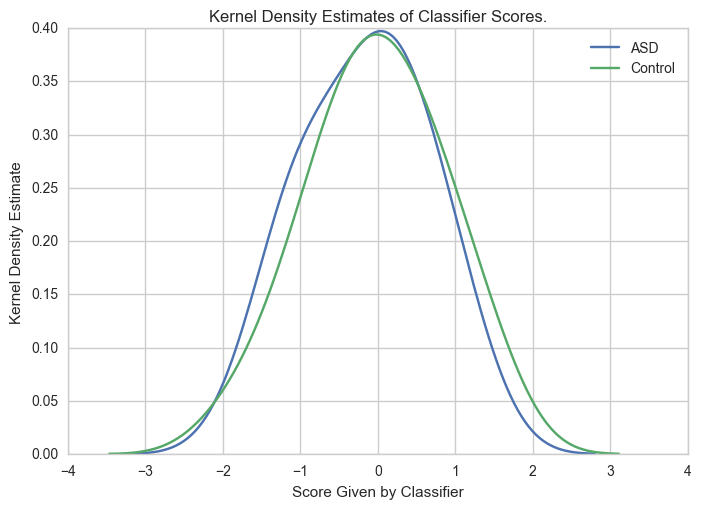

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 140}}


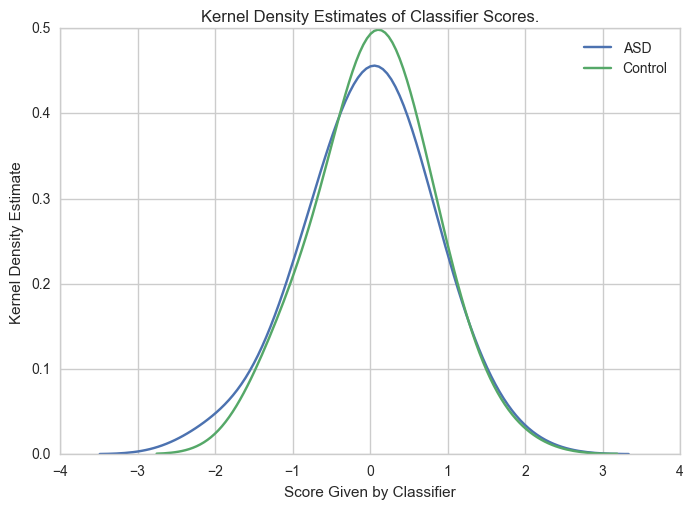

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 141}}


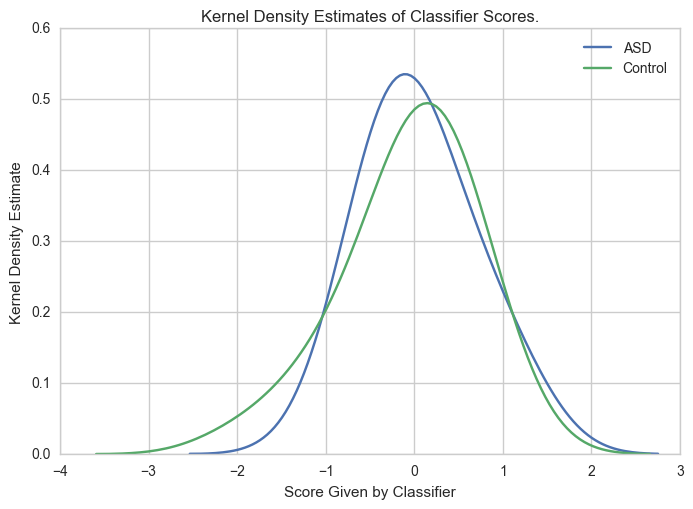

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 142}}


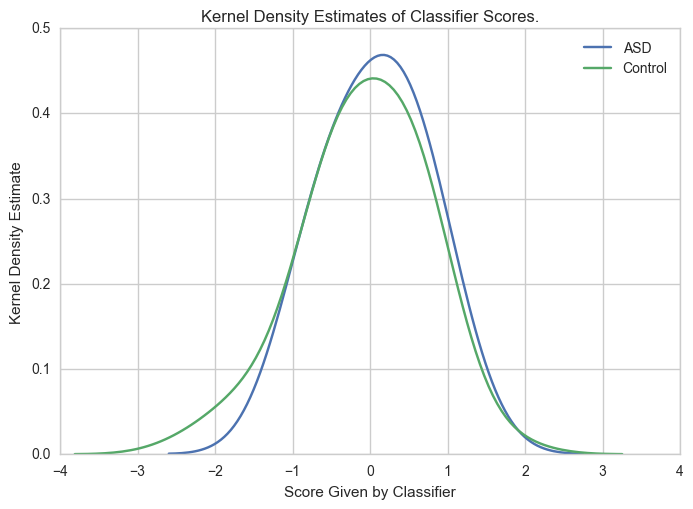

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 143}}


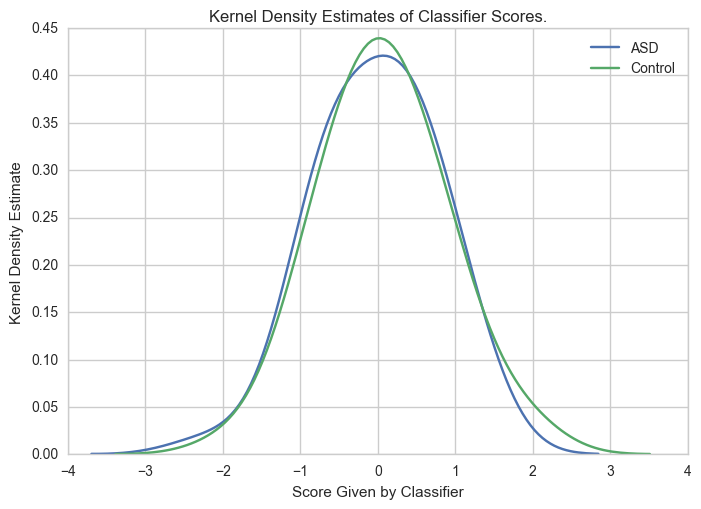

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 144}}


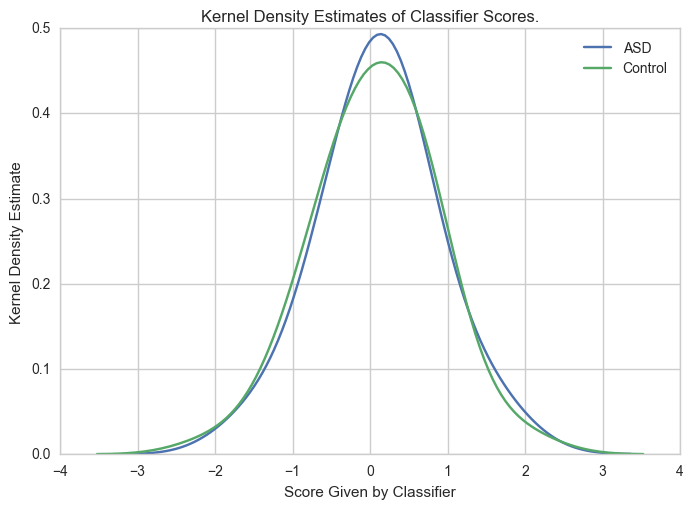

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 145}}


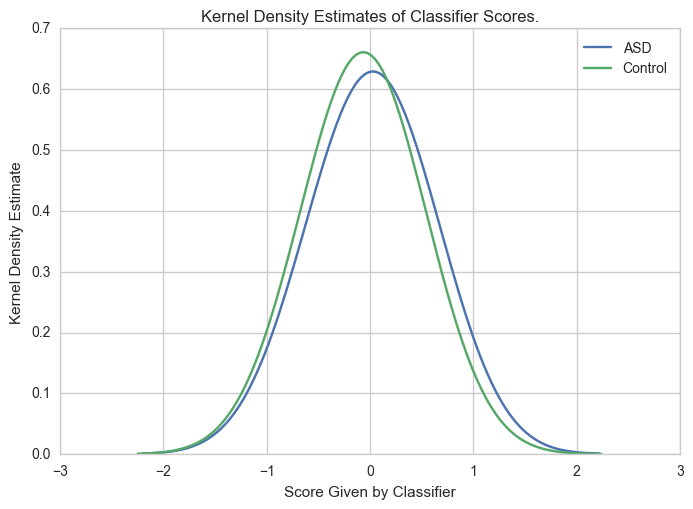

Accuracy:  0.58
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 146}}


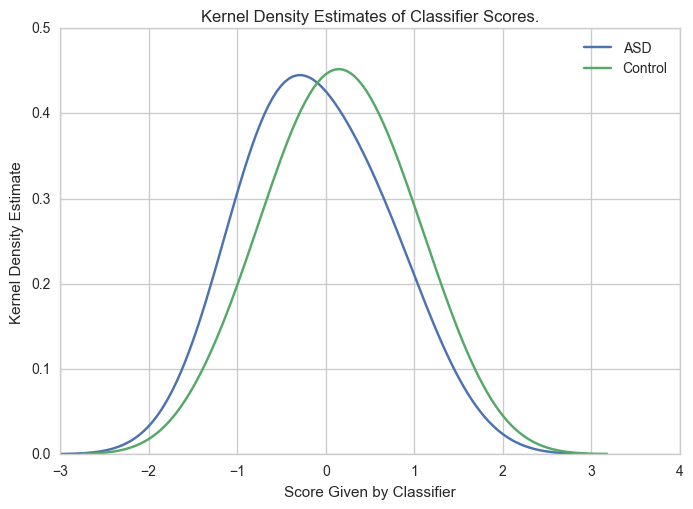

Accuracy:  0.4
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 147}}


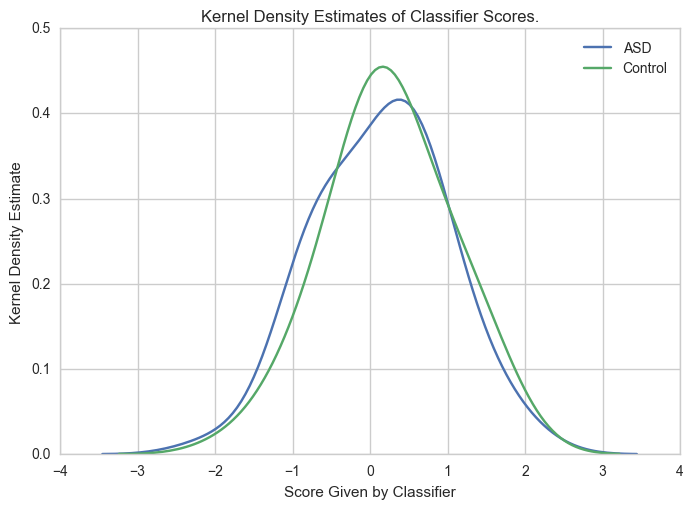

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 148}}


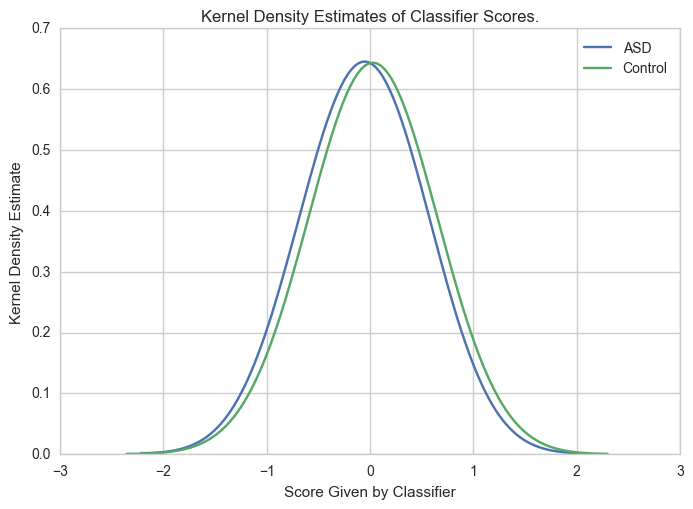

Accuracy:  0.44
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 149}}


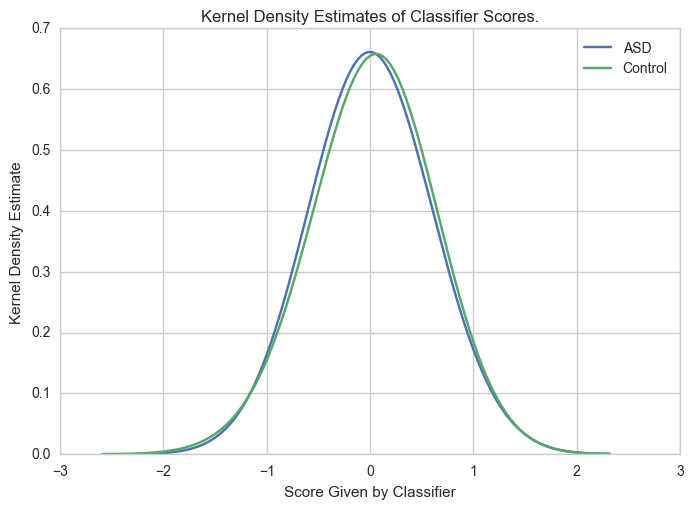

Accuracy:  0.45
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 150}}


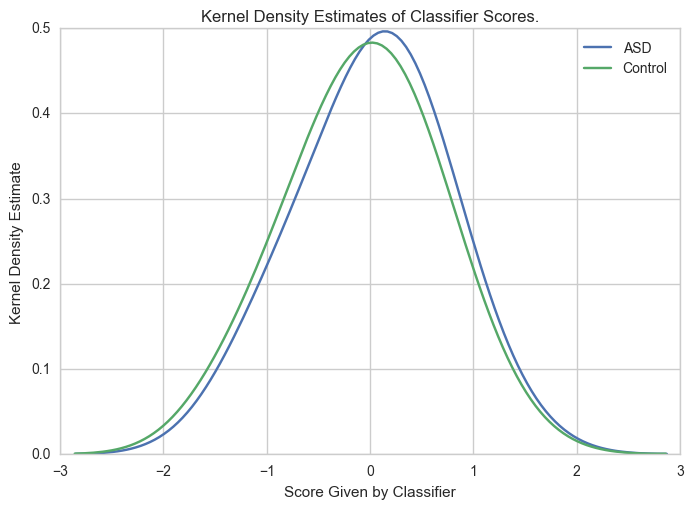

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 151}}


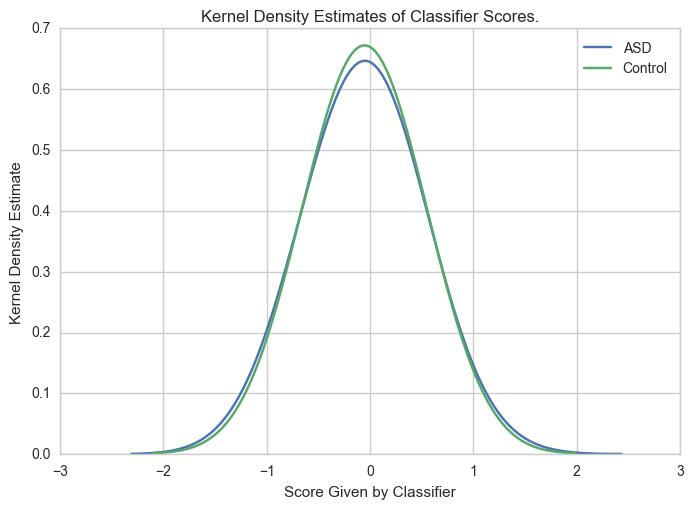

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 152}}


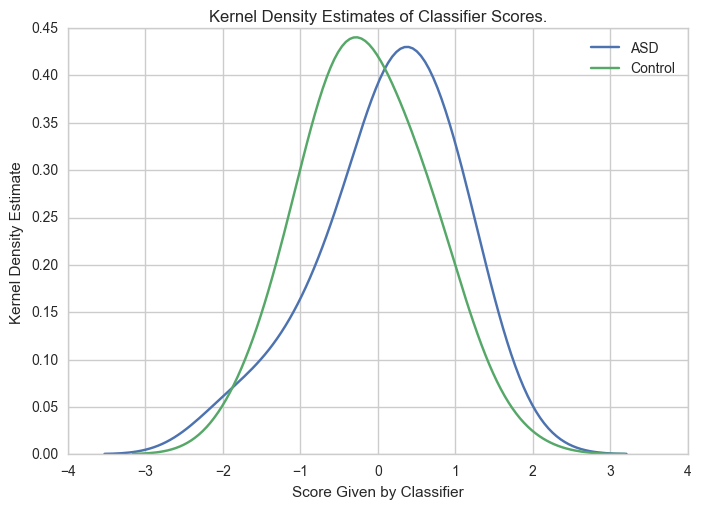

Accuracy:  0.65
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 153}}


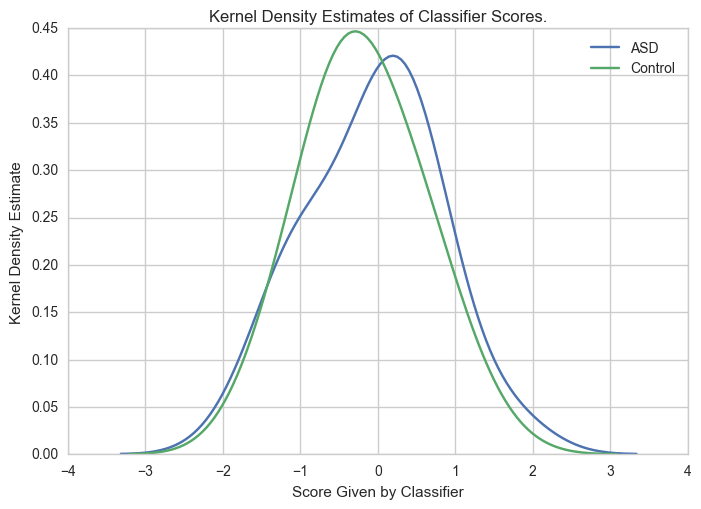

Accuracy:  0.58
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 154}}


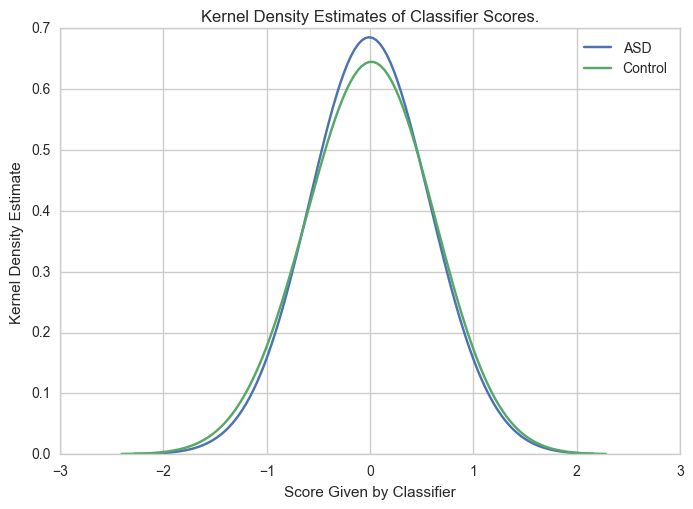

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 155}}


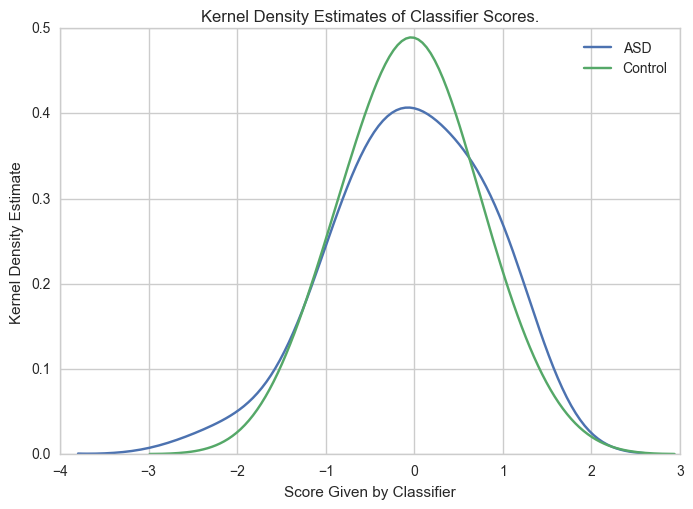

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 156}}


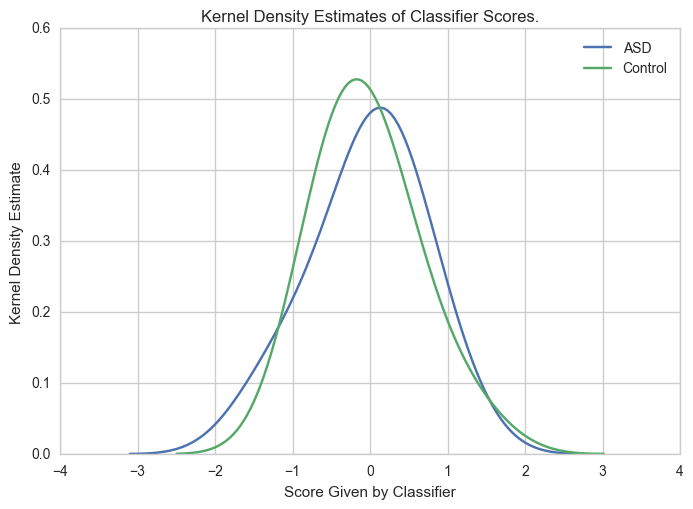

Accuracy:  0.59
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 157}}


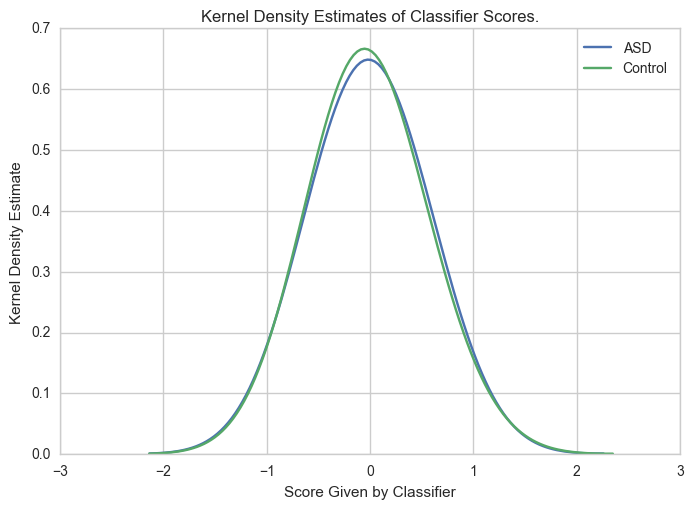

Accuracy:  0.57
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 158}}


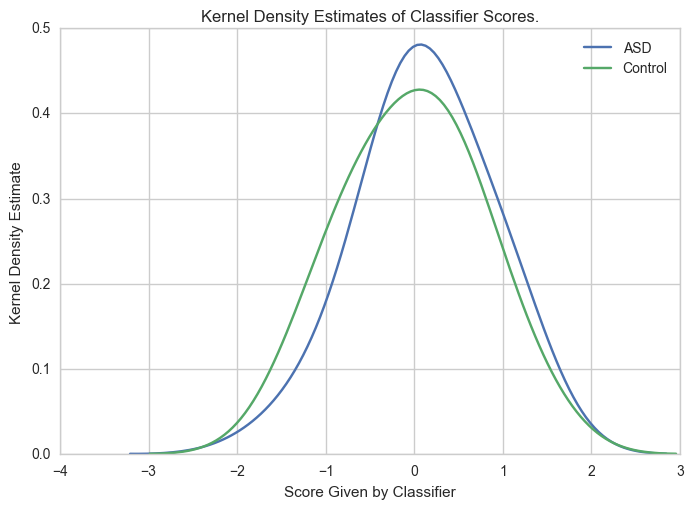

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 159}}


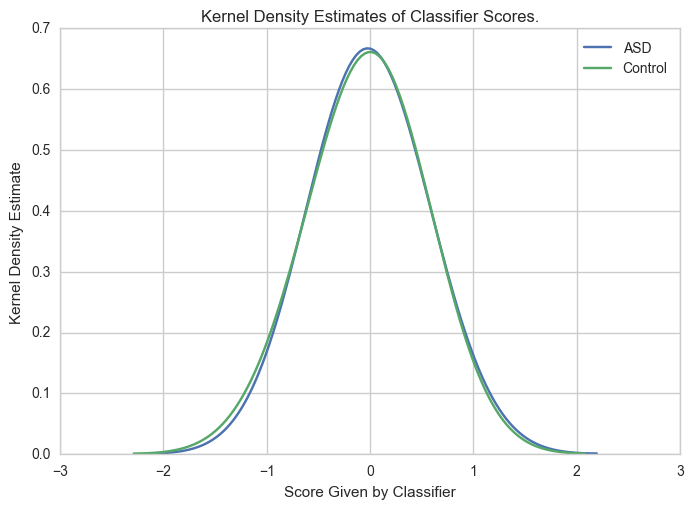

Accuracy:  0.46
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 160}}


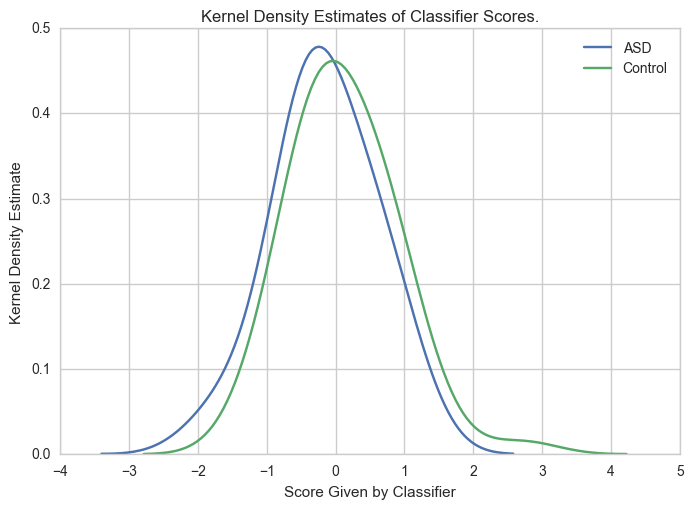

Accuracy:  0.43
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 161}}


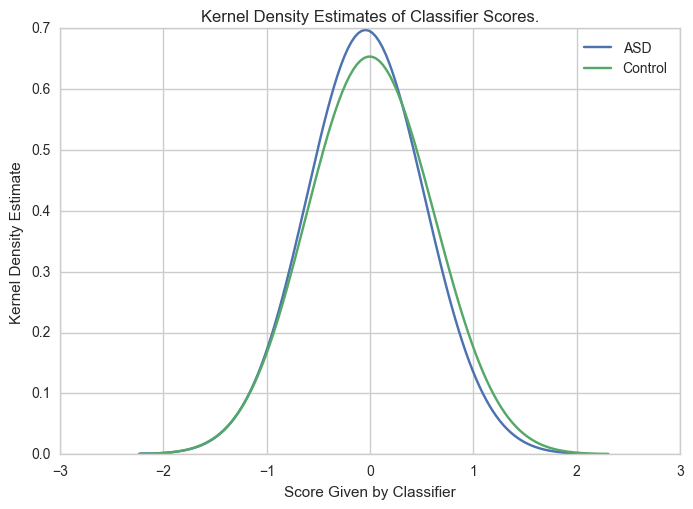

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 162}}


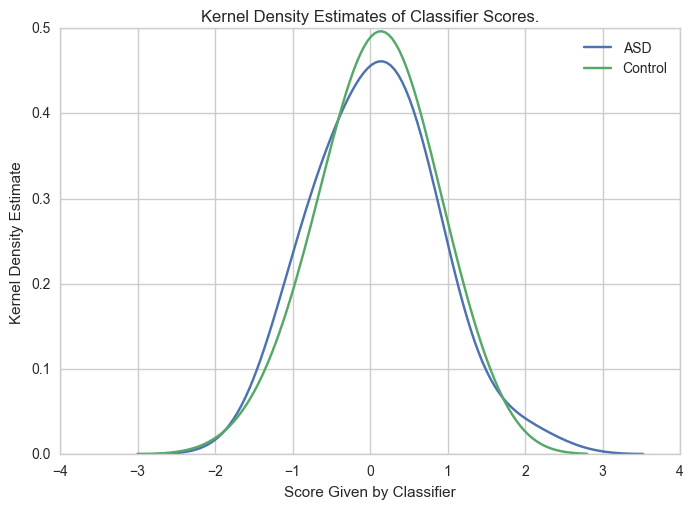

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 163}}


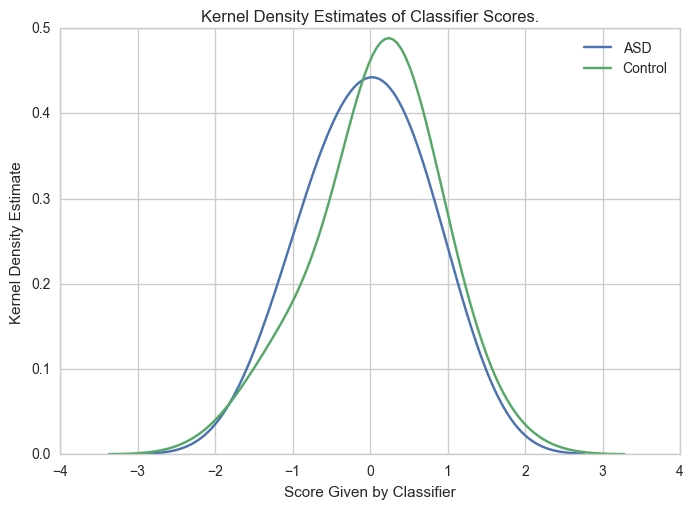

Accuracy:  0.42
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 164}}


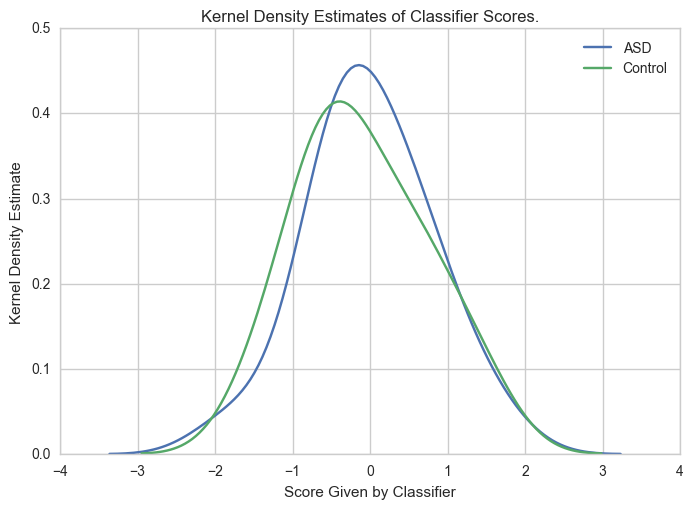

Accuracy:  0.5
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 165}}


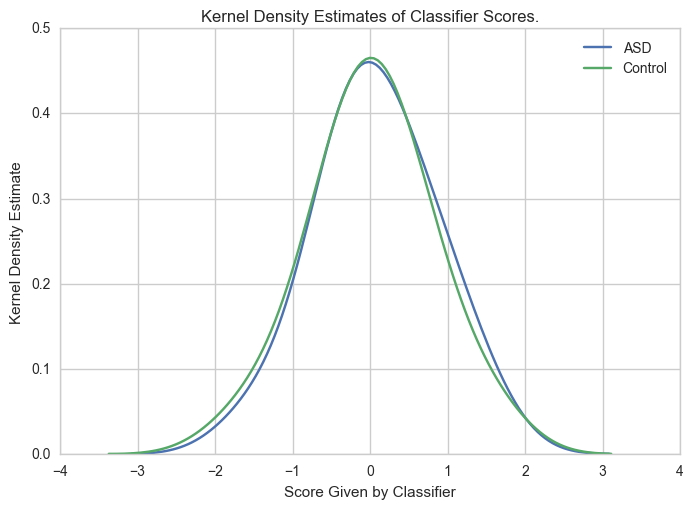

Accuracy:  0.5
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 166}}


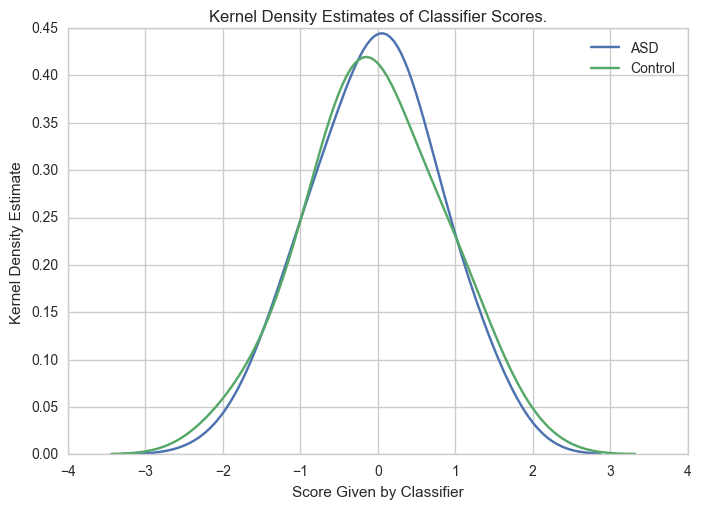

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 167}}


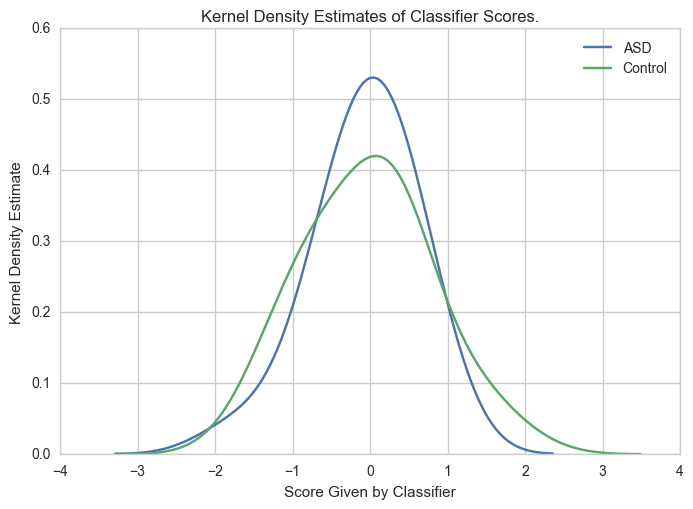

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 168}}


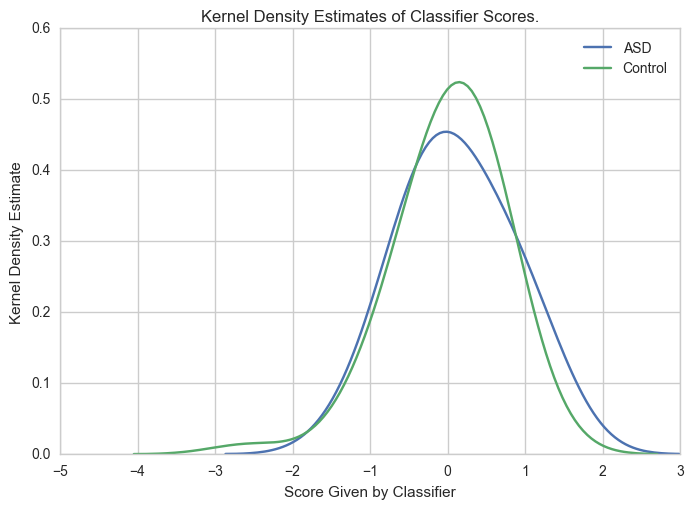

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 169}}


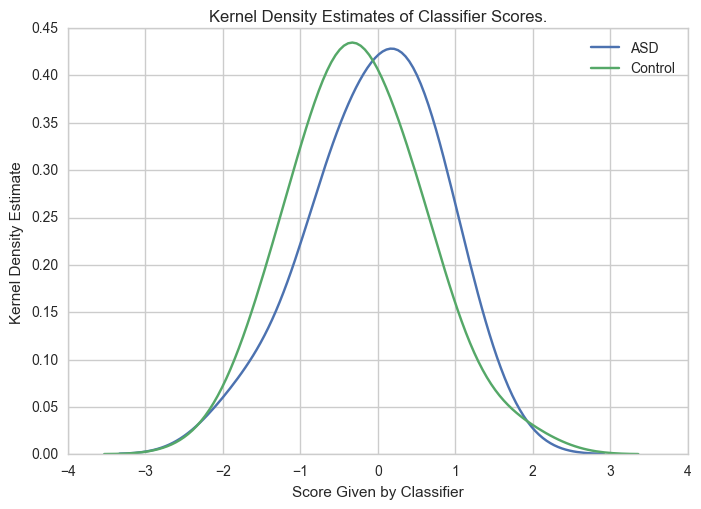

Accuracy:  0.63
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 170}}


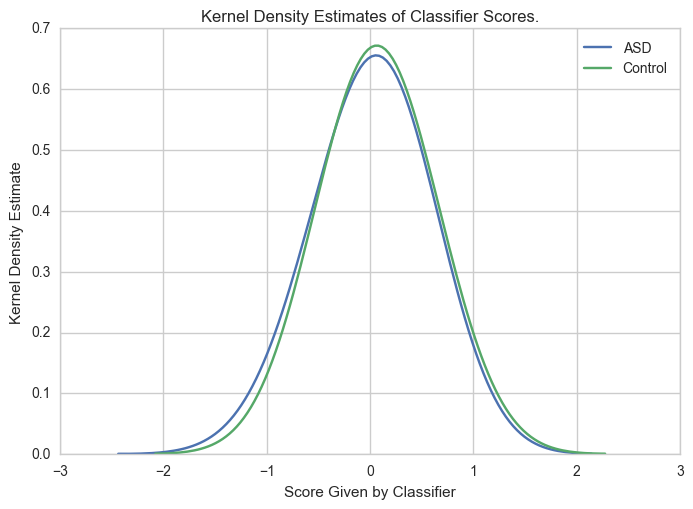

Accuracy:  0.53
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 171}}


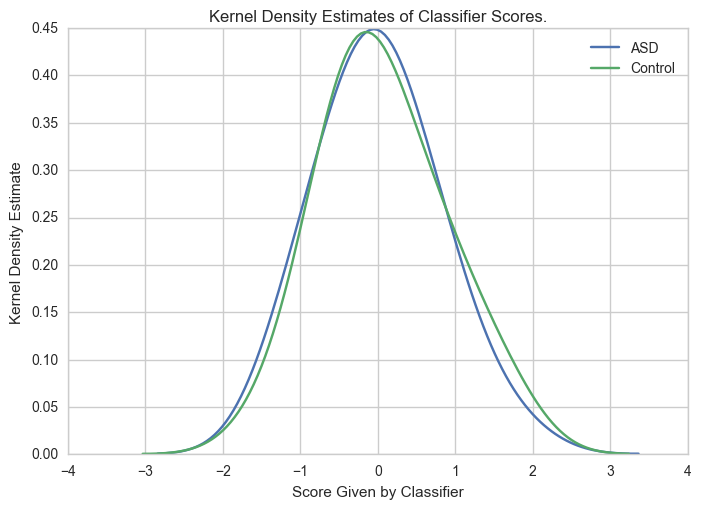

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 172}}


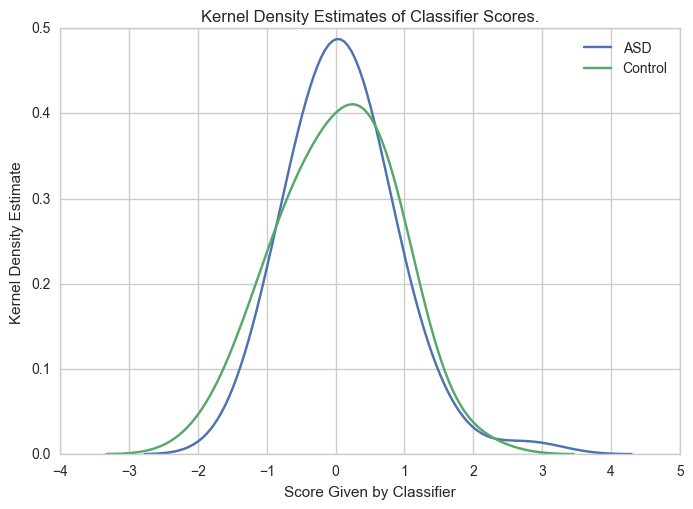

Accuracy:  0.48
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 173}}


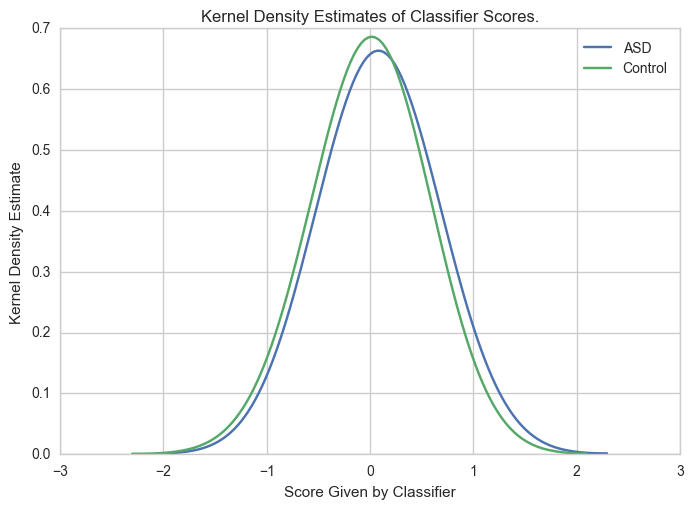

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 174}}


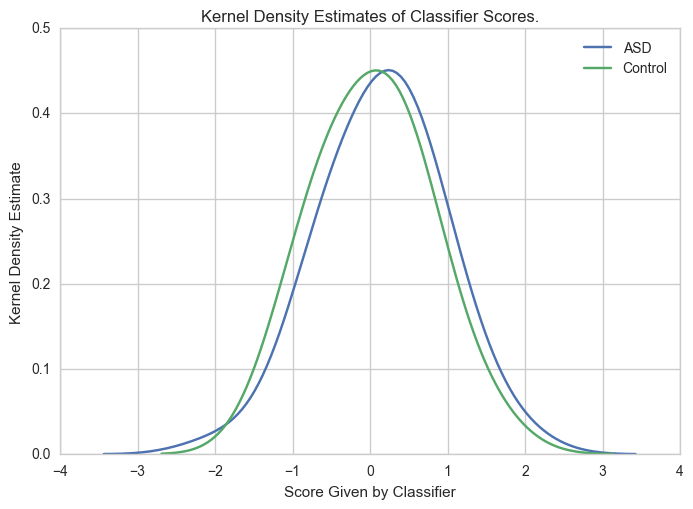

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 175}}


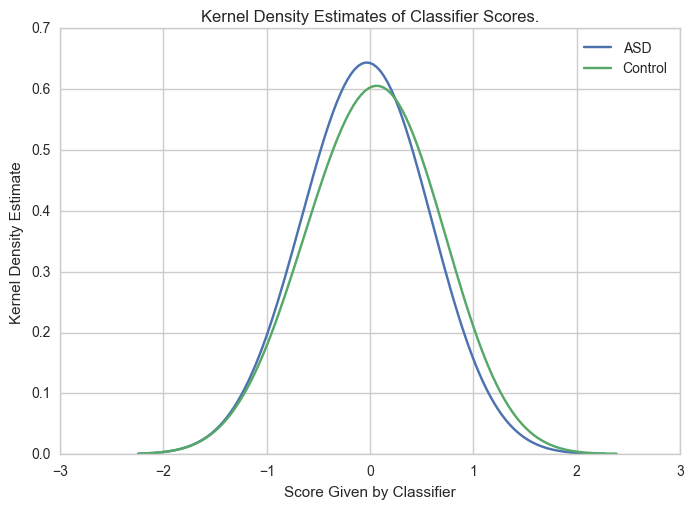

Accuracy:  0.46
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 176}}


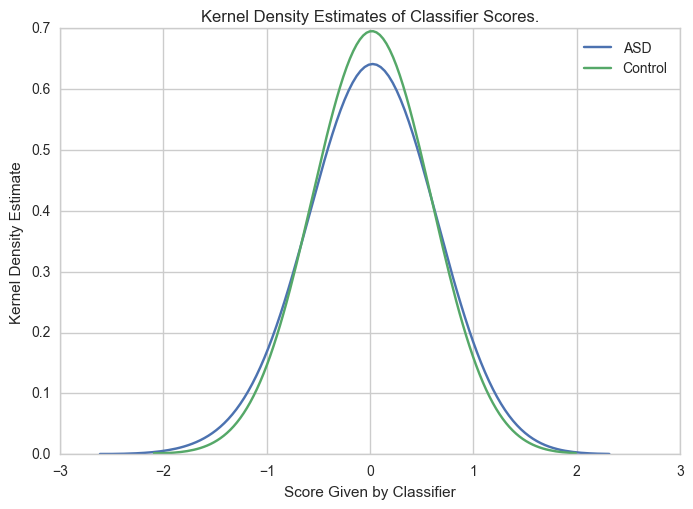

Accuracy:  0.5
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 177}}


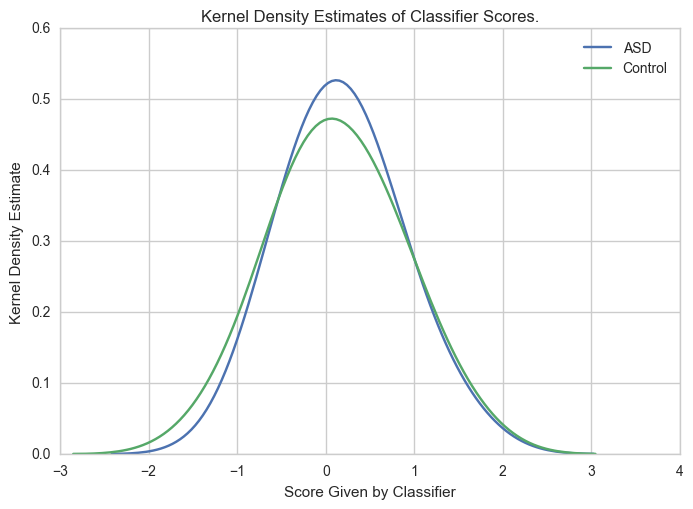

Accuracy:  0.57
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 178}}


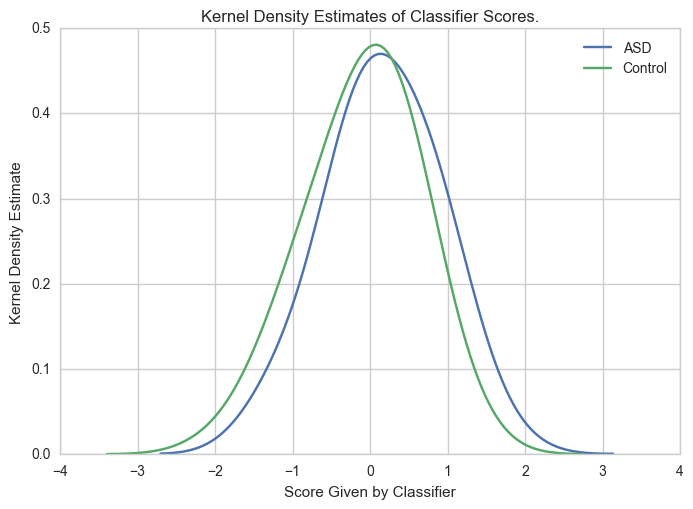

Accuracy:  0.5
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 179}}


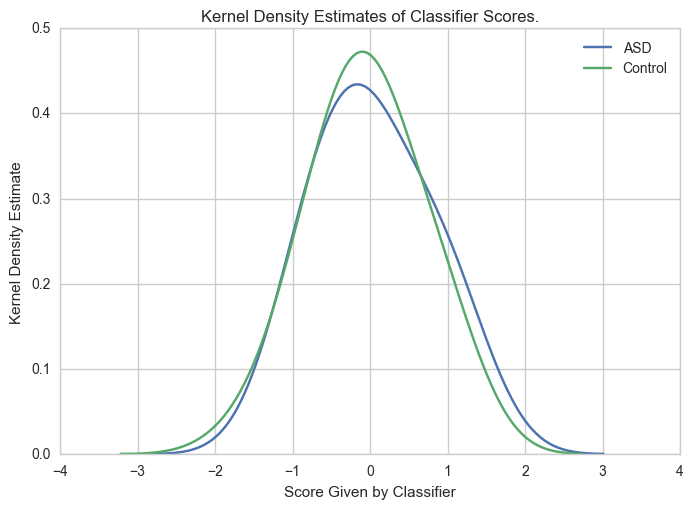

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 180}}


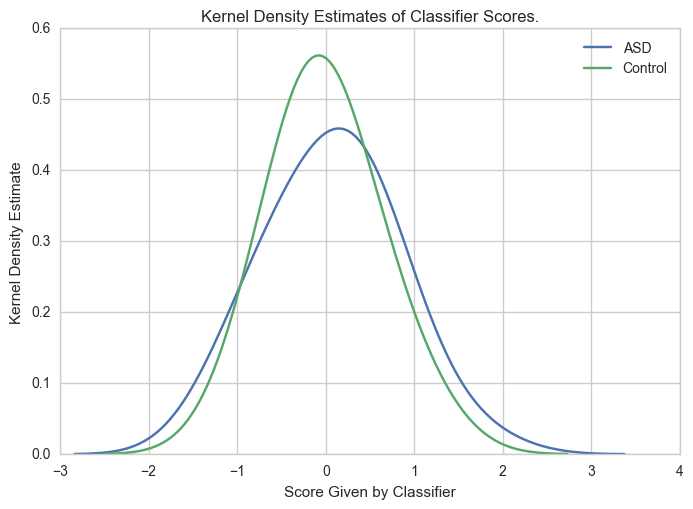

Accuracy:  0.58
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 181}}


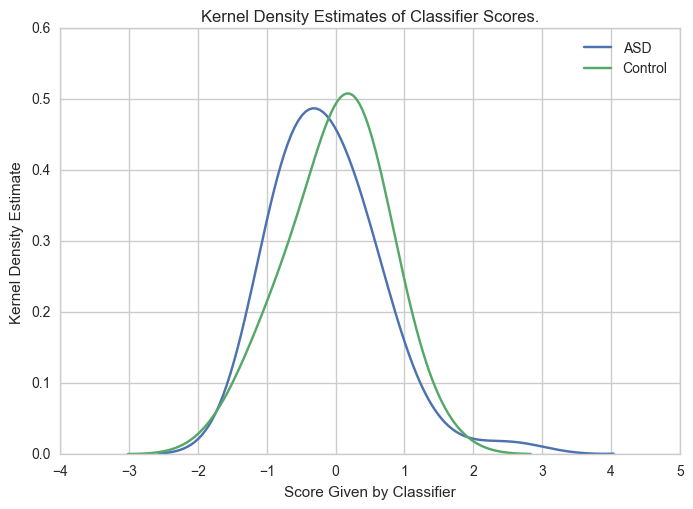

Accuracy:  0.42
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 182}}


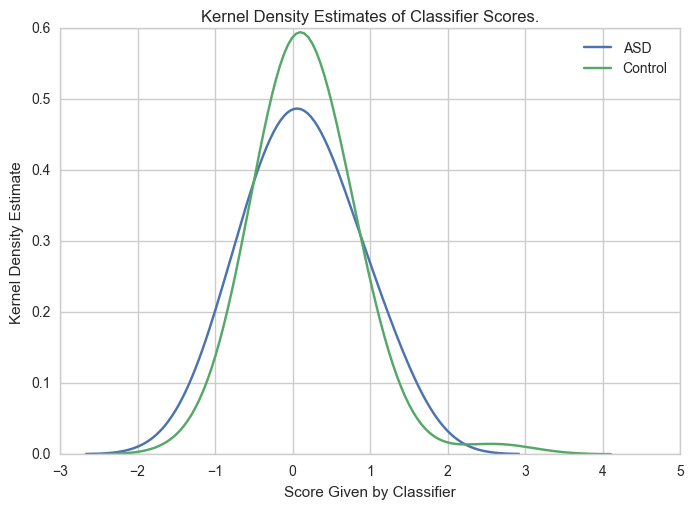

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 183}}


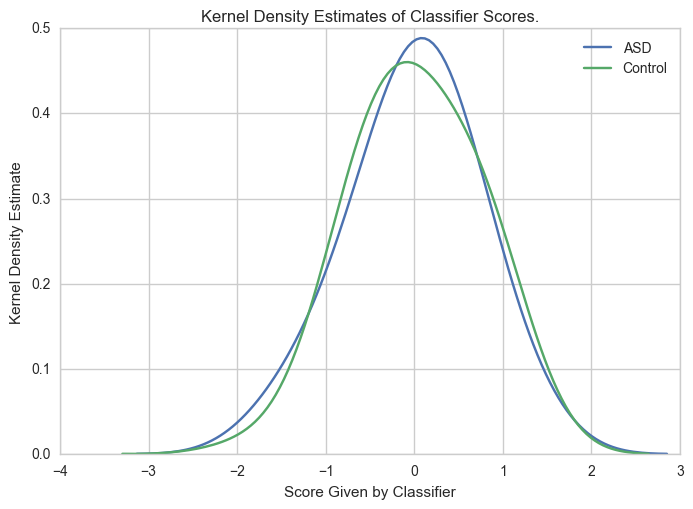

Accuracy:  0.5
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 184}}


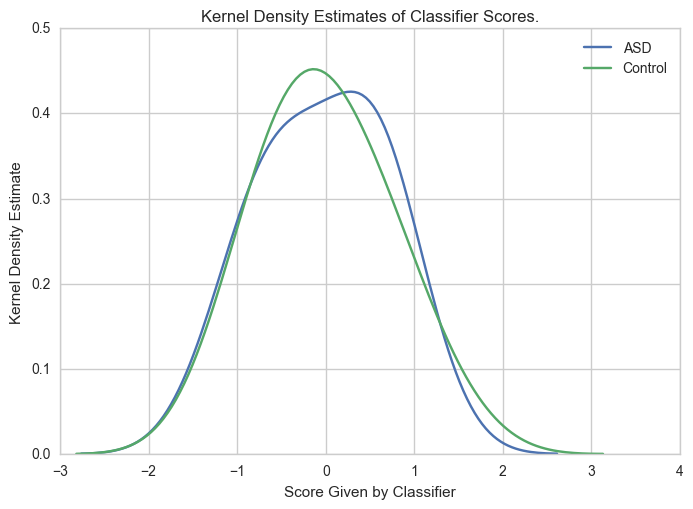

Accuracy:  0.52
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 185}}


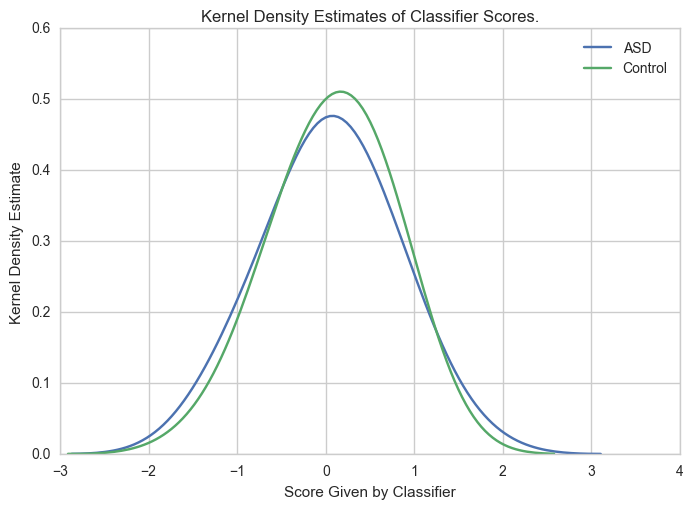

Accuracy:  0.46
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 186}}


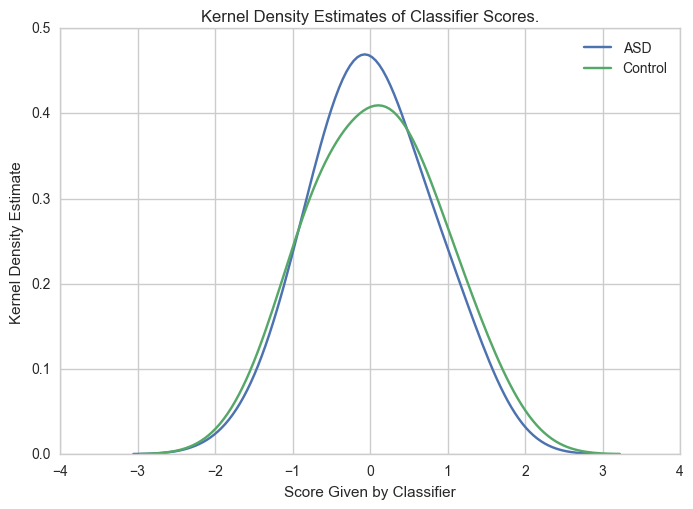

Accuracy:  0.47
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 187}}


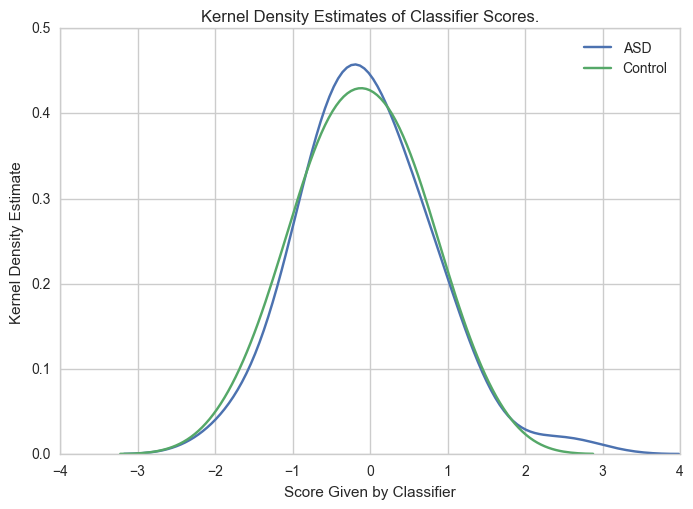

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 188}}


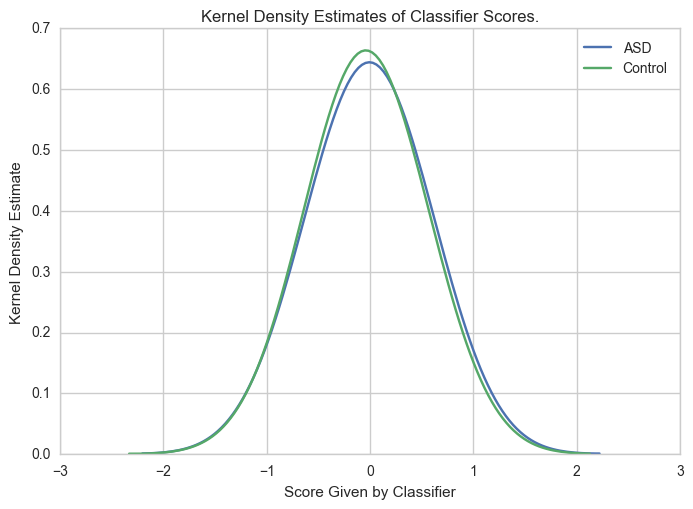

Accuracy:  0.52
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 189}}


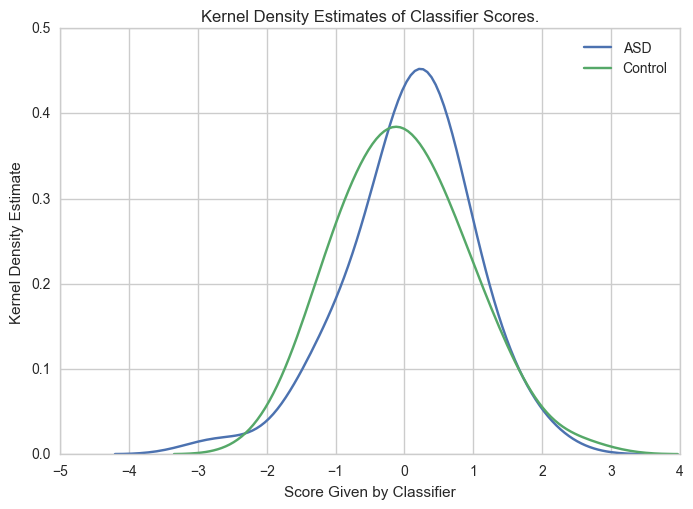

Accuracy:  0.58
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 190}}


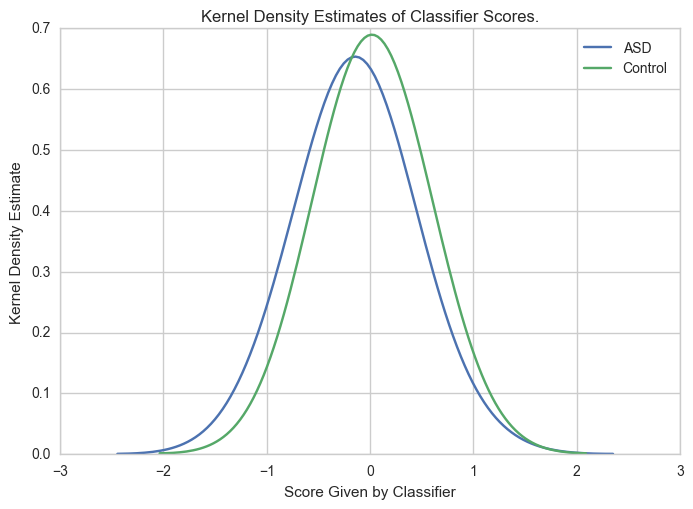

Accuracy:  0.41
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 191}}


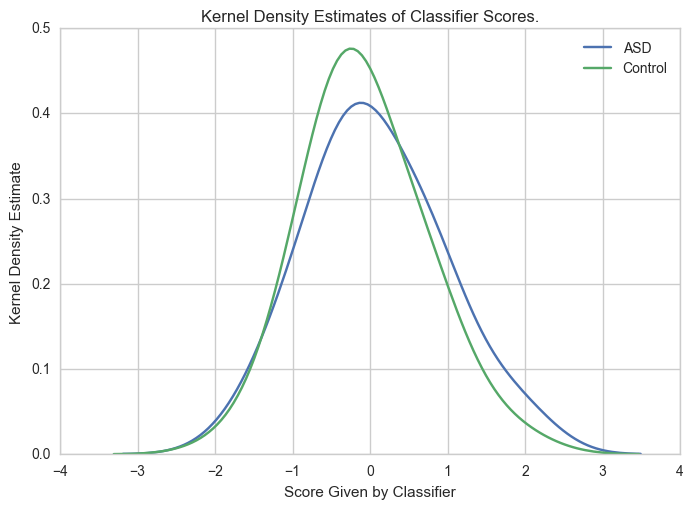

Accuracy:  0.57
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 192}}


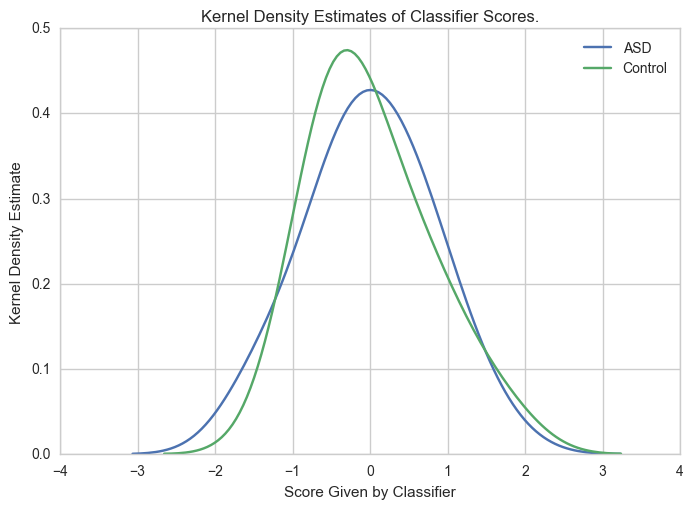

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 193}}


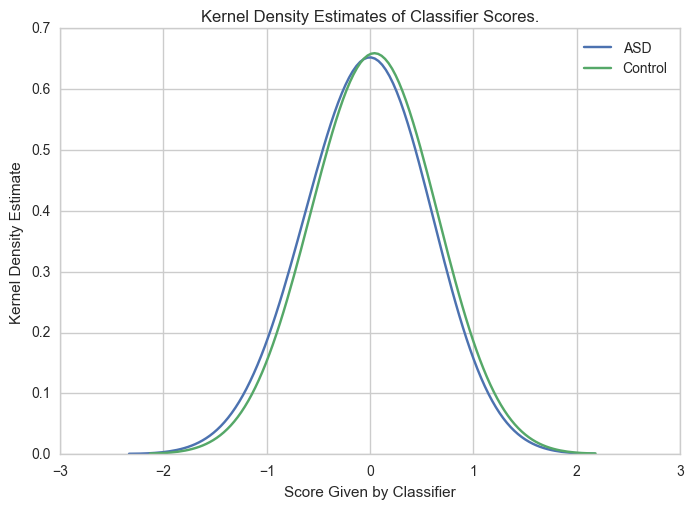

Accuracy:  0.49
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 194}}


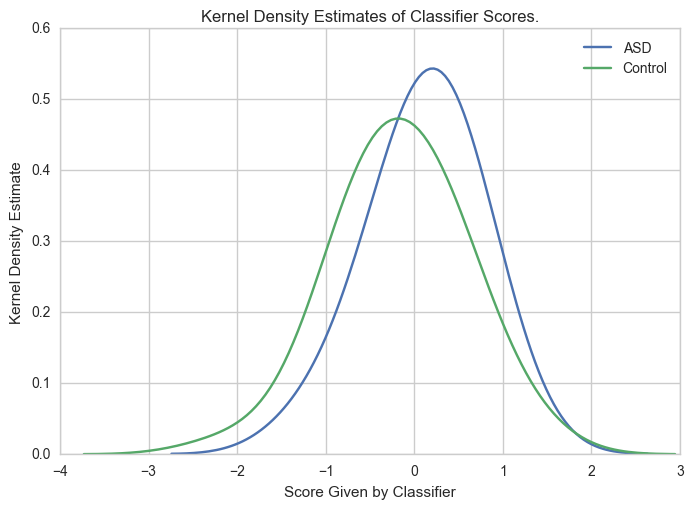

Accuracy:  0.6
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 195}}


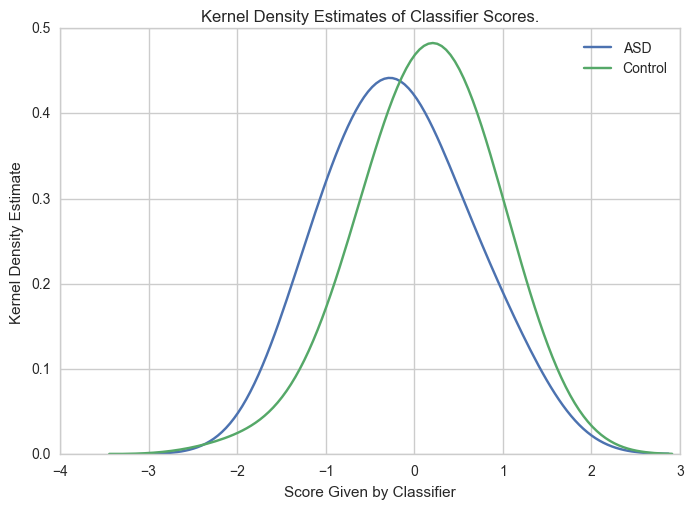

Accuracy:  0.39
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 196}}


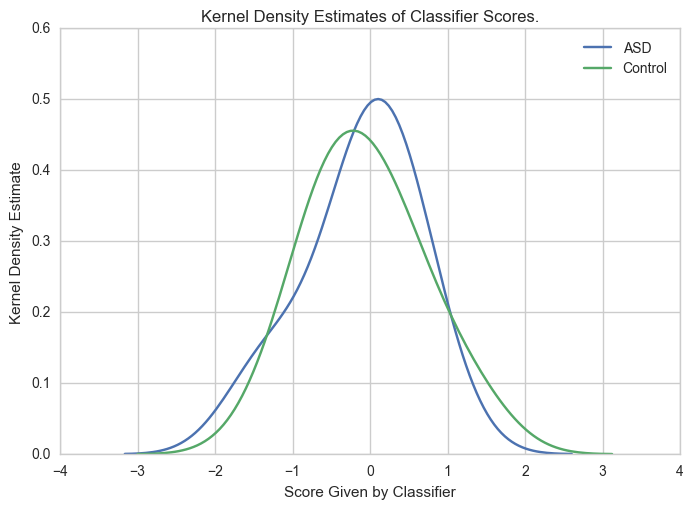

Accuracy:  0.54
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 197}}


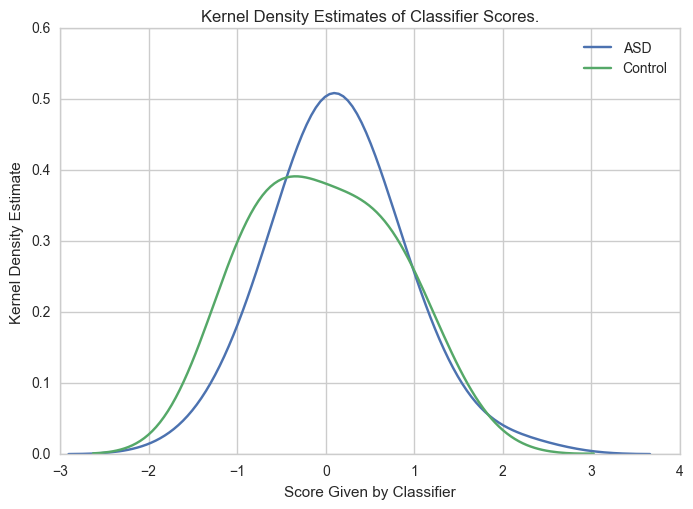

Accuracy:  0.55
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 198}}


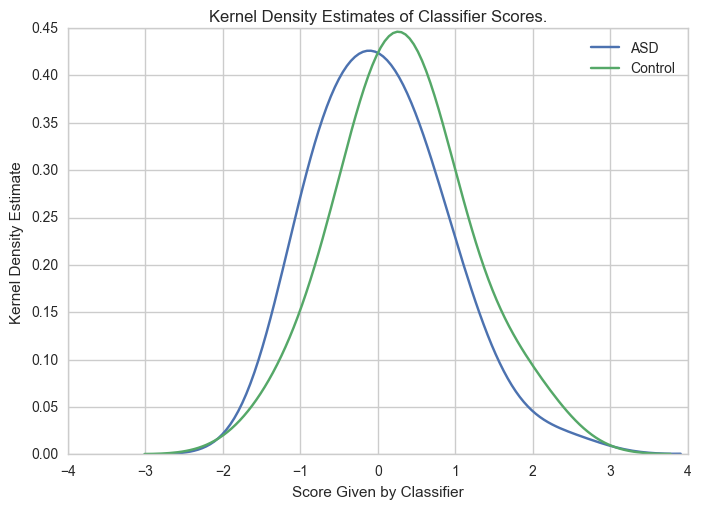

Accuracy:  0.44
Evaluating:  {'clust_params': {'affinity': 'precomputed', 'rando': 199}}


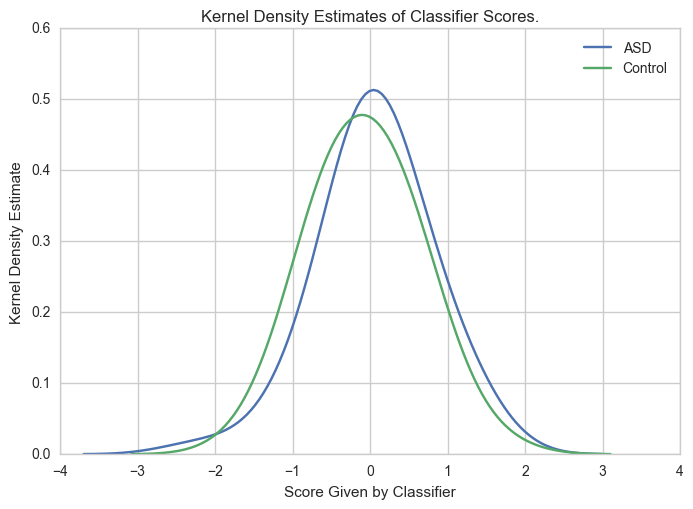

Accuracy:  0.54


ValueError: setting an array element with a sequence.

In [4]:
# make notebook look in correct directory
import os
os.chdir('../src/')
import util.setup as setup
import numpy as np
from util import clean_data as cd
import algos.basic as basic
import algos.similarity as sim
import experiments.static as static
import util.viz as viz
import experiments.rando as rando
model = {
    'clust' : sim.rando,
    'correl' : basic.correl,
    'thresh' : np.arange(.01, .1, .032),
    'show_plots' : False
}
cp = []
rando_opts = np.arange(200)
for r in rando_opts:
    p = {
        'clust_params' : {
            'affinity' : 'precomputed',
            'rando' : r
        }
    }
    cp.append(p)
accs = rando.hyper_search(model, cp)
import matplotlib.pyplot as plt
plt.hist(accs)
plt.show()

In [2]:
ap, _ = zip(*accs)

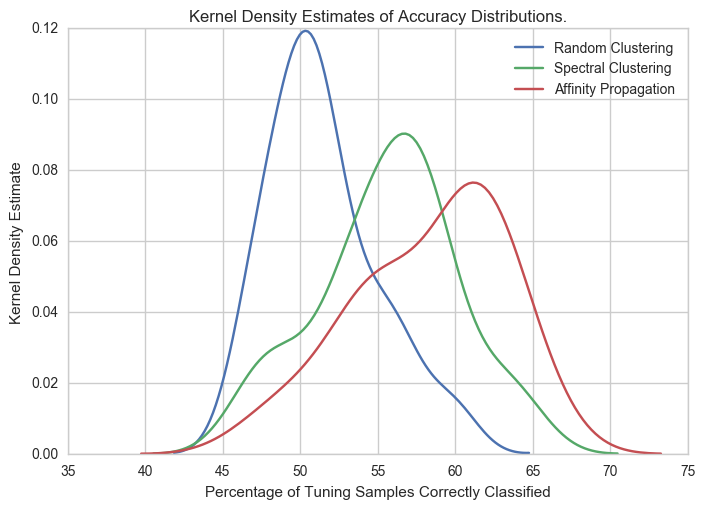

In [5]:
import seaborn as sns
sns.set_style('whitegrid')
spec = [.64,.63,.53,.58,.58,.54,.52,.55,.57,.59,.48,.57,.49,.53,.47,.56,.57,.55,.58,.6]
bins = np.arange(.35, .7, .01)
bandwidth = .05
acc = np.random.binomial(100, .5, 18) / 100.
sns.distplot(np.hstack((np.array(acc))) * 100 + .8, label='Random Clustering', norm_hist = False, hist=False)
sns.distplot(np.array(spec) * 100, label = 'Spectral Clustering', norm_hist = True, hist=False)
sns.distplot(np.array(ap) * 100, label = 'Affinity Propagation', norm_hist = True, hist=False)
plt.title("Kernel Density Estimates of Accuracy Distributions.")
plt.xlabel("Percentage of Tuning Samples Correctly Classified")
plt.ylabel("Kernel Density Estimate")
plt.show()

In [ ]:

data = [1.5]*7 + [2.5]*2 + [3.5]*8 + [4.5]*3 + [5.5]*1 + [6.5]*8
sns.set_style('whitegrid')
sns.kdeplot(np.array(data), bw=0.5)
plt.show()

In [23]:
np.mean(acc)

0.49879999999999997

In [11]:
hi = np.array([[1,2,3],[4,5,6],[7,8,9]])
print hi
print hi[np.triu_indices(3, 1)]

[[1 2 3]
 [4 5 6]
 [7 8 9]]
[2 3 6]


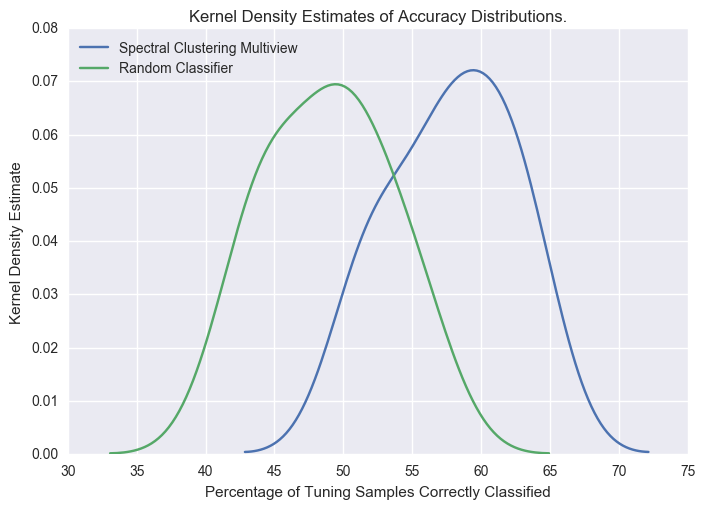

In [9]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
mult = [.61, .64, .62, .51, .51, .57, .6, .53, .64, .57, .56, .58, .62, .53, .59]
rand = np.random.binomial(100, .5, 18) / 100.
sns.distplot(np.array(mult) * 100, label = 'Spectral Clustering Multiview', norm_hist = True, hist=False)
sns.distplot(np.array(rand) * 100, label = 'Random Classifier', norm_hist = True, hist=False)
plt.title("Kernel Density Estimates of Accuracy Distributions.")
plt.xlabel("Percentage of Tuning Samples Correctly Classified")
plt.ylabel("Kernel Density Estimate")
plt.show()